In [1]:
import cv2
import matplotlib.pyplot as plt
import pandas as pd
import os
import seaborn as sns
import xml.etree.ElementTree as ET
import numpy as np
import plaidml.keras
import PIL.Image as Image
plaidml.keras.install_backend()

In [2]:
ss = cv2.ximgproc.segmentation.createSelectiveSearchSegmentation()

In [3]:
test_img = cv2.imread('data/Cars0.png')

In [4]:
ss.setBaseImage(test_img)
ss.switchToSelectiveSearchFast()
results = ss.process()

In [11]:
print(len(results)) #only about 1200 proposals so we'll go thru first 1000
print(results)

1276
[[161 192 133  46]
 [127 102  18  49]
 [278  95  78  24]
 ...
 [ 82   0 318 246]
 [ 82  40 281 157]
 [  0   0 400 263]]


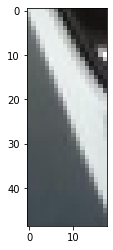

In [6]:
plt.imshow(test_img[102:102+49,127:127+18])

In [7]:
def read_pascal(xml_file: str):

    tree = ET.parse(xml_file)
    root = tree.getroot()

    list_with_all_boxes = []

    for boxes in root.iter('object'):

        filename = root.find('filename').text

        ymin, xmin, ymax, xmax = None, None, None, None

        for box in boxes.findall("bndbox"):
            ymin = int(float(box.find("ymin").text))
            xmin = int(float(box.find("xmin").text))
            ymax = int(float(box.find("ymax").text))
            xmax = int(float(box.find("xmax").text))

        list_with_single_boxes = [xmin, ymin, xmax, ymax]
        list_with_all_boxes.append(list_with_single_boxes)
    return filename, list_with_all_boxes

In [53]:
def compute_iou(boxA, boxB):
# determine the (x, y)-coordinates of the intersection rectangle
    xA = max(boxA[0], boxB[0])
    yA = max(boxA[1], boxB[1])
    xB = min(boxA[2], boxB[2])
    yB = min(boxA[3], boxB[3])
    # compute the area of intersection rectangle
    interArea = max(0, xB - xA + 1) * max(0, yB - yA + 1)
    # compute the area of both the prediction and ground-truth
    # rectangles
    boxAArea = (boxA[2] - boxA[0] + 1) * (boxA[3] - boxA[1] + 1)
    boxBArea = (boxB[2] - boxB[0] + 1) * (boxB[3] - boxB[1] + 1)
    # compute the intersection over union by taking the intersection
    # area and dividing it by the sum of prediction + ground-truth
    # areas - the intersection area
    iou = interArea / float(boxAArea + boxBArea - interArea)
    # return the intersection over union value
    return iou

In [54]:
X_car = []
X_no_car = []
car_save_path = 'use_data/plate/'
no_car_save_path = 'use_data/not_plate/'

In [55]:
total_not_car = 0
total_car = 0
for file in os.listdir('data/'):
    if '.png' in file:
        name,box_list = read_pascal('data/'+file.split('.')[0]+'.xml')
        ss = cv2.ximgproc.segmentation.createSelectiveSearchSegmentation()
        pic = cv2.imread('data/'+file)
        pic_copy = pic.copy()
        
        ss.setBaseImage(pic)
        ss.switchToSelectiveSearchFast()
        results = ss.process()
        
        car_count = 0
        no_car_count = 0
        total_counted = 0
        for found_box in results:
            found_box_use = [found_box[0],found_box[1],found_box[0]+found_box[2],found_box[1]+found_box[3]]
            image_roi = pic_copy[found_box[1]:found_box[3]+found_box[1],found_box[0]:found_box[0]+found_box[2]]
            iou = compute_iou(found_box_use,box_list[0]) #its a nested list, so we take the 1st element
            print(iou)
            print('THERE')
            if iou>0.7:
                if car_count < 16: #don't have enough memory for too many
                    
                    image_roi_use = cv2.resize(image_roi,(128,128))
                    image_roi_use = Image.fromarray(image_roi_use)
                    image_roi_use.save(car_save_path+'plate_'+str(total_car)+'.png')
                    
                    #X_car.append(image_roi_use)
                    
                    total_car += 1
                    car_count+=1
            
            if iou<0.3:
                if no_car_count < 16:
                    image_roi_use = cv2.resize(image_roi,(128,128))
                    image_roi_use = Image.fromarray(image_roi_use)
                    image_roi_use.save(no_car_save_path+'not_plate_'+str(total_not_car)+'.png')
                    
                    #X_no_car.append(image_roi)
                    
                    #print(no_car_save_path+'not_car_'+str(total_not_car)+'.png')
                    total_not_car+=1
                    no_car_count+=1
            
            if total_counted > 999:
                break
            
            total_counted+=1

0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.01518904109589041
THERE
0.03768967205090553
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.021883289124668436
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0020491803278688526
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.020956614611898506
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.02811447159508965
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE


THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.12261396811138559
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.040862146385271664
THERE
0.0
THERE
0.0
THERE
0.1755062680810029
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.020558002936857563
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.020915533422715956
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.07217589082638362
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
TH

0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.16486068111455107
THERE
0.13825575173889781
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.09923195084485407
THERE
0.0
THERE
0.012514408035567266
THERE
0.0
THERE
0.0
THERE
0.06540247678018576
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.010632344711807499
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.4779874213836478
THERE
0.0
THERE
0.0
THERE
0.18523297491039425
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0

0.03877478753541076
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.5310656704679513
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.12423417290673928
THERE
0.016843562528841716
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.04989747095010253
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.06528134045607512
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.17773094485423252
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.020190844973032775
THERE
0.0
THERE
0.0
THERE
0.07833458525592875
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.023587211373559458
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.30294047901351673
THERE
0.012150803118151303
THERE
0.3398963730569948
THERE
0.0
THERE


0.2079207920792079
THERE
0.6136765355722492
THERE
0.0
THERE
0.0
THERE
0.00232674090078112
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.4215091066782307
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0025860675610150314
THERE
0.0014788038120276043
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.09550716648291069
THERE
0.0029940119760479044
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.04270864718288641
THERE
0.0
THERE
0.17106321717406953
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.9725906277630415
THERE
0.0
THERE
0.055445544554455446
THERE
0.0
THERE
0.016941255404800955
THERE
0.0
THERE
0.11701170117011701
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.09360936093609361
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.04811196967487972
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE


0.08695652173913043
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.009883198562443846
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.020024629223108638
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.030783582089552237
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.030934424133963953
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.2012987012987013
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.06157003591585428
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
T

0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.04143947655398037
THERE
0.0
THERE
0.0
THERE
0.22235576923076922
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.007473143390938813
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.43795236215291483
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.3230431602048281
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.005190311418685121
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.04717737318218253
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.09134615384615384
THERE
0.3445155250429084
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.005699810006333122
THERE
0.0
THERE

0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.3394919168591224
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.02709744658676394
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.027692307692307693
THERE
0.0
THERE
0.03054862842892768
THERE
0.4627681952040387
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.11001410437235543
THERE
0.0
THERE
0.0
THERE
0.05529225908372828
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.06933367635708773
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.09972862957937585
THERE
0.06689202366248456
THERE
0.0
THERE
0.0333569907735983
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.013326534081251062
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.06544968833481746
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0018879798615481435
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.2732615083251714
THERE
0.0
THERE
0.0
THERE
0.0
THERE


0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.05874125874125874
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.004113261596092401
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THE

0.0
THERE
0.0
THERE
0.06571390410044077
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.10287589268480989
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.6319845857418112
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.05118601747815231
THERE
0.0
THERE
0.0
THERE
0.1197214734950584
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.049185244426672
THERE
0.23649058894960534
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.8066546762589928
THERE
0.6900420757363254
THERE
0.2784174785946265
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.040880503144654086
THERE
0.0
THERE
0.05692467893092676
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.049352994282275055
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.11549295774647887
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.10987425273139559
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
T

0.0
THERE
0.0
THERE
0.05841799709724238
THERE
0.0
THERE
0.25127334465195245
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.040978941377347755
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.015930485155684286
THERE
0.0
THERE
0.0
THERE
0.9244747302668939
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.15785627283800244
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.02881500567518082
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.016536922197299554
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.26469085334695963
THERE
0.014759761331518895
THERE
0.048303622771707876
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE


0.0
THERE
0.04187725631768953
THERE
0.0
THERE
0.02565901120036203
THERE
0.0
THERE
0.0
THERE
0.08171531096228661
THERE
0.0
THERE
0.004844532432747176
THERE
0.012684941454116366
THERE
0.005001505082547989
THERE
0.0
THERE
0.030539451704824604
THERE
0.00652148596715966
THERE
0.004238965878653779
THERE
0.07168976359613369
THERE
0.0
THERE
0.0
THERE
0.021660649819494584
THERE
0.0
THERE
0.004844532432747176
THERE
0.0
THERE
0.09055549085827413
THERE
0.2324589778274422
THERE
0.27641687399185283
THERE
0.024339117270292303
THERE
0.0
THERE
0.007965529288459299
THERE
0.02049609875393036
THERE
0.0
THERE
0.2227961819202695
THERE
0.024556010296486974
THERE
0.012018166996622802
THERE
0.1009688934217236
THERE
0.18652440229203715
THERE
0.0743260501079713
THERE
0.004471876091766624
THERE
0.005939210434377547
THERE
0.02235938045883312
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.6497415697078713
THERE
0.012297659252358217
THERE
0.1228062083439035
THERE
0.17407634748041623
THERE
0.002572004541557569
THERE
0.0
THERE

0.2582247939967694
THERE
0.0
THERE
0.04052637708163503
THERE
0.0034598085572598316
THERE
0.0006661393063824472
THERE
0.0
THERE
0.001965845909451946
THERE
0.0
THERE
0.09678746327130265
THERE
0.8686520022560632
THERE
0.03730431886310647
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.3312727522494677
THERE
0.0066202488300422324
THERE
0.09871654596293787
THERE
0.0
THERE
0.0
THERE
0.04457901478979853
THERE
0.013644257008186554
THERE
0.007825783160591591
THERE
0.0
THERE
0.025114417791679125
THERE
0.0
THERE
0.0
THERE
0.15916774621631016
THERE
0.0
THERE
0.11640620581748261
THERE
0.020123442412949808
THERE
0.011525333569750433
THERE
0.0
THERE
0.017204105318253192
THERE
0.0
THERE
0.031715171031046846
THERE
0.006947133453294763
THERE
0.0
THERE
0.12354209659841862
THERE
0.28980407076279247
THERE
0.0
THERE
0.03438035408338092
THERE
0.4512644065349727
THERE
0.0
THERE
0.091079270106195
THERE
0.006428321881914522
THERE
0.0
THERE
0.0596509554598995
THERE
0.07159659951088855
THERE
0.023363291313496824


THERE
0.0
THERE
0.07001021580896437
THERE
0.0
THERE
0.0
THERE
0.05872480225686075
THERE
0.0
THERE
0.08619588813689184
THERE
0.0012906397885809107
THERE
0.0
THERE
0.10869380615139008
THERE
0.0
THERE
0.07757252586808862
THERE
0.0
THERE
0.0
THERE
0.13796247420701568
THERE
0.0
THERE
0.0048447581114760205
THERE
0.03933086451283361
THERE
0.0
THERE
0.07023368663006002
THERE
0.0
THERE
0.0
THERE
0.03878814966160133
THERE
0.0
THERE
0.0
THERE
0.052312313483781625
THERE
0.0
THERE
0.021261652407099988
THERE
0.2129104797672451
THERE
0.0
THERE
0.0
THERE
0.006257449344457688
THERE
0.03892266285219552
THERE
0.05107904482186183
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.18243792518219548
THERE
0.0
THERE
0.053085366212518026
THERE
0.0
THERE
0.0
THERE
0.2005167378117277
THERE
0.0
THERE
0.03543608734516664
THERE
0.0
THERE
0.11981020166073547
THERE
0.0
THERE
0.0
THERE
0.07163836036266122
THERE
0.0
THERE
0.0
THERE
0.23994671732887854
THERE
0.28433454967957444
THERE
0.18732153055396916
THERE
0.0
THERE
0.0
THERE
0.

0.0
THERE
0.022209448160535116
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.23654916512059368
THERE
0.07045755968169762
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.09692372524230931
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.5686886708296164
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.01690084835630965
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.5380794701986755
THERE
0.0
THERE
0.3706395348837209
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0


0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.19809244314013205
THERE
0.2389685854367169
THERE
0.0
THERE
0.0
THERE
0.32571503199686563
THERE
0.0
THERE
0.0
THERE
0.07043286867204696
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.04789009521801764
THERE
0.0
THERE
0.01303925648494937
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.05324357405140759
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.018663455749548464
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.05837376285658839
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0009088843444671666
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.019702276707530646
THERE
0.0
THERE
0.048759401

0.0
THERE
0.0
THERE
0.002816372512204281
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.15894175553732567
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0736196319018405
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.019044321329639888
THERE
0.0
THERE
0.0
THERE
0.03172049189748305
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.011924009700889249
THERE
0.0
THERE
0.0
THERE
0.39832228385874713
THERE
0.07075471698113207
THERE
0.0
THERE
0.0
THERE
0.21545319465081725
THERE
0.0
THERE
0.0
THERE
0.047311827956989246
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.583264971287941
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.19846712384025816
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.011513318372524148
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.019319467409276824
THERE
0.0
THERE
0.03646046702171241
THERE
0.0
THERE
0.0
THERE
0.020538243626062325
THERE
0.0
THERE
0.0
THERE
0.05650123051681706
THERE
0.0
THERE
0.0
THERE
0.41460986218099877
THERE
0.0
THERE
0.0
THER

THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0327613104524181
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.03807106598984772
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.06156477126977341
THERE
0.0
THERE
0.0
THERE
0.03382663847780127
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.32338308457711445
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.022964509394572025
THERE
0.0
THER

0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.03877171215880893
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.6293532338308457
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.011854725724754822
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.011345469547728328
THERE
0.0
THERE
0.05950320235416306
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.8151023288637967
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0


0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.1698271054099275
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.07676969092721835
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0014895729890764648
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.725
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.45750708215297453
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0

0.0
THERE
0.0
THERE
0.0
THERE
0.12374185908821789
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.7241379310344828
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.05285788850133802
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.03259162691475808
THERE
0.0
THERE
0.0
THERE
0.12136815005516734
THERE
0.0
THERE
0.04890282131661442
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.10606060606060606
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.490282131661442
THERE
0.0
THERE
0.033438038301752966
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0672736469398078
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.3255434227982447
THERE
0.0
THERE
0.0
THERE
0.3512167515563101
THERE
0.061442006269592474
THERE
0.0
THERE
0.0
THERE
0.061442006269592474
THERE
0.0
THERE
0.0
THERE
0.5542483660130719
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0


THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.11642183259380519
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.055834848646914105
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.14913583580880369
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.2862817796610169
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.31525625744934443
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.01282525588851893
THERE
0.0
THERE
0.0
THERE
0.29484955885679814
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.1389281583344043
THERE
0.14396441508629873
THERE
0.0
THERE
0.0
THERE
0.03559257856872397
THERE
0.05479188208340936
THERE
0.0
THERE
0.0
THERE

0.0
THERE
0.0
THERE
0.015879163439194422
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.03111577964519141
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.008388256440982624
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.43426724137931033
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.08482457376356208
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.07356512141280354
THERE
0.0026235242675994755
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.42317460317460315
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0729362731917182
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.7716584158415841
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.03152909767027937
THERE
0.

0.0
THERE
0.5237713675213675
THERE
0.0
THERE
0.07788595271210014
THERE
0.02731197771587744
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.036362624932781994
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0698931735278791
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.07288907003600299
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.8453505718547986
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.06233312142403052
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.009484609878310665
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.2606326422115896
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.

0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.9733333333333334
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.037142857142857144
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.18863936591809777
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.03851851851851852
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.07501275727164483
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.05523809523809524
THERE
0.03865979381443299
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.4364791288566243
THERE
0.0
THERE
0.0
THERE
0.04296296296296296
THERE
0.0
THERE
0.0
THERE
0.15550547327752737
THERE
0.05333333333333334
THERE
0.4292527821939587
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE


THERE
0.0
THERE
0.03371090346423099
THERE
0.0
THERE
0.0
THERE
0.04440589765828274
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.04080652904464714
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.024436724781931634
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.024543903399396248
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.010780894180046697
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.025525974673447003
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.2308641975308642
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.048133848133848134
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
TH

0.0
THERE
0.0
THERE
0.032886555202431944
THERE
0.005061658426000117
THERE
0.17651904667215862
THERE
0.0
THERE
0.02152244684699168
THERE
0.02821430006832523
THERE
0.0
THERE
0.040930979133226325
THERE
0.019291829106547163
THERE
0.009337217190056262
THERE
0.03433602347762289
THERE
0.0
THERE
0.018447811583135725
THERE
0.0017017571632103846
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.732653138059561
THERE
0.025234033289132544
THERE
0.04567157982146564
THERE
0.01032474938471697
THERE
0.00917396124001376
THERE
0.010308869592799651
THERE
0.7086322905704902
THERE
0.0
THERE
0.1503771621797373
THERE
0.5311126060110997
THERE
0.0021879226668788288
THERE
0.0
THERE
0.053748611270735165
THERE
0.1296776199854877
THERE
0.0
THERE
0.0323138137534665
THERE
0.03986978015353081
THERE
0.0
THERE
0.007495203070035177
THERE
0.017775661627584018
THERE
0.00835904070056722
THERE
0.020497568425706363
THERE
0.003938748442586713
THERE
0.09015704776061527
THERE
0.0
THERE
0.240505136179

0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.3228736581337737
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.11202635914332784
THERE
0.0588628762541806
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.06417112299465241
THERE
0.0
THERE
0.0
THERE
0.04724498445888669
THERE
0.0
THERE
0.009824861170439982
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.009888220120378332
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THER

0.0
THERE
0.1355072463768116
THERE
0.09632224168126094
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.732734693877551
THERE
0.10153386724582598
THERE
0.0
THERE
0.0
THERE
0.22332415059687788
THERE
0.017069701280227598
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.4452380952380952
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.3933588761174968
THERE
0.0
THERE
0.0
THERE
0.33189655172413796
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.5219110378912686
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
T

0.011104104405998958
THERE
0.10642491131257391
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0476047002109069
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.29347826086956524
THERE
0.0
THERE
0.13333333333333333
THERE
0.09391304347826086
THERE
0.7037037037037037
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.10864197530864197
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.022323983972524327
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.01342898540481323
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.10833333333333334
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.8192771084337349
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.08425925925925926
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0

0.11503267973856209
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.040172241768628894
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.04163265306122449
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.03234152652005175
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.03590285110876452
THERE
0.0
THERE
0.0
THERE
0.15298300188867903
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.08208154506437768
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.1323008849557522
THERE
0.0
THERE
0.0
THERE
0.25764424355224674
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.15544041450777202
THERE
0.0
THERE
0.0
THERE


0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.003081996006661088
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.02025151069737057
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THE

0.0
THERE
0.0
THERE
0.15880322209436135
THERE
0.0
THERE
0.0
THERE
0.8274531422271224
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.05397909110305099
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.095626188535724
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.4561679790026247
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.11392405063291139
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.08285385500575373
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.

0.08616780045351474
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0835222978080121
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.7898715041572184
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.07084870848708487
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.08053078491645616
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.10291970802919707
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.1443850267379679
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.06567386448250186
THERE
0.11895910780669144
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE

0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.20730897009966778
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.046635576282478344
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.5248251748251749
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.20686209193870753
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.11725516322451698
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.6126530612244898
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.10992671552298468
THERE
0.0
THERE
0.002618532225403254
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.5411934378943574
THE

0.0
THERE
0.0
THERE
0.0
THERE
0.01132342533616419
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.06854130052724078
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.06844444444444445
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.013998645292391058
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.1075085324232082
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.050581739301912836
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.1065123010130246
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.006644518272425249
THERE
0.8329107505070994
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
TH

0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.002437133045308519
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.1300684570826751
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.021757322175732216
THERE
0.0
THERE
0.010385931783311696
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0037332915622389305
THERE
0.009009576612903226
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.046620046620046623
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.018862946840786175
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
T

0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0054801345123925765
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.314214463840399
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.6748466257668712
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.6993006993006993
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0178808925668686

0.0
THERE
0.0
THERE
0.0
THERE
0.03439153439153439
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.05448530842576377
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.031746031746031744
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.06382978723404255
THERE
0.3368623676612127
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.018518518518518517
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.03492063492063492
THERE
0.0
THERE
0.047459144839937316
THERE
0.0
THERE
0.0
THERE
0.014676590837614006
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.07288359788359788
THERE
0.0
THERE
0.1637874192272188
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.04126984126984127
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.03201058201058201
THERE
0.0
THERE
0.0
THERE
0.08161414645205169
THERE
0.0
THERE
0.0
THERE
0.014026650636208797
THERE
0.0
THERE
0.0
THE

0.0
THERE
0.0
THERE
0.02130003672420125
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.026077097505668934
THERE
0.0
THERE
0.07227891156462585
THERE
0.0
THERE
0.34202717476183037
THERE
0.0
THERE
0.229421768707483
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.047619047619047616
THERE
0.0
THERE
0.0
THERE
0.017687074829931974
THERE
0.0
THERE
0.0
THERE
0.5968349660889224
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.1293150684931507
THERE
0.0
THERE
0.7623515613546401
THERE
0.0
THERE
0.0
THERE
0.031746031746031744
THERE
0.0
THERE
0.3292715706477914
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.02695167286245353
THERE
0.0854875283446712
THERE
0.0
THERE
0.0031207226936764304
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.014965986394557823
THERE
0.09377859103385179
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.017687074829931974
THERE
0.0
THERE
0.010317460317460317
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.012698412698412698
THERE
0.061224489795918

0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.842809364548495
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0915963943006688
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.042026616857342984
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.3165829145728643
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.02087803746447834
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.011907011907011907
THERE
0.07777777777777778
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.4366660890660198
THERE
0.0
THERE
0.18452380952380953
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.026119402985074626
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0901436354

0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.04861952861952862
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.06820973075106282
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.03729146221786065
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.

0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.10362694300518134
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.2650962176509622
THERE
0.07406921005975442
THERE
0.0
THERE
0.0
THERE
0.08756567425569177
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.039926800865080686
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.35956284153005463
THERE
0.03387096774193549
THERE
0.0
THERE
0.017203352448169385
THERE
0.0
THERE
0.9108742004264392
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.4958553127354936
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.07497507477567299
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.03178494441861448
THERE

0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.4409448818897638
THERE
0.0
THERE
0.0
THERE
0.048577376821651634
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.04732824427480916
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.037641997714593
THERE
0.0
THERE
0.0
THERE
0.45584045584045585
THERE
0.5303571428571429
THERE
0.0
THERE
0.023255813953488372
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.018558255523980747
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.42328042328042326
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THE

0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.06612244897959184
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.18292682926829268
THERE
0.0
THERE
0.0
THERE
0.005239991616013414
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.10204081632653061
THERE
0.0
THERE
0.0
THERE
0.030857200433260283
THERE
0.015200233849751535
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.45219638242894056
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.1763265306122449
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.1613540569020021
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.04047160185919964
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE

0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.021238938053097345
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.6266666666666667
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.7301587301587301
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.11000763941940413
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.03277569136223967
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0873015873015873
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.1511216056670602
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0

0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.34933901918976545
THERE
0.0
THERE
0.0
THERE
0.151611328125
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.2516743471582181
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.003385240352064997
THERE
0.0
THERE
0.0
THERE
0.04638671875
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0754828247088309
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.056396484375
THERE
0.07332617257429287
THERE
0.0
THERE
0.9252643948296122
THERE
0.0
THERE
0.0
THERE
0.18546791065875035
THERE
0.25440993788819877
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.744873046875
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0

0.0
THERE
0.024420529801324503
THERE
0.0
THERE
0.018748839799517355
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.014955899271379266
THERE
0.0
THERE
0.0
THERE
0.02132998745294856
THERE
0.0
THERE
0.006518251103088648
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.9069767441860465
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.004354858778151051
THERE
0.0
THERE
0.0037293553542887587
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.08333333333333333
THERE
0.16666666666666666
THERE
0.0262891809908999
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE

0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.07113821138211382
THERE
0.03191085222236292
THERE
0.0
THERE
0.0
THERE
0.06013493693165151
THERE
0.0
THERE
0.052301614565441426
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.03997549395006892
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.2568144499178982
THERE
0.27507163323782235
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.000832408435072142
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.02835912468470925
THERE
0.0
T

0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.004883691042282483
THERE
0.0
THERE
0.34431934493346983
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.014545454545454545
THERE
0.0
THERE
0.0
THERE
0.059244126659857
THERE
0.021926910299003323
THERE
0.0
THERE
0.0
THERE
0.29504400185270957
THERE
0.0
THERE
0.3397926994141505
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.8059125964010283
THERE
0.0
THERE
0.06927175843694494
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.15846711548420508
THERE
0.0
THERE
0.0
THERE
0.01909550746760049
THERE
0.1562173458725183
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.048859934853420196
THERE
0.27517447657028915
THERE
0.0
THERE
0.0
THERE
0.06346967559943582
THERE
0.0
THERE
0

0.0
THERE
0.0
THERE
0.0
THERE
0.007343998503134063
THERE
0.10166104658423879
THERE
0.0
THERE
0.0
THERE
0.574825479930192
THERE
0.0
THERE
0.07059895240264177
THERE
0.0
THERE
0.0
THERE
0.07081303859123267
THERE
0.0
THERE
0.0
THERE
0.09966279505432746
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.05175309678773882
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.14365166221137804
THERE
0.030429305165229188
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.9743080551073601
THERE
0.9746416758544653
THERE
0.038466341950793057
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.05301448919449902
THERE
0.0
THERE
0.0
THERE
0.06819033345822405
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.13500686898963407
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.47639919082939985
THERE
0.0
THERE
0.0
THERE
0.012456832757770103
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0282253028599975
THERE
0.0

0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.03233830845771144
THERE
0.0
THERE
0.0031189484688019468
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.08098006644518273
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.026259089684890925
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.060036945812807885
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
TH

0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0465444287729196
THERE
0.0
THERE
0.015554334502726235
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.07913978494623657
THERE
0.0
THERE
0.05830074653394952
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.06693909320879549
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.1537649542575651
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
T

0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.8541114058355438
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.6754910333048676
THERE
0.7721739130434783
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.47163362952836635
THERE
0.1447158789166224
THERE
0.059710144927536235
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.03855072463768116
THERE
0.0
THERE
0.0
THERE
0.5248618784530387
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.5373913043478261
THERE
0.0
THERE
0.05420289855072464
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.42621293800539084
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE

0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.7335157060654656
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.1263537906137184
THERE
0.0
THERE
0.0
THERE
0.049002579083109635
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0430239704978488
THERE
0.0028101399215502607
THERE
0.47124413145539906
THERE
0.0060708263069139965
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.06927660147439997
THERE
0.0
THERE
0.0
THERE
0.36163170371695663
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.20738745671412082
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.02943722943722944
THERE
0.15699443803127294
THERE
0.046753246753246755
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.05800865800865801
THERE
0.36887489734464823
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THE

0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.16214530714062989
THERE
0.23370786516853934
THERE
0.0
THERE
0.035907093534212176
THERE
0.007866868381240545
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.11775362318840579
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.22760942760942762
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.1888162672476398
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.6239946380697051
THERE
0.30264550264550266
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.05208997359074766
THERE
0.0
THERE
0.0
THERE


0.016913742415712765
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.03180877093920572
THERE
0.02215122470713525
THERE
0.0
THERE
0.0
THERE
0.018423885641088534
THERE
0.008243500317057704
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.02018904833724073
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.05545529122231337
THERE
0.01848762477779297
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.027565958487950088
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.024279210925644917
THERE
0.0
THERE
0.0
THERE
0.054147142456646244
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.03353424113897363
THERE
0.04737874964956546
THERE
0.01715518335236645
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.012771102546663644
THERE
0.0
THERE
0.05479229989868288
THE

0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.026755852842809364
THERE
0.15564763105746712
THERE
0.0
THERE
0.0
THERE
0.12648631808505115
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.5539669189795347
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.07494615936826993
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.07421625079974409
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.03700588730025231
THERE
0.0
THERE
0.0
THERE
0.02332127060715722
THERE
0.0
THERE
0.0
THERE
0.026683024076061955
THERE
0.08317161075686166
THERE
0.0
THERE
0.08573540280857354
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.005186081544958388
THERE
0.0
TH

0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.42052144659377627
THERE
0.0
THERE
0.0
THERE
0.24222035323801513
THERE
0.22349624060150375
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.054528361015355686
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.022307692307692306
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.08142894667717362
THERE
0.02926829268292683
THERE
0.0
THERE
0.0
THERE
0.026137899954934655
THERE
0.1406060606060606
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.008799433599676342
THERE
0.3647567018167958
THERE
0.0
THERE
0.

0.0
THERE
0.014655593551538837
THERE
0.0
THERE
0.005016904787872178
THERE
0.0
THERE
0.14841478119015533
THERE
0.0
THERE
0.0
THERE
0.03741935483870968
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.1112339566408691
THERE
0.10518407212622088
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.044068884372660176
THERE
0.04
THERE
0.03741935483870968
THERE
0.13123056556140514
THERE
0.0
THERE
0.006512053010396436
THERE
0.0
THERE
0.07074797522629823
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.008210526315789474
THERE
0.0518475073313783
THERE
0.0
THERE
0.07937978113958355
THERE
0.0
THERE
0.12048448188139521
THERE
0.09244461589330982
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.27357654278895327
THERE
0.0
THERE
0.005031042603296939
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.03354838709677419
THERE
0.0
THERE
0.0
THERE
0.2500804289544236
TH

0.0
THERE
0.0
THERE
0.6807511737089202
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.062249888839484215
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.09879872517773965
THERE
0.0
THERE
0.0
THERE
0.05082800459091654
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.027331738981892725
THERE
0.0
THERE
0.03479432066894887
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.12419354838709677
THERE
0.0
THERE
0.13548387096774195
THERE
0.4323308270676692
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.05196546810828933
THERE
0.1360544217687075
THERE
0.33011630784459295
THERE
0.024147376893816453
THERE
0.0
THERE
0.037043570294584584
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.05870967741935484
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.05065359477124183

0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.05833136931416451
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.08058326937835764
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.02988473032588587
THERE
0.0
THERE
0.0
THERE
0.02830733679953784
THERE
0.0
THERE
0.0
THERE
0.6441558441558441
THERE
0.0
THERE
0.0
THERE
0.07472826086956522
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.02493765586034913
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.004548408057179987
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0457516339869281
THERE
0.0
THERE
0.0
THERE
0.129654903489959

0.08943089430894309
THERE
0.0
THERE
0.029331445332254475
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0832520325203252
THERE
0.0
THERE
0.25365853658536586
THERE
0.0
THERE
0.09747876072530538
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.026016260162601626
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.03295392953929539
THERE
0.25561097256857856
THERE
0.049613060532174284
THERE
0.0
THERE
0.0
THERE
0.10603829160530191
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.2918524523713012
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.18686737607059434
THERE
0.08065040650406505
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.2337822302512728
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.1586991869918699
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.04755271626879293
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
T

THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0836734693877551
THERE
0.008997542134831461
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.016443410603994544
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.03220569752827818
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.03450506793185249
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0

THERE
0.0
THERE
0.036821077637404165
THERE
0.0
THERE
0.0
THERE
0.022885906040268456
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.004981589776911414
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.011894273127753305
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.06104824300178678
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.3605150214592275
THERE
0.0
THERE
0.0
THERE
0.3040650406504065
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE


0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.022702104097452935
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.025098967473370606
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.019278996865203762
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.032446976891421335
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.005198867238682954
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0022095378383354815
THERE
0.03560882404029877
THERE
0.0
THERE
0.0
THERE
0.0028647822765469825
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0025869140008833364
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.01259910269805175
THERE

0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.5604395604395604
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.05303545410393395
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE

THERE
0.022943875750088244
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.014429270806493172
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.024213075060532687
THERE
0.3916754478398314
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.06241592682270648
THERE
0.0
THERE
0.0
THERE
0.046799354491662185
THERE
0.0
THERE
0.0
THERE
0.4696953614266001
THERE
0.0
THERE
0.0
THERE
0.04896421845574388
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.44336830777508746
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.060263653483992465
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.36398354876615746
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.05649717514124294
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.5149313962873285
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.03336023675006726
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THER

THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.029532403609515995
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0036362167185164237
THERE
0.009893915242126093
THERE
0.022740432699899983
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.008692502716407098
THERE
0.0
THERE
0.0
THERE
0.0096051227321238
THERE
0.008813559322033898
THERE
0.0006222775357809583
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.04984740590030519
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.42712345428745185
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.15097402597402598
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.041051660516605165
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0

0.06508674452885815
THERE
0.0
THERE
0.0
THERE
0.02319526627218935
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.01124859392575928
THERE
0.07424071991001124
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.04142011834319527
THERE
0.0
THERE
0.0
THERE
0.12142011834319527
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.1391715976331361
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.008854712804380752
THERE
0.2840718079741814
THERE
0.0
THERE
0.03131991051454139
THERE
0.0
THERE
0.03727810650887574
THERE
0.20612269788998658
THERE
0.0
THERE
0.0
THERE
0.023612750885478158
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0463905325443787
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THE

0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.7834757834757835
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.65
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.7595505617977528
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.018623653631877752
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.

0.0017211226161063765
THERE
0.0
THERE
0.05914176307864219
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.030753632984116257
THERE
0.0
THERE
0.0
THERE
0.03668261562998405
THERE
0.0
THERE
0.0
THERE
0.6748847926267281
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.05806451612903226
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.03263403263403263
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.6050691244239631
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.026351813826146476
THERE
0.0
THERE
0.27373271889400924
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.8331797235023042
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.8385416666666666
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.6451612903225806
THERE
0.0

0.0
THERE
0.0
THERE
0.0
THERE
0.2868292682926829
THERE
0.0
THERE
0.28346456692913385
THERE
0.0
THERE
0.11433756805807622
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.026417525773195876
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.08472553699284009
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.010739490641301013
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.18694362017804153
THERE
0.036536565562837096
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.029024943310657598
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.1407766990291262
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.03679852805887764
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.11308054745344402
TH

0.0
THERE
0.3075096467794598
THERE
0.0
THERE
0.16713539574126154
THERE
0.0
THERE
0.0
THERE
0.12716262975778547
THERE
0.0
THERE
0.0
THERE
0.12398785425101215
THERE
0.0
THERE
0.06542056074766354
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.30065448595582217
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0038302124195100287
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0030726754542215887
THERE
0.08329979879275654
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0

0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.26024096385542167
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.11678832116788321
THERE
0.0
THERE
0.024193548387096774
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.12121212121212122
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.002207505518763797
THERE
0.0
THERE
0.3595505617977528
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.06428571428571428
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THE

0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.14689265536723164
THERE
0.0
THERE
0.0
THERE
0.11092278719397364
THERE
0.24858757062146894
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.006235218232638142
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.8662900188323918
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.00856979622928966
THERE
0.0
THERE
0.0
THERE
0.05386064030131827
THERE
0.10734463276836158
THERE
0.0
THERE
0.0
THERE
0.06782511210762332
THERE
0.0
THERE
0.0
THERE
0.038041431261770245
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.12259887005649718
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.027988030276359797
THERE
0.0
THERE
0.0
TH

0.0
THERE
0.017839766461239054
THERE
0.017869656622284513
THERE
0.0635830072666294
THERE
0.0
THERE
0.0
THERE
0.01209752466033873
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.060830468130124306
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.1457142857142857
THERE
0.0
THERE
0.0
THERE
0.19270358306188926
THERE
0.0
THERE
0.0
THERE
0.14057163401042602
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.001336898395721925
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.014637506457723437
THERE
0.0
THERE
0.0
THERE
0.26522713383581176
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.00963020030816641
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.04094193203104094
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0479539641943734
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0


0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.5887545837294581
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.06690331044062042
THERE
0.08883469778784184
THERE
0.0
THERE
0.05395894428152493
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.02048273872487739
THERE
0.0
THERE
0.0
THERE
0.16576250753465943
THERE
0.0
THERE
0.017885627015102663
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.04600345025876941
THERE
0.0
THERE
0.0
THERE
0.07419064748201439
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.051577152600170505
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.19585907497077976
THERE
0.0
THERE
0.2028985507246377
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0891017531176577
THERE
0.009309481589652654
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.14208709345284962
THERE
0.0
THERE
0.29960605432303544
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.036894449791

0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.10655595917661305
THERE
0.010111223458038422
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.33852353910972705
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.04599567099567099
THERE
0.0
THERE
0.11670235546038545
THERE
0.0
THERE
0.02410958904109589
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.04756022235948116
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.07413441955193482
THERE
0.0
THERE
0.055611729019211326
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.36615811373092927
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.014337529336462556
THERE
0.464030131826742
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THE

0.010565897013580286
THERE
0.0075200802141889515
THERE
0.0013625573498259546
THERE
0.03827240823902121
THERE
0.05514725490405231
THERE
0.0035200375470671686
THERE
0.009216098305048588
THERE
0.00345603686439322
THERE
0.005173388516144172
THERE
0.01109345166348441
THERE
0.022400238935881982
THERE
0.06869406607003808
THERE
0.020551041217714894
THERE
0.008565424697863444
THERE
0.005088054272578907
THERE
0.007338744946612764
THERE
0.0
THERE
0.001384377828656621
THERE
0.04160044373806654
THERE
0.028629638716146304
THERE
0.011946794099137058
THERE
0.009984106497135969
THERE
0.0036267053515237494
THERE
0.05139254818718066
THERE
0.012586800925876543
THERE
0.16544176471215694
THERE
0.004010709447567441
THERE
0.003200034133697426
THERE
0.011680124587995605
THERE
0.01687630030943404
THERE
0.004917666343789584
THERE
0.0
THERE
0.015488165207095542
THERE
0.007040075094134337
THERE
0.019552208556891274
THERE
0.22323438116673244
THERE
0.009322766109505169
THERE
0.015488165207095542
THERE
0.004433691794

0.0
THERE
0.0
THERE
0.0258751902587519
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.07434944237918216
THERE
0.0
THERE
0.13952020202020202
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.004750844594594595
THERE
0.0296871431833752
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.012810794420861128
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.04856075587782905
THERE
0.0
THERE
0.0
THERE
0.012836895910780669
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.004271222637479978
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.07234042553191489
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.004462

0.022090059473237042
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.007299631715413453
THERE
0.002889682134965154
THERE
0.0
THERE
0.0010885573413587756
THERE
0.0
THERE
0.0
THERE
0.004813294275228958
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.01105
THERE
0.0
THERE
0.0
THERE
0.022868377483443707
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.007138242894056847
THERE
0.0
THERE
0.0199126905108371
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0126357918810749
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.008207070707070708
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.06394675925925926
THERE
0.02981029810298103
THERE
0.0
THERE
0.02759718720976516
THERE
0.031521894166310085
THERE
0.0
THERE
0.0
THERE
0.015476190476190477
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.06063100137174211
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.04897506925207756
THERE
0.0095818248823

0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.22335766423357664
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.13550018057060312
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.01602158986096403
THERE
0.0
THERE
0.0
THERE
0.38915779283639884
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.06609667872410391
THERE
0.0
THERE
0.0
THERE
0.8624078624078624
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.20057306590257878
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.015879017013232515
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.07365804693848287
THERE
0.0
THERE
0.0
THERE
0.1285

0.0
THERE
0.0
THERE
0.0
THERE
0.46938775510204084
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0998439937597504
THERE
0.07330246913580248
THERE
0.0
THERE
0.09645061728395062
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.07407407407407407
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.04288631722260041
THERE
0.0
THERE
0.18325617283950618
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.6944444444444444
THERE
0.0
THERE
0.08

0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.2898550724637681
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.005062579102798481
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.055401662049861494
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0

0.07954545454545454
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.08164430488153011
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.13445378151260504
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.07495741056218058
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.7811539774667122
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.9157894736842105
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.10297029702970296
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.004501385041551247
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.8916083916083916
THERE
0.0
THERE
0.0
THERE
0.9629629629629629
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.1534090909090909
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THER

0.0
THERE
0.0
THERE
0.12296564195298372
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.07506108044520858
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.09186602870813397
THERE
0.018552274023461525
THERE
0.0
THERE
0.0
THERE
0.018720167906026788
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0280040733197556
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.055656199677938806
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.017641804376953996
THERE
0.0
THERE
0.11573236889692586
THERE
0.0
THERE
0.028304388174466392
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.05274138362680464
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.006458966565349544
THERE
0.0
THERE
0.0
THERE
0.0036534446764091857
THERE
0.0
THERE
0.0
THERE
0.11271850512356842
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE

0.05266711681296422
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.24404272801972063
THERE
0.0
THERE
0.04354906248546038
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.15688659166920035
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.00070779756989501
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE


0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.4111867959130207
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.015410568549674007
THERE
0.0494120755714097
THERE
0.0
THERE
0.0
THERE
0.034869240348692404
THERE
0.6774595267745953
THERE
0.03507000717341056
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.26415495955725843
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.08168538411458333
THERE
0.0
THERE
0.0
THERE
0.09875541125541125
THERE
0.09165628891656288
THERE
0.12124711316397228
THERE
0.20268564793780605
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.002225232198142415
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.008030336828016953
THERE
0.0
THERE
0.0
THERE
0.005770617937004088
THERE
0.0
THERE
0.0
THERE
0.2478548058522131
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.16345723242274968
THE

0.0
THERE
0.0
THERE
0.041353383458646614
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.041353383458646614
THERE
0.037218045112781956
THERE
0.0
THERE
0.08928571428571429
THERE
0.0
THERE
0.0
THERE
0.22040816326530613
THERE
0.0
THERE
0.8750311177495643
THERE
0.0
THERE
0.42633329326441477
THERE
0.7054361567635904
THERE
0.042293233082706765
THERE
0.060765191297824456
THERE
0.0
THERE
0.0770655798443868
THERE
0.0
THERE
0.10583484194401895
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.039473684210526314
THERE
0.0
THERE
0.0
THERE
0.04755639097744361
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.03468045112781955
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.008019793532975002
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.3188161468577316
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.013926215489860738
THERE
0.07918289986311466
THERE
0.0
THERE
0.013533834586466165
T

0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.1549985919459307
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0411032990805841
THERE
0.16794459559732872
THERE
0.057755775577557754
THERE
0.04981549815498155
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.04002163331530557
THERE
0.0
THERE
0.0
THERE
0.43706777316735823
THERE
0.0
THERE
0.06760411032990805
THERE
0.07639505774045062
THERE
0.09653356735410268
THERE
0.0
THERE
0.0
THERE
0.27426057198728915
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.1451234901748693
THERE
0.03461330448891293
THERE
0.08076437714079683
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.028313334232169342
THERE
0.0
THERE
0.0
THERE
0.02523886785649901
THERE
0.0
THERE
0.0
THERE
0.09659090909090909
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.6782044348296377
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0


0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.10886716910032972
THERE
0.14118419612564298
THERE
0.0
THERE
0.04002163331530557
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.04595653722835768
THERE
0.0
THERE
0.0
THERE
0.46438450899031813
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.04452421219756325
THERE
0.20046620046620048
THERE
0.17710727969348658
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.10223642172523961
THERE
0.0
THERE
0.6259239228411754
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.6951127819548872
THERE
0.0
THERE
0.0
THERE
0.07796917497733455
THERE
0.0
THERE
0.0
THERE
0.273795457529211
THERE
0.0
THERE
0.08450704225352113
THERE
0.6263550135501355
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.047714329690626445
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THER

0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.2458000610900205
THERE
0.0
THERE
0.01788532351394003
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.12476903442101453
THERE
0.040679417642021126
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.149299624188589
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.040610687022900764
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.024732824427480916
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.004379562043795621
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.17488118759011054
THERE
0.0026323486399

0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.03669724770642202
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.45659928656361476
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.014463749658873828
THERE
0.12915016752969843
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.031277436347673396
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.00443650255715078
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.04033485540334855
THERE
0.0
THERE
0.036787307882994544
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE

0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.005423940149625935
THERE
0.0
THERE
0.01929902395740905
THERE
0.0
THERE
0.024645717806531114
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.08636092912447886
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.010655496766607878
THERE
0.0
THERE
0.0
THERE
0.02533

0.012928248222365869
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.06256109481915934
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.00234375
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.03286384976525822
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.004698627119888408
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.008654496281271129
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.006817576564580559
THERE
0.0
THERE
0.0
THERE
0.029715229054890633
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.003176584037665211
THERE
0.0
THERE
0.044967880085653104
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0089182667

THERE
0.0
THERE
0.0
THERE
0.05738748119865787
THERE
0.05256662424312546
THERE
0.057719614690870016
THERE
0.007943817637577712
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.028076670909020787
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.001723652736738427
THERE
0.0
THERE
0.0
THERE
0.029020646902964554
THERE
0.0
THERE
0.27139730445801175
THERE
0.020363299780168924
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.06108989934050677
THERE
0.0
THERE
0.0
THERE
0.024104284777662077
THERE
0.001761829426146987
THERE
0.07019167727255197
THERE
0.13402061855670103
THERE
0.0
THERE
0.20681290866905716
THERE
0.0
THERE
0.006016429480504454
THERE
0.04311774461028192
THERE
0.009076247984097813
THERE
0.0
THERE
0.20081706082980397
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.024104284777662077
THERE
0.27751436858497536
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0399166955918084
THERE
0.06800784705927607
THERE
0.0
THERE
0.02661928235698

0.0
THERE
0.24983766233766233
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.07260726072607261
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.9570281756650402
THERE
0.0
THERE
0.0
THERE
0.2871753246753247
THERE
0.06400665004156277
THERE
0.07080025745548166
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.03571428571428571
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.03571428571428571
THERE
0.005557099194220617
THERE
0.003108072107272889
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.004317434210526316
THERE
0.0
THERE
0.0035252643948296123
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0022825838849577723
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.045454545454545456
THERE
0.0
THERE
0.009791309319611207
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.17817798007784155
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.02922077922077922
THERE
0

THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.012683313515655966
THERE
0.11052902782548953
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0006017752369489995
THERE
0.10269000853970965
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.006028223044252637
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.19438706780422094
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.08564493758668516
THERE
0.1078092605390463
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.14971209213051823
THERE
0.18565057037481775
THERE
0.31724034043835203
THERE
0.0
THERE
0.12932642487046633
THERE
0.04798004987531172
THERE
0.08891288696904248
THERE
0.6600992863791498
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.010990898162459213
THERE
0.0
THERE
0.033977684925846
THERE
0.0
THERE
0.048679830874415256
THERE
0.0
THERE
0.0
THERE
0.08928571428571429
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0597942973957113

0.0
THERE
0.0
THERE
0.0
THERE
0.0821784246813845
THERE
0.5081967213114754
THERE
0.0
THERE
0.24487931165765628
THERE
0.7355437665782494
THERE
0.0
THERE
0.06899867772568818
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.09179484916028513
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.1178729313080934
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.36493244428847166
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.5025403136735145
THERE
0.0
THERE
0.0
THERE
0.18250950570342206
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.025805140709133395
THERE
0.09462656687217053
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.30347846663511596
THERE
0.0
THERE
0.1024678614994839
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.2482987106017192
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.03053251592739512
THERE
0.0
THERE
0.0
THERE
0.21710423299754683


0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0037868029915743636
THERE
0.06479671618451915
THERE
0.0
THERE
0.10716446288134128
THERE
0.0880355599456723
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.36642156862745096
THERE
0.11478808353808354
THERE
0.0
THERE
0.0
THERE
0.32098765432098764
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.02508361204013378
THERE
0.05568561872909699
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.07272320429626315
THERE
0.0
THERE
0.0
THERE
0.0554095332812389
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.12557077625570776
THERE
0.0
THERE
0.07505195904857209
THERE
0.22151429841457992
THERE
0.0
THERE
0.04954391430062717
THERE
0.0
THERE
0.0
THERE
0.23341139734582358
THERE
0.0
THERE
0.06911238021488723
THERE
0.0
THERE
0.0
THERE
0.19582801191996593
THERE
0.0
THERE
0.0
THERE
0.03373775384415753
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.1086

0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.02257636122177955
THERE
0.10946271050521252
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.10425020048115477
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.1761050699053806
THERE
0.24336455893832942
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.337072577375321
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.015223933439546823
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.6590909090909091
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
T

0.0
THERE
0.3170731707317073
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.03611111111111111
THERE
0.0
THERE
0.0
THERE
0.11667810569663692
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.11939355653821858
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.04131944444444444
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.12766263328141847
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.5784722222222223
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.6458333333333334
THERE
0.0
THERE
0.029513888888888888
THERE
0.078125
THERE
0.12465373961218837
THERE
0.0
THERE
0.0
THERE
0.08387096774193549
THERE
0.173504427977589
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.15331381421346818
THERE
0.6308848336144763
THERE
0.6639165251152633
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0

THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.3519846963175514
THERE
0.0
THERE
0.13284132841328414
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.03464760026843191
THERE
0.02125300314174829
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.13371675053918045
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.00641025641025641
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.017782018475950904
THERE
0.0
THERE
0.0
THERE
0.05941845764854614
THERE
0.018383761011106857
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.08431163287086446
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.261986301369863
THERE
0.0
THERE
0.013094417643004824
THERE
0.0
THERE
0.0
THERE
0.

0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.02092391304347826
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.07146908678389109
THERE
0.0
THERE
0.07260351673284175
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.04594441293250142
THERE
0.0
THERE
0.0
THERE
0.002107414266555974
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.10323312535450936
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.17695473251028807
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0018380365444912964
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.9878048780487805
THERE
0.0
THERE
0.0
THERE
0.07345433919455474
THERE
0.0
THERE
0.0
THERE
0.8061196105702364
THERE
0.03828701077708452
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.09159393183707398
THERE
0.102807714

0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.2549019607843137
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.1934673366834171
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.08862973760932945
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.05337366970990222
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.04545663676098459
THERE
0.10612244897959183
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.04260824564429878
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.06513283670644077
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.11927729291073343
THERE
0.03524291931226368
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.03329065300896287
THERE
0.0
THERE
0.0
THERE
0.0
TH

0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.4888888888888889
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.003355398878219733
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.10044642857142858
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.014267596702599873
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.6901408450704225
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.006273137033193414
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0

0.0
THERE
0.0
THERE
0.07224334600760456
THERE
0.0
THERE
0.44696969696969696
THERE
0.0
THERE
0.0
THERE
0.03235676143743686
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.16859946476360393
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.2578789970094318
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0936663693131133
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.2796610169491525
THERE
0.0012826644636723336
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.09422939520026899
THERE
0.0
THERE
0.0
THERE
0.012335659795487746
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.1531047265987025
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.11316556697867117
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.904019688269073
THERE
0.0
THERE
0.04817899722358321
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE

0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.15615367918385067
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.00255656397801355
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.15661167200196996
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.6189984512132163
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.044408229782033
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.10373760488176964
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THE

0.0
THERE
0.04242424242424243
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.44501718213058417
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0025656206828498125
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.02319491208380097
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0456989247311828
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.006627948401421695
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.06540757092633473
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
TH

0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0338409475465313
THERE
0.017293931991612443
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.01721763085399449
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.18122977346278318
THERE
0.13507625272331156
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.039658933174697604
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0023927848334253637
THERE
0.0
THERE
0.008347332505556193
THERE
0.0
THERE
0.07539345961737819
THERE
0.0
THERE
0.0
THERE
0.22522522522522523
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.03191065017949741
THERE
0.0
THERE
0.47941567065073043
THERE
0.0


0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.004139562389118865
THERE
0.0
THERE
0.4105902777777778
THERE
0.06887892376681615
THERE
0.0
THERE
0.0932475884244373
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.022834116856950974
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.2761998041136141
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0055617352614015575
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.024420788979336257
THERE
0.23118279569892472
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.01

0.0
THERE
0.0
THERE
0.07947823449112695
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.06027315914489311
THERE
0.0
THERE
0.0637856525496975
THERE
0.34773166023166024
THERE
0.06560707456978968
THERE
0.8224885844748858
THERE
0.0
THERE
0.0
THERE
0.08512110726643599
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.03457627118644068
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.04261954261954262
THERE
0.0
THERE
0.03637494170682419
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.04227304227304227
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.6226475279106858
THERE
0.0
THERE
0.0
THERE
0.13456599897277863
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.3143636053842222
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.044471769648529565

0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.022727272727272728
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.004560486451888201
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.04628501827040195
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0055056505360765
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.010944700460829493
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.029571984435797664
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0

0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE


0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.11006687149828302
THERE
0.0
THERE
0.0
THERE
0.18055555555555555
THERE
0.28213689482470783
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.08173076923076923
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.8461538461538461
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.010980073200488003
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.15538489015895696
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.17932075471698114
THERE
0.0
THERE
0.08688783570300158
THERE
0.049145299145299144
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.04807692307692308
THERE
0.0
THERE
0.13384813384813385
THERE
0.01057

0.42312008978675647
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.14620431115276475
THERE
0.0
THERE
0.2361111111111111
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.04090909090909091
THERE
0.0
THERE
0.008441558441558441
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.026865671641791045
THERE
0.0
THERE
0.0
THERE
0.8506944444444444
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.29282407407407407
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.4588235294117647
THERE
0.0
THERE
0.24622030237580994
THERE
0.0
THERE
0.0
THERE
0.3734806629834254
THERE
0.22798684691267812
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.010878508090319042
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.039975253414552894
THERE
0.0
THERE
0.0
THERE
0.022597580461081946
THERE
0.06877916973716532
THERE
0.0
THERE
0.0

0.07293729372937294
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.2620823872851119
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.12409240924092409
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0005915409642117716
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.14222995361166335
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE

0.0
THERE
0.015748031496062992
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.010190739367796724
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.065847922654821
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.11239964317573595
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.7222222222222222
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0

0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.08278057840275935
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.03720656165493439
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0255049716859143
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.1323529411764706
THERE
0.1571644456656134
THERE
0.0
THERE
0.03658902536190644
THERE
0.15600709123141962
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.03352834643429449
THERE
0.0
THERE
0.07921146953405019
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.05018710103455866
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.27177700348432055
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.18325041459369817
THERE
0

0.0
THERE
0.0
THERE
0.03861809831959086
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.13940345368916798
THERE
0.0
THERE
0.0
THERE
0.42479908151549944
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.025945339480742596
THERE
0.0
THERE
0.0
THERE
0.019116507362438646
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.037498733150907064
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.06091286990163395
THERE
0.0
THERE
0.08287189697007404
THERE
0.47043865225683407
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.053012393437925354
THERE
0.0
THERE
0.0
THERE
0.13653136531365315
THERE
0.06947973047608527
THERE
0.067713142505

0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.01655465855136171
THERE
0.0
THERE
0.0
THERE
0.01744151525947037
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.043324307435950844
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.2451063829787234
THERE
0.10702825794431219
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE


0.0
THERE
0.5775879601382957
THERE
0.0
THERE
0.0
THERE
0.008284371327849588
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.6983520420348698
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.04397646330133168
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.5870865587614356
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.04183032207384132
THERE
0.038228892198419066
THERE
0.0
THERE
0.04021776756773767
THERE
0.025393419170243205
THERE
0.0
THERE
0.18446655610834714
THERE
0.0
THERE
0.04124373242020301
THERE
0.1908274718362212
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.012578616352201259
THERE
0.16726817042606515
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.07757939275584694
THERE
0.0
THERE
0.04954640614096301
THERE
0.2992760927334372
THERE

0.0
THERE
0.025210084033613446
THERE
0.030557677616501147
THERE
0.0
THERE
0.07257448433919023
THERE
0.05156608097784569
THERE
0.06875477463712758
THERE
0.0
THERE
0.05784101453758119
THERE
0.17493820117893136
THERE
0.9664082687338501
THERE
0.0
THERE
0.059587471352177235
THERE
0.0106951871657754
THERE
0.0063025210084033615
THERE
0.8456837280366692
THERE
0.0
THERE
0.0
THERE
0.5084406930253221
THERE
0.015692640692640692
THERE
0.024955436720142603
THERE
0.0
THERE
0.2816399286987522
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.036414565826330535
THERE
0.0
THERE
0.008530685001273236
THERE
0.0
THERE
0.012477718360071301
THERE
0.1634517443340973
THERE
0.05888719124013242
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0071301247771836
THERE
0.09692513368983957
THERE
0.0
THERE
0.41632192553591574
THERE
0.0
THERE
0.03427106925736083
THERE
0.0
THERE
0.0
THERE
0.8276037687802393
THERE
0.016233766233766232
THERE
0.016615737203972497
THERE
0.0
THERE
0.0
THERE
0.0689457601222307
THERE
0.02648332060096766
THERE
0.02269

0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.82265625
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.18647764449291168
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.7921875
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.014378468243804902
THERE
0.0
THERE
0.2564102564102564
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.1828125
THERE
0.042624042624042624
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.23255813953488

0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.040665904180963275
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0015082956259426848
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.030721966205837174
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.034133333333333335
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0

0.3062200956937799
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.6232813932172319
THERE
0.0
THERE
0.0
THERE
0.8039552880481513
THERE
0.0
THERE
0.01585791309863622
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.1678515692734524
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.7061482820976492
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.4970948999354422
THERE
0.0
THERE
0.0
THERE
0.05241047184794303
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.24500548847420417
THERE
0.09286412512218964
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
TH

0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.24347826086956523
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.4421052631578947
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.009731232622798888
THERE
0.0
THERE
0.0069358434481050285
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0449438202247191
THERE
0.0
THERE
0.0
THERE
0.19972826086956522
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.04284919309961046
THERE
0.0
THERE
0.0
THERE
0.5714285714285714
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.1348314606741573
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.014623172103487065
THERE
0.0
THERE
0.0260950605778192
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
T

0.0
THERE
0.15225271879854999
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.1657874905802562
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.03268482490272374
THERE
0.0
THERE
0.009900990099009901
THERE
0.0
THERE
0.0
THERE
0.04720692368214005
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.03159045906827616
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.033006457785218844
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.04720692368214005
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0

0.0
THERE
0.0
THERE
0.08284749923289353
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.008525149190110827
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.275626423690205
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.006365159128978224
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.02645761881430671
THERE
0.0
THERE
0.0
THERE
0.24375
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.05853760518475932
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.024360535931790498
THERE
0.26018486819582337
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.5892857142857143
THERE
0.08108108108108109
THERE
0.928125
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.4034917555771096
THERE
0.0
THERE
0.21367521367521367
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.26351813826146475
THERE
0.17

0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.048497627833421195
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.05478260869565217
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0024529042386185244
THERE
0.11010638297872341
THERE
0.058464667005592275
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.22254475084663763
THERE
0.0
THERE
0.8841818888457054
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.08
THERE
0.099982611719

0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.2950281425891182
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.03858616930727075
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.04128982774599725
THERE
0.0
THERE
0.09868421052631579
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.27631578947368424
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.7982700030892802
TH

0.017970401691331923
THERE
0.0
THERE
0.02826267664172901
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.010303030303030303
THERE
0.006338848753204381
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.033483213040830344
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.010223411612592838
THERE
0.2302974828375286
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.006240822320117474
THERE
0.0
THERE
0.010112727164569763
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.06785536094115176
THERE
0.0
THERE
0.010140172979421413
THERE
0.0
THERE
0.060854411002778955
THERE
0.011610940361988141
THERE
0.006899350649350649
THERE
0.0
TH

THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.03204556079731395
THERE
0.44945050647268175
THERE
0.08670151727655234
THERE
0.0
THERE
0.016022780398656976
THERE
0.0
THERE
0.0
THERE
0.028985507246376812
THERE
0.0032095369096744614
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.04581580177653109
THERE
0.02952029520295203
THERE
0.0
THERE
0.04080071401249522
THERE
0.0
THERE
0.0
THERE
0.005965909090909091
THERE
0.0
THERE
0.0
THERE
0.011602703047303329
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.030813039228186494
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.004952988582941572
THERE
0.026890482398956975
THERE
0.03472310765438395
THERE
0.0
THERE
0.06902120787113775
THERE
0.0
THERE
0.48803018986595387
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.12020342117429496
THERE
0.029580517659059034
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE


THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.7387971698113207
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.21546579015656084
THERE
0.0
THERE
0.0
THERE
0.03714622641509434
THERE
0.809634089856415
THERE
0.0486438679245283
THERE
0.0
THERE
0.06181210691823899
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.939431279620853
THERE
0.0
THERE
0.0
THERE
0.0805817610062893
THERE
0.004123711340206186
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.04540094339622641
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.07370283018867925
THERE
0.0
THERE
0.011013215859030838
THERE
0.0
THERE
0.0
THERE
0.07655267295597484
THERE
0.0
THERE
0.7040265670402657
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.14367138364779874
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE


0.0
THERE
0.0
THERE
0.0
THERE
0.23478260869565218
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.24280575539568344
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0727894978801655
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.2460914881297047
THERE
0.036971134835903516
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0038797284190106693
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.05207600281491907
THERE
0.013995623186930633
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.13005272407732865
THERE
0.0
THERE
0.0
THERE
0.8771929824561403
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.01716372109473334
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.17857142857142858
THERE
0.0
THERE
0.0
THERE
0.0019940179461615153
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.2182539

0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.018892537447708156
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.09438202247191012
THERE
0.0
THERE
0.8053691275167785
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0762660158633313
THERE
0.04939038157597652
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.049800796812749
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.025956689409670722
THERE
0.0
THERE
0.009495233392836797
THERE
0.0
THERE
0.0
THERE
0.11283043197936815
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.16419

0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.10178117048346055
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.01708706265256306
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.007213114754098361
THERE
0.0
THERE
0.4253490870032223
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.013737836290784202
THERE
0.0
THERE
0.06853879105188006
THERE
0.026705370101596515
THERE
0.0
THERE
0.01471727343144849
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.026897788404064555
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.21492537313432836
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.005137786081270434
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0136986301369863
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
T

0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.02708803611738149
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.13275613275613277
THERE
0.0
THERE
0.050081654872074034
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.00831255195344971
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0803633822501747
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.12151631224408929
THERE
0.02022274325908558
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.07460366801367734
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.14545454545454545
THERE
0.0
THERE
0.21359223300970873
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE


0.0
THERE
0.0
THERE
0.36730575176589303
THERE
0.0
THERE
0.16968325791855204
THERE
0.0
THERE
0.0
THERE
0.25616786511281925
THERE
0.028796128251663642
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.03152012573124945
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.14853086530685597
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.41018998272884283
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.09596101583731609
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.10972267894333004
THERE
0.0
THERE
0.0
THERE
0.061016949152542375
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.14698104892022917
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.20689655172413793
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.3760806916426513
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.06944948578342408
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0903811252268

THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.26344086021505375
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.07455731593662628
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.05747800586510264
THERE
0.0
THERE
0.2581919973653878
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.12098765432098765
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.122684333210649
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.21705426356589147
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
T

THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.5104575163398692
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.004519774011299435
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.011059228311624477
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.05425531914893617
THERE
0.0
THERE
0.0
THERE
0.10555555555555556
THERE
0.0
THERE
0.0
THERE
0.08401976935749589
THERE
0.5166666666666667
THERE
0.0
THERE
0.07777777777777778
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.25882352941176473
THERE
0.0
THERE
0.0
THERE
0.0671423937722997
THERE
0.0
THERE
0.031795511221945134
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THER

0.0
THERE
0.2167562724014337
THERE
0.0
THERE
0.12869759523302832
THERE
0.16866473749483257
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.37572970104369363
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.5258727407774202
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.12236461347664324
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.2174002047082907
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.11161637040099215
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.09838776353865233
THERE
0.0
THERE
0.5911533691608103
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.126324870594035
THERE
0.0
THERE
0.0
THERE
0.35515202702702703
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0


0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.19130434782608696
THERE
0.44952514948997535
THERE
0.0
THERE
0.0
THERE
0.11526722514448991
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.03465104929233773
THERE
0.0
THERE
0.0
THERE
0.11157495256166983
THERE
0.043983546436713254
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.03029682352740369
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.12229571448256855
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.336962590731435
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.05276008492569002
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0

0.0
THERE
0.0
THERE
0.039272111722386795
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.062399139322216246
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.04659294962668935
THERE
0.0
THERE
0.01384981605713049
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.016511867905056758
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.022770398481973434
THERE
0.0
THERE
0.0
THERE
0.05170300486572819
THERE
0.038643051468547
THERE
0.0
THERE
0.4665629860031104
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.01592349401725045
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.06628571428571428
THERE
0.0
THERE
0.15924491771539206
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.12946428571428573
THERE
0.0
THERE
0.012070226773957572
THERE
0.0
THERE
0.0
THERE
0.02737140160453044
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.004539293257258141
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.00420899854862119
THERE
0.0
THERE
0.080

0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.6785714285714286
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.015774203543562154
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.24790619765494137
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.012250076562978518
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.020604901022886157
THERE
0.0
THER

0.08487804878048781
THERE
0.05039236479321315
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.029692470837751856
THERE
0.06980906921241051
THERE
0.02829268292682927
THERE
0.0
THERE
0.08755037115588547
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.015255058114507104
THERE
0.0
THERE
0.0
THERE
0.03162581665348924
THERE
0.0
THERE
0.027852614896988908
THERE
0.0
THERE
0.0
THERE
0.004754729616608069
THERE
0.0
THERE
0.04810180275715801
THERE
0.0
THERE
0.04665959703075292
THERE
0.04496288441145281
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.004906071787990607
THERE
0.013817281913796659
THERE
0.0
THERE
0.044114528101802754
THERE
0.016627783669141038
THERE
0.0
THERE
0.0
THERE
0.04721102863202545
THERE
0.13285259809119832
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.020360551431601273
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.039050106167476145
THERE
0.05170731707317073
THERE
0.0
THERE
0.02706256627783669
THERE
0.06256627783669141
THERE
0.0
THERE
0.08347826086956522
THERE
0.0
THERE
0.0
THERE


0.01648985873687682
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.02308580223162755
THERE
0.3234311111111111
THERE
0.0
THERE
0.03957566096850437
THERE
0.2271722085963572
THERE
0.4366599462365591
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.09696036937283571
THERE
0.0
THERE
0.0
THERE
0.047490793162205246
THERE
0.0
THERE
0.0
THERE
0.012071027693440059
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.15072783158383113
THERE
0.28786882977619427
THERE
0.0
THERE
0.39661632464837443
THERE
0.0
THERE
0.0
THERE
0.02572417962952784
THERE
0.0
THERE
0.06685049932925921
THERE
0.12333972459473592
THERE
0.0
THERE
0.086077062606497
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.01758918265266861
THERE
0.0
THERE
0.0669573341638119
THERE
0.0
THERE
0.4658924299714484
THERE
0.043698125652723574
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.002801765496066014
THERE
0.0
THERE
0.5950453899157826
THERE
0.0
THERE
0.008250698234555565
THERE
0.0
THERE
0.0
THERE
0.263

0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.03630705394190872
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.4
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.026968381897086176
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.4444444444444444
THERE
0.0
THERE
0.10501050105010501
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.20685579196217493
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.09749052175482939
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.023255813953488372
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THE

0.0
THERE
0.0
THERE
0.11739937196688553
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.03951367781155015
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.8024316109422492
THERE
0.0
THERE
0.10050658561296859
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.5755102040816327
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0972644376899696
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0718288334182374
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.04822695035460993
THERE
0.03242147922998987
THERE
0.11538461538461539
THERE
0.0
THERE
0.13591844893064162
THERE
0.0
THERE
0.004200210010500525
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.43147208121827413
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
T

0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.4130266218661153
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.03556564510026485
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.10736721873215306
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.015945330296127564
THERE
0.017543859649122806
THERE
0.0
THERE

0.002032004064008128
THERE
0.0
THERE
0.0
THERE
0.1142263759086189
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.25970149253731345
THERE
0.0
THERE
0.35414767547857795
THERE
0.08554515944242887
THERE
0.04197320654094516
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.06616577799321377
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.11437506980900257
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.07390728476821191
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.07459916864608077
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.00950844234426324
THERE
0.18271066266703026
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.023696411195695724
THERE
0.0
THERE
0.0
THERE
0.19775692378118562
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0643975009924988
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE


THERE
0.013434921779901717
THERE
0.25831072983031605
THERE
0.0
THERE
0.0
THERE
0.11486213853396099
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.08815141301529686
THERE
0.01715686274509804
THERE
0.38810000871156025
THERE
0.018110021786492375
THERE
0.0
THERE
0.013344226579520698
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.012935729847494554
THERE
0.06962599854756718
THERE
0.012391067538126362
THERE
0.006535947712418301
THERE
0.0
THERE
0.0
THERE
0.03676470588235294
THERE
0.0
THERE
0.006526951425273066
THERE
0.026325344952795933
THERE
0.0784313725490196
THERE
0.03399132513056564
THERE
0.6772502620937547
THERE
0.07352941176470588
THERE
0.0
THERE
0.02042483660130719
THERE
0.0
THERE
0.06976216412490922
THERE
0.0
THERE
0.0
THERE
0.07552650689905592
THERE
0.0
THERE
0.04443179828401331
THERE
0.0024967148488830486
THERE
0.025417574437182282
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.05664488017429194
THERE
0.0
THERE
0.07352941176470588
THERE
0.0
THERE
0.3433915211970075
THERE
0.010620915032679739
THERE
0.0
THERE
0

0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.053728427222403126
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0027340287155864494
THERE
0.0
THERE
0.0122204117908458
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.4646017699115044
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.037538391536799
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.021894904458598725
THERE
0.0
THERE
0.0


0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.005897716741090235
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0

0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.02364066193853428
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0011745360582569885
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
TH

0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.06749858196256381
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.040370458323438614
THERE
0.0
THERE
0.0025453928389614798
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.103886925795053
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.6589147286821705
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.06517311608961303
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.19727403156384504
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.22883787661406027
THERE
0.0
THERE
0.005487152034261242
THERE
0.07172131147540983
THERE
0.19186456618857278
THERE
0.029583664045024893
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.005974395448079659
THERE
0.0
THERE

0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.141081625797783
THERE
0.0
THERE
0.4874125874125874
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.11536416799574695
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.1568627450980392
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.027660391855551286
THERE
0.0
THERE
0.021889400921658985
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.04307254974663206
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.19339622641509435
THERE
0.019973368841544607
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.2326241134751773
THERE
0.0
THERE
0.0
THERE
0.45767575322812054
THERE
0.22395373122339143
THERE
0.0
THERE
0.12266857962697274
THERE
0.0
THERE
0.1432682425488181
THERE
0.0
THERE
0.0
THERE
0.04671934043284095
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.009162717219589257
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.013761467889908258
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.06795690537707795

0.0
THERE
0.0
THERE
0.023909145248057383
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.06876391982182628
THERE
0.0
THERE
0.004451038575667656
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.4710767468499427
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.021600864034561382
THERE
0.0
THERE
0.11697836450311698
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.5765782768708125
THERE
0.0
THERE
0.1351163114639922
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.040839757257667704
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
T

0.0
THERE
0.0
THERE
0.0
THERE
0.8611217092712705
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.15987460815047022
THERE
0.0
THERE
0.01618529370726943
THERE
0.3194755356571794
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.16075353218210361
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0014064697609001407
THERE
0.0
THERE
0.0
THERE
0.6611570247933884
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.07835820895522388
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.11513859275053305
THERE
0.0
THERE
0.0
THERE
0.014969029593943564
THERE
0.0
THERE
0.03610343145226866
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.034534989397152376
THERE
0.0
THERE
0.0
THERE
0.2355539197644461
THERE
0.0
THERE
0.

THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.09585289514866979
THERE
0.0
THERE
0.1456953642384106
THERE
0.0
THERE
0.01206896551724138
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.023076482054810228
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.8608695652173913
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.14344262295081966
THERE
0.12075905692926969
THERE
0.0
THERE
0.0
THERE
0.01771255060728745
THERE
0.0
THERE
0.042279411764705885
THERE
0.19658119658119658
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.01400633329853499
THERE
0.019306713470820535
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0019230769230769232
THERE
0.0
THERE
0.025963554265441058
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
TH

THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.10359260551098709
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.01827090565044675
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.04764705882352941
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.3571778539931406
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.07117181883537024
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.09568480300187618
THERE
0.0
THERE
0.0
THERE
0.0030199170721184956
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.03435114503816794
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.041723901098901096
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.05382258481302374
THERE
0.0
THERE
0.09433229813664597
THERE
0.003433148960518787
THERE
0.10242360379346681
THERE
0.0
THERE
0.0

0.02411111111111111
THERE
0.1520798141891892
THERE
0.0
THERE
0.15491998638066054
THERE
0.014749262536873156
THERE
0.0
THERE
0.3605191475725044
THERE
0.064
THERE
0.12793037088873338
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.009719742696024257
THERE
0.3074433656957929
THERE
0.0
THERE
0.0
THERE
0.08960158193137754
THERE
0.0
THERE
0.0005584912145035872
THERE
0.25599089810140085
THERE
0.045494313210848646
THERE
0.0
THERE
0.0
THERE
0.07
THERE
0.0
THERE
0.05530973451327434
THERE
0.0
THERE
0.30848329048843187
THERE
0.0
THERE
0.0
THERE
0.007045561296383279
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.010686356980403154
THERE
0.07199032062915911
THERE
0.013221482629707303
THERE
0.02816251154201293
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.37105751391465674
THERE
0.0
THERE
0.0
THERE
0.27739251040221913
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.26857142857142857
THERE
0.0
THERE
0.23083433789017416
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.048
THERE
0.

0.3854922279792746
THERE
0.06323457989315201
THERE
0.0
THERE
0.040123456790123455
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.013982859720342805
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.003518373729476153
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.087857215155707
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.029143164114961054
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.1827956989247312
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.06912442396313365
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.23200285103349966
THERE
0.0
THERE
0.0
THERE
0.0704278682317304
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.018957345971563982
THERE
0.0
THERE
0.0
THERE
0.8387096774193549
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0

0.0
THERE
0.0
THERE
0.25080156750979693
THERE
0.7208806818181818
THERE
0.0
THERE
0.5673951866655328
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.04770359848484849
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.23267750213858
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.21280133000831256
THERE
0.0
THERE
0.0
THERE
0.7284433203035181
THERE
0.0
THERE
0.04095643939393939
THERE
0.0
THERE
0.0
THERE
0.33778488604558177
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.6376811594202898
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.2911841172299693
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.007710430499036196
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.15104166666666666
THERE
0.0
THERE
0.0
THERE
0.26734177215189875
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.4382284382284382
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.21497277215125452
THERE
0.0
THERE
0.12878787878787878
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
TH

0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.009481481481481481
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.358337314859054
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.1379168804515136
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.1106521097668929
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.07919143876337693
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.03490713806220631
THERE
0.4530273647920707
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.722360605479977
THERE
0.0
THERE
0.09488703923900119
THERE
0.0
THERE
0.0
THERE
0.09750297265160524
THERE
0.0
THERE
0.0
THERE
0.08894173602853746
THERE
0.0004131804565644045
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.576121717220661
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.09921866638124799
THERE
0.0
THERE
0.0
THERE
0.1023781212841855
THERE
0.0
THERE
0.30719517449375267
THERE
0.0
THERE
0.06420927467300833
THERE
0.0
T

0.0
THERE
0.0
THERE
0.008647468726387372
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.07858953047933073
THERE
0.0
THERE
0.0
THERE
0.0011836187169573108
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0049988098071887645
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.08226877874297393
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.10723179842765761
THERE
0.0
THERE
0.06170158405723045
THERE
0.0
THERE
0.0
THERE
0.04816044966785897
THERE
0.0
THERE
0.0
THERE
0.10301254864238556
THERE
0.0
THERE
0.0041247744263985565
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.5976003691739732
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.05748594787940726
THERE
0.23806337814001582
THERE
0.0
TH

0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.8083242059145673
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.028413028413028413
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.10827464788732394
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.

THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.32345013477088946
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.014526810510574664
THERE
0.0
THERE
0.0
THERE
0.015841584158415842
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.22117202268431002
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0633245382585752
THERE
0.010880316518298714
THERE
0.0
THERE
0.009869773817683345
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.046753246753246755
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.8227228207639569
THERE
0.0
THERE
0.03
THERE
0.0
THERE
0.03616692426584235
THERE
0.0
THERE
0.0
THERE
0.22857142857142856
THERE
0.0


0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.08912236210488181
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.1344081152069559
THERE
0.0
THERE
0.13936170212765958
THERE
0.0
THERE
0.0
THERE
0.05216918757358935
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.030087235178921132
THERE
0.0944839377305858
THERE
0.0
THERE
0.06032062313196269
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.10615411743960501
THERE
0.21179742950316516
THERE
0.26269617706237425
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.07798206684177157
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.6560020922325865
THERE
0.0
THERE
0.0281055900621118
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.5729299093143487
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE


THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.014918625678119348
THERE
0.0
THERE
0.12962962962962962
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.31393775372124494
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
T

0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.04127817903261107
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0026316700716783824
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.44331615641103367
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.03225806451612903
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.008491620111731844
THERE
0.0
THERE
0.9295343137254902
THERE
0.4352806414662085
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.04889837423890528
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.060654685494223363
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.9510971786833856
THERE
0.0
THERE
0.0
THERE
0.03822187331338011
THERE
0.0
THERE
0.0
THERE
0.009541745134965474
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0351

0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.15636822194199243
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.23064590013742556
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.14977654306075613
THERE
0.07541705282669138
THERE
0.0
THERE
0.0
THERE
0.5520926090828139
THERE
0.0
THERE
0.0
THERE
0.23220973782771537
THERE
0.0
THERE
0.2270230684730868
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.07598039215686274
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.5227655986509275
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.046456861485763216
THERE
0.013935119283336723
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.02597506234413965
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE

0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.1071759975255181
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.05952380952380952
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.06757193663110249
THERE
0.0
THERE
0.0
THERE
0.36363636363636365
THERE
0.04263565891472868
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0432611274111992
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.01814931940052248
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.08080808080808081
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0


0.014970059880239521
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.06379585326953748
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.03018867924528302
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.2553191489361702
THERE
0.0
THERE
0.0
THERE
0.010501750291715286
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE

0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0433289120157807
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.40786430223592907
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.7317073170731707
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.028136663795578526
THERE
0.03644477500929714
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.006825938566552901
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.020599250936329586
THERE
0.023636363636363636
THERE
0.0
THERE


0.137987012987013
THERE
0.0
THERE
0.026593860684769776
THERE
0.18696883852691218
THERE
0.0
THERE
0.02922077922077922
THERE
0.0029748016798880074
THERE
0.0
THERE
0.043919716646989376
THERE
0.0
THERE
0.0049586776859504135
THERE
0.0
THERE
0.009900410076157001
THERE
0.05160450997398092
THERE
0.013016528925619835
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.007378984651711925
THERE
0.0
THERE
0.4501770956316411
THERE
0.04462809917355372
THERE
0.0
THERE
0.06446280991735537
THERE
0.0
THERE
0.2825711640630864
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.05761511216056671
THERE
0.0
THERE
0.005820721769499418
THERE
0.006375442739079103
THERE
0.04942166140904311
THERE
0.0
THERE
0.005351681957186544
THERE
0.11812278630460449
THERE
0.06244995996797438
THERE
0.04542502951593861
THERE
0.0
THERE
0.008057851239669421
THERE
0.0
THERE
0.0
THERE
0.0313910545752975
THERE
0.016466399643969738
THERE
0.0
THERE
0.21570247933884298
THERE
0.0
THERE
0.0
THERE
0.01033434650455927
THERE
0.0
THERE
0.012036108324974924
TH

0.012987012987012988
THERE
0.01345926800472255
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.04073199527744982
THERE
0.026210153482880756
THERE
0.0
THERE
0.026740706795697764
THERE
0.008530106257378985
THERE
0.0
THERE
0.0
THERE
0.041091160220994474
THERE
0.005844155844155844
THERE
0.25802833530106256
THERE
0.13636363636363635
THERE
0.0
THERE
0.0
THERE
0.13553719008264462
THERE
0.008264462809917356
THERE
0.0
THERE
0.10935655253837072
THERE
0.0
THERE
0.027626918536009445
THERE
0.004007899628252788
THERE
0.0
THERE
0.2909090909090909
THERE
0.0
THERE
0.2183829554766457
THERE
0.11162927981109799
THERE
0.09520253873436625
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.024793388429752067
THERE
0.0853305785123967
THERE
0.40815834809112483
THERE
0.0
THERE
0.05180047225501771
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.8274804629538035
THERE
0.33152302243211335
THERE
0.002809646452821353
THERE
0.0
THERE
0.0
THERE
0.030696576151121605
THERE
0.0
THERE
0.030696576151121605
THERE
0.022255017709563164
TH

0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.3532486930545183
THERE
0.0
THERE
0.0
THERE
0.0051777701070072485
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.014028776978417265
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.04939626783754116
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.12037037037037036
THERE
0.21294021294021295
THERE
0.0
THERE
0.0
THERE
0.0076279888514009095
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.06437454279444038
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THER

0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.005974523729004622
THERE
0.17958889289578076
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.01831849995679599
THERE
0.6890574214517876
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.03354430379746835
THERE
0.0
THERE
0.10062893081761007
THERE
0.0
THERE
0.04646952323476162
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.01618402972161433
THERE
0.0
THERE
0.0
THERE
0.13071626759839688
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.07043189368770764
THERE
0.0
THERE
0.012112036336109008
THERE
0.02349681352175118
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.03843364757070341
THERE
0.02832205201282508
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.15926493108728942
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.08832188420019627

THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.09836065573770492
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.00520457205468536
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.005459602023747216
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0696517412935

0.0
THERE
0.0
THERE
0.0
THERE
0.17607758620689656
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.026686264902825413
THERE
0.0
THERE
0.5818181818181818
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.006768792304951906
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.008419035056985635
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.2888967468175389
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.8601398601398601
THERE
0.0
THERE
0.0
THERE
0.0
THER

0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0585480093676815
THERE
0.0
THERE
0.010024906600249066
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.012176214785403669
THERE
0.40950455005055614
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.03051265043115702
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.020028612303290415
THERE
0.012006861063464836
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.06326751154337361
THERE
0.0
THERE
0.0
THERE
0.10600823045267489
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.07892156862745098
THERE
0.0
THERE
0.06491935483870968
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.10087719298245613
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
T

0.0
THERE
0.0
THERE
0.023390151515151517
THERE
0.04403409090909091
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.43785243804198454
THERE
0.02430939226519337
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.8228305785123967
THERE
0.0
THERE
0.0
THERE
0.014039344830574573
THERE
0.022080471050049066
THERE
0.0
THERE
0.0
THERE
0.07924528301886792
THERE
0.010073563523096296
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.051704545454545454
THERE
0.07916666666666666
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.1043560606060606
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.020876434079368063
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.011450040254047769
THERE
0.0025992029111072605
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.14747818684826558
THERE
0.0
THERE
0.02140151515151515
THERE
0.597189012655275
THERE
0.0
THERE
0.0
THERE
0.07131802142016963
THERE
0.44193345888261143
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.019721782003873922
THERE
0.19166666666666668
THERE
0.06925044265197718
THERE
0.0
TH

THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.09282700421940929
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.4236588720770289
THERE
0.0
THERE
0.0
THERE
0.1724137931034483
THERE
0.0
THERE
0.0
THERE
0.28527131782945736
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.01861579311937197
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.09917355371900827
THERE
0.0
THERE
0.04970991561181434
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.21305209513023782
THERE
0.5498708010335918
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.08200836820083682
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.14705882352941177
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0

0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.05075107296137339
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.019479449798204432
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.29591836734693877
THERE
0.15752895752895754
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.13434310174514325
THERE
0.18699532511687209
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.04291417165668663
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.12207527975584945
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0291005291005291
THERE
0.0
THERE
0.07087912087912088
THERE
0.0
THERE
0.0
THERE
0.1111111111111111
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
T

THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.013590413068219856
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.7386363636363636
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.02031771548500173
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.017323104452608935
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE

0.0
THERE
0.0055308361844321145
THERE
0.0
THERE
0.0064038707841184
THERE
0.0027774810383506036
THERE
0.0
THERE
0.0
THERE
0.10450669914738124
THERE
0.008810836729801007
THERE
0.1870286576168929
THERE
0.0
THERE
0.0
THERE
0.015924323810429245
THERE
0.02322801024765158
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.3313763861709067
THERE
0.0943745863666446
THERE
0.0
THERE
0.12246594320018471
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.030841010636194693
THERE
0.0
THERE
0.08788659580285167
THERE
0.4215546018121125
THERE
0.0
THERE
0.06731845220566582
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.02485207100591716
THERE
0.0
THERE
0.1740385877411734
THERE
0.33226837060702874
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.22908204711616573
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.20634299138606108
THERE
0.0
THERE
0.0
THERE
0.4906567992599445
THERE
0.0
THERE
0.13226932668329178
THERE
0.116157

THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.10413110276544896
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.5215827338129496
THERE
0.17167464114832537
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.05862068965517241
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.4670995130478212
THERE
0.0
THERE
0.10065680568163614
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE


0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.03231061634537062
THERE
0.0
THERE
0.0
THERE
0.019858524239081056
THERE
0.0
THERE
0.025612052730696798
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.009703196347031963
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.017868873998160558
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.019910856622311873
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.005471956224350205
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.4139488208730557
THERE
0.0
THERE
0.0
THERE
0.08176352705410822
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0161218092252575
THERE
0.05276771857216762
THERE
0.020696290769140143
THERE
0.6993492407809111
THERE
0.0
THERE
0.0
THERE
0.018440677966101694
THERE
0

0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.008806096528365791
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.03831621520940876
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.06240796019900498
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.03960115974824977
THERE
0.0
THERE
0.0
THERE
0.2708158116063919
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.019305019305019305
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.07915260155977186
THERE
0.0
THERE
0.0524430501252546
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.13528990694345025
THERE
0.0
THERE
0.0
THERE
0.0646374829001368
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.21684414327202323
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
T

THERE
0.0
THERE
0.27593486127864897
THERE
0.0
THERE
0.7654848355403674
THERE
0.0
THERE
0.563610630602296
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.1486146095717884
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.04092622509423802
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.022706147921922718
THERE
0.10116967947744189
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0322265625
THERE
0.0
THERE
0.0
THERE
0.035970052083333336
THERE
0.0
THERE
0.05564853556485356
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0

0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.028444444444444446
THERE
0.0
THERE
0.03650083355268931
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.4924029262802476
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.024087932647333957
THERE
0.07759235487091713
THERE
0.031226542561177
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.18998716302952504
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.05378096479791395
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0508363642389044
THERE
0.38311688311688313
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.09975669099756691
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.09582790091264667
THERE
0.0
THERE
0.0
THERE
0.02539296407185629
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.16720990873533245
THER

0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.012798193196254646
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.2222222222222222
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0265625
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.11160714285714286
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
TH

0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.05379746835443038
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.6162988115449916
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.026493506493506493
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.5037037037037037
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.32075471698113206
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.09042553191489362
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.022941970310391364
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.030500112132765194
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0

0.0
THERE
0.0
THERE
0.0
THERE
0.03635640639645525
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.07017236086136573
THERE
0.45172219085262566
THERE
0.0
THERE
0.011394465545306565
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.08310249307479224
THERE
0.0
THERE
0.03990522509041028
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.04072904999490887
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.016640665626625067
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE


0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.018218784249567164
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.020878460782350693
THERE
0.05982164973990587
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.023948908994145823
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.048554913294797684
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.035597189695550355
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.8409090909090909
THERE
0.0
THERE
0.0
THERE
0.11119459053343352
THER

0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.16567463811502836
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0898876404494382
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.14196040560115886
THERE
0.0
THERE
0.036830357142857144
THERE
0.6722032242305813
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.03972602739726028
THERE
0.0
THERE
0.0
THERE
0.05902225568155084
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0948509485094851
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.02854163951518311
THERE
0.0
THERE
0.0
THERE
0.07395179927368768
THERE
0.2830197193267452
THERE
0.0
THERE
0.10528789659224441
THERE
0.0
THERE
0.0
THERE
0.08539026017344896
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.03295440030655256
THERE
0.12353766963032288
THERE
0.3341146388237801
THERE
0.0
THERE
0.0
THERE
0.16370921579851175
THERE
0.0
THERE
0.0
THERE
0.

0.0
THERE
0.0
THERE
0.0867182220887454
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.01588352084712111
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.11593016912165849
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0442063657166632
THERE
0.0
THERE
0.0
THERE
0.049822203118283774
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.042684968195513893
THERE
0.041539063009057145
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.051470588235294115
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE


THERE
0.0
THERE
0.14066958341259272
THERE
0.0
THERE
0.42094584048696737
THERE
0.0
THERE
0.0
THERE
0.08540692235734332
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.15445362718089992
THERE
0.0
THERE
0.0
THERE
0.003211150206675093
THERE
0.0
THERE
0.0
THERE
0.02499804090588512
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.003402107111501317
THERE
0.022582738481505518
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.11844792375765827
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.5927472527472527
THERE
0.060749881347887995
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.08120952336579229
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.09228874022618783
THERE
0.0017085030884478906
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.09931936014939677
THERE
0.0
THERE
0.0
THERE
0.24736991754336082
THERE
0.0047548605240912934
THERE
0.020951441952181415
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.669071

THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.06853146853146853
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.4421768707482993
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.10008169934640523
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THE

0.0
THERE
0.005294117647058823
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.04488778054862843
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.03674960054782013
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.031618742123954637
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.01420917773119031
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.016304347826086956
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.003761969904240766
THERE
0.0
THERE
0.017989925641640682
THERE
0.0
THERE
0.0
THERE
0.016293929712460065
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0669260700389105
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
T

0.0
THERE
0.0
THERE
0.06358974358974359
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.3008785654110001
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.22694988820202552
THERE
0.0
THERE
0.0408974358974359
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.1795888035670052
THERE
0.0
THERE
0.08119312109337047
THERE
0.09900302219751972
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.06769230769230769
THERE
0.0
THERE
0.0
THERE
0.05576923076923077
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.10256410256410256
THERE
0.0
THERE
0.0
THERE
0.3158276863504356
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.11333333333333333
THERE
0.0
THERE
0.0
THERE
0.08139534883720931
THERE
0.10037002775208141
THERE
0.0
THERE
0.0
THERE
0.059487179487179485
THERE
0.0
THERE
0.010027347310847767
THERE
0.2630769230769231
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0

0.0
THERE
0.0
THERE
0.0
THERE
0.05194128376617736
THERE
0.0
THERE
0.0
THERE
0.07915898810521026
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.6522053506869125
THERE
0.0
THERE
0.0
THERE
0.11481916261389681
THERE
0.0832846944731289
THERE
0.6738001246623727
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0016184971098265897
THERE
0.0
THERE
0.17721518987341772
THERE
0.0
THERE
0.0
THERE
0.34627649596698556
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.1457430126372106
THERE
0.0
THERE
0.0
THERE
0.012275731822474031
THERE
0.18354430379746836
THERE
0.0
THERE
0.0
THERE
0.015989036089538604
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.19617224880382775
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.06329113924050633
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.173304527522074
THERE
0.0
THERE
0.0
THERE
0.020490303695572632
THERE
0.2079312160028075
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.05171121658755933
THERE
0.0
THERE
0.015486

0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.3916083916083916
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.11169284467713787
THERE
0.10891403193401714
THERE
0.19237375472346271
THERE
0.042747021723896286
THERE
0.0
THERE
0.0
THERE
0.34945976455410416
THERE
0.0
THERE
0.0
THERE
0.03896829833107083
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.12592795467977455
THERE
0.19830949284785435
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.5489506095262033
THERE
0.05146126488325344
THERE
0.7123287671232876
THERE
0.0
THERE
0.02148272957034541
THERE
0.08774779078098878
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.05547555892383479
THERE
0.005687305504882498
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.040590645937682954
THERE
0.0
THERE
0.2860576923076923
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.31902405340085166
THERE
0.0
THERE
0.0
THERE
0.052770113848983606
THERE
0.0
THERE
0.29932569

0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.29218106995884774
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.22942285252670316
THERE
0.06688333097828647
THERE
0.03161738510865693
THERE
0.0
THERE
0.0
THERE
0.00859002169197397
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.016262769710018783
THERE
0.0
THERE
0.009117240001712159
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.021794183101834088
THERE
0.0
THERE
0.022289717336991133
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.031062694141838387
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.016517774055462498
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.07457787348021323
THERE
0.017975593700946882
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.09438351611831174
THERE
0.0
THERE
0.0319022

0.014492753623188406
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.26335099877700774
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.1381887129154584
THERE
0.10585672177367679
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0036042754163559533
THERE
0.7459142769041012
THERE
0.0
THERE
0.13346206896551724
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.009574286202769703
THERE
0.02975206611570248
THERE
0.2879767291531997
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.17251461988304093
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.02535187649999476
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THE

0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.00407392872493506
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.1556356487549148
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.06487549148099607
THERE
0.0
THERE
0.0
THERE
0.32565087494664957
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.8771498771498771
THERE
0.0
THERE
0.0
THERE
0.07208387942332896
THERE
0.0
TH

0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.037258870667933416
THERE
0.0
THERE
0.7289719626168224
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0643989431968296
THERE
0.07336941665299875
THERE
0.42028985507246375
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.045259856328622984
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.019640557311790187
THERE
0.10073710073710074
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.012213990571017712
THERE
0.38013338013338016
THERE
0.20557598039215685
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.05088151658767773
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
TH

0.0
THERE
0.0
THERE
0.00991310543516984
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.2882882882882883
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.040105276350419855
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0463768115942029
THERE
0.005302358721137356
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.06994535519125683
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.043829612381865495
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.05403579871664978
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.037343914108997546
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.1459188326493388
THERE
0.0
THERE
0.0
THERE
0.09253903990746096
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.12763241863

0.002462826709355663
THERE
0.012996300096384044
THERE
0.0
THERE
0.01615336824354309
THERE
0.0
THERE
0.4433370880062687
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.06840157945465286
THERE
0.04104094767279172
THERE
0.03921470174733882
THERE
0.16159839917533275
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.006809066318440444
THERE
0.0
THERE
0.014653292629742696
THERE
0.010774723765660322
THERE
0.054046702376966856
THERE
0.03329913254360601
THERE
0.009234213226378137
THERE
0.8204510553732197
THERE
0.03855361751080434
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.011192985728943195
THERE
0.12167230811453664
THERE
0.0
THERE
0.0
THERE
0.23475137960232415
THERE
0.32871714157229875
THERE
0.012436650809936884
THERE
0.0
THERE
0.031993284208562636
THERE
0.0
THERE
0.8104689335301027
THERE
0.0
THERE
0.00858128905885645
THERE
0.0
THERE
0.01223091976516634
THERE
0.0
THERE
0.29398186707279345
THERE
0.0
THERE
0.13557667826529746
THERE
0.14560295950782098
THERE
0.12329384955016973
THERE
0.0
THERE
0.03449544660104866

0.40711009174311924
THERE
0.003907703758838854
THERE
0.0
THERE
0.3487260110593082
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.09340918933816292
THERE
0.0
THERE
0.037185585921711284
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0973789758418058
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0015661235430533386
THERE
0.0
THERE
0.020756348769557356
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.7864797334813992
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.022057681354528038
THERE
0.040359321510385834
THERE
0.02052047383639586
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.014465577283686044
THERE
0.0
THERE
0.0
THERE
0.03625283711096602
THERE
0.013711407517955415
THERE
0.02422037745235208
THERE
0.045034042683113
THERE
0.02742281503591083
THERE
0.013711407517955415
THERE
0.0
THERE
0.10491739458380983
THERE
0.0
THERE
0.0
THERE
0.1456825004414621
THERE
0.0
THERE
0.19338997348758738
THERE
0.0
THERE
0.02414212415102174
THERE
0.03625283711096602
THERE
0.0
THERE
0.02168802608629711
THERE
0.03525790504617

THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0004702931493964571
THERE
0.0
THERE
0.12145486035938514
THERE
0.0
THERE
0.0
THERE
0.034999186065440335
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.02165506573859242
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.18479408658922913
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.08144760070614669
THERE
0.03792018082135485
THERE
0.0
THERE
0.0
THERE
0.2785714285714286
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.002632208662359416
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.002814144133121253
THERE
0.09905294208973763
THERE
0.0
THERE
0.05599691051528192
THERE
0.2793064455333585
THERE
0.018630060232525565
THERE
0.06473214285714286
THERE
0.0
THERE
0.0
THERE
0.04565491183879093
THERE
0.0
THERE
0.002441531739912619
THERE
0.08967223252937538
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0

0.0
THERE
0.022337455125648185
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.08008304908794306
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.03988177901221379
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.040508193702817163
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.16675931072818231
THERE
0.05973970556859398
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.02807298977341087
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.07587999718962973
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.3575268817204301
THERE
0.0
THERE
0.0
THERE
0.035650623885918005
THERE
0.07769225235594561
THERE
0.015258763192472343
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.033964095099466275
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THER

0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.13046044864226683
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.06813063063063063
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.041276803118908384
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.17065602836879432
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.025735294117647058
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THER

0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.12560509554140128
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.004134587966923296
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.7027797576621525
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.005140758873929009
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0525328330206379
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE


0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.02747490273308036
THERE
0.10493487433498441
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.7709790209790209
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.15160796324655437
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.1378869276029675
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.020927467300832343
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.32096069868995636
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE

0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.21161672216056235
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.05076998180446456
THERE
0.028374892519346516
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.07784431137724551
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.024040684234858993
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THER

0.0
THERE
0.0
THERE
0.0
THERE
0.17561531882543002
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.04980440797633814
THERE
0.04865947905734186
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.11239385554813472
THERE
0.0
THERE
0.0
THERE
0.12147859922178988
THERE
0.0
THERE
0.0
THERE
0.055732583567635115
THERE
0.26562350920713673
THERE
0.050281461692586585
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.047037496422097126
THERE
0.03384171788451324
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.005258709738003568
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.028623222974906975
THERE
0.0
THERE
0.6359126037591832
THERE
0.0
THERE
0.04980440797633814
THERE
0.0
THERE
0.0
THERE
0.04624638700101555
THERE
0.02289857837992558
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.07690105905925007
THERE
0.0
THERE
0.0


0.0
THERE
0.0
THERE
0.020608720541933023
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.12174410838660434
THERE
0.04407976338135674
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.20130137550448893
THERE
0.10336684948202315
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.042744012975861084
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.03091308081289953
THERE
0.03205800973189581
THERE
0.0
THERE
0.0
THERE
0.035969850205133096
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.1140719569603228
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.030455587678197588
THERE
0.0
THERE
0.03864135101612442
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.017724782468578795
THERE
0.6703549728173969
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.22727962701940801
THE

0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.045718226441118004
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.36401808785529716
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.2524641577060932
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.03549606299212599
THERE
0.0
THERE
0.0
THERE
0.4296606938619901
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0

0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.014884979702300407
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.09425878320479864
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.10249671484888305
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.03802281368821293
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.12832618025751072
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.2774566473988439
THERE
0.08246527777777778
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0064872657376261415
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.008155867693701857
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0

0.0
THERE
0.0
THERE
0.0
THERE
0.01778242677824268
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.010272554055173556
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.03908045977011494
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.09551800146950772
THERE
0.38101835815725665
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.021368755414380596
THERE
0.0
THERE
0.0
THERE
0.04913606911447084
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.14905878688086868
THERE
0.0
THERE
0.09753694581280788
THERE
0.03327859879584018
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.026042334830019245
THERE
0.0
THERE
0.0
THERE
0.09862218999274837
THERE
0.12574850299401197
THERE
0.01929570670525808
THERE
0.014085973007667488
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0963327859879584
THERE
0.08866995073891626
THERE
0.0
THERE
0.03503010399562124
THERE
0.026053639846743294
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.1964735516372796
THERE
0.0
THERE
0.0
THERE
0.10837

0.1266135538523598
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.7714285714285715
THERE
0.0
THERE
0.0
THERE
0.09041480627970618
THERE
0.0
THERE
0.0
THERE
0.18561502069781194
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.04348503740648379
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.004298987657745112
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.45634920634920634
THERE
0.1324812212260722
THERE
0.0
THERE
0.16148948485433146
THERE
0.21419597989949749
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.022443890274314215
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.1474938810258593
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.06411013944693926
THERE
0.0
THERE
0.0


0.0
THERE
0.0
THERE
0.0
THERE
0.01633333333333333
THERE
0.0033176319619411276
THERE
0.006190476190476191
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.02723809523809524
THERE
0.0
THERE
0.06638095238095239
THERE
0.010857142857142857
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.05015873015873016
THERE
0.6717651922281934
THERE
0.04825396825396826
THERE
0.054
THERE
0.010666666666666666
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.03980952380952381
THERE
0.0
THERE
0.013206349206349206
THERE
0.0
THERE
0.4276885043263288
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.006603174603174603
THERE
0.0
THERE
0.0
THERE
0.06285714285714286
THERE
0.012777777777777779
THERE
0.056095238095238094
THERE
0.020714285714285713
THERE
0.0025605982060103367
THERE
0.08533510916615136
THERE
0.011523809523809523
THERE
0.000944733112895607
THERE
0.02146031746031746
THERE
0.0
THERE
0.033174603174603176
THERE
0.0
THERE
0.004047619047619047
THERE
0.0
THERE
0.0
THERE
0.0606031746031746
THERE
0.0
THERE

0.09208484221417486
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.21514389494272143
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.6348809456157299
THERE
0.0
THERE
0.034392912975508075
THERE
0.7145481877401035
THERE
0.0
THERE
0.09539274736746174
THERE
0.034392912975508075
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.18058627017362255
THERE
0.0
THERE
0.0
THERE
0.06700554528650647
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.07642869550112906
THERE
0.0
THERE
0.0
THERE
0.699181560046768
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.12645475073823173
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.40513722730471496
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.03821434775056453
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.028487059232239015
THERE
0.0
THERE
0.16472121486854036
THERE
0.041688379364252216
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THER

0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.18840579710144928
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.03915361297355414
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.04621893178212586
THERE
0.0
THERE
0.07437070938215103
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.09725400457665904
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.10373760488176964
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.4625984251968504
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE

0.0
THERE
0.23366282262493135
THERE
0.0
THERE
0.03631366586749313
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.009882838236557908
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.06174932881164335
THERE
0.0063221550302363936
THERE
0.0
THERE
0.029453393543169105
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.4985549132947977
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0688532338961687
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.015020244677608952
THERE
0.0

0.019683257918552036
THERE
0.0
THERE
0.0
THERE
0.02164762477450391
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0784313725490196
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.05837049047426023
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.006243821218585775
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.09775967413441955
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0

0.0
THERE
0.0
THERE
0.13798977853492334
THERE
0.0
THERE
0.07745504840940526
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.016104294478527608
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.11042944785276074
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
T

0.0
THERE
0.0
THERE
0.04856253032223735
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.028876666945848107
THERE
0.07131413241924066
THERE
0.0
THERE
0.0
THERE
0.3497553760382296
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.19522776572668113
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.3714348883484413
THERE
0.15305317154976816
THERE
0.02999641833810888
THERE
0.007476314263002986
THERE
0.0
THERE
0.1808489237577952
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.007161458333333333
THERE
0.06564139448299204
THERE
0.0
THERE
0.31586368977673324
THERE
0.15072618642832855
THERE
0.20955710955710954
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.3526847177604406
THERE
0.0
THERE
0.03746498599439776
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.07207766990291262
THERE
0.0
THERE
0.026500529498172377
THERE
0.13856476079346558
THERE
0.0
THERE
0.0
THERE


0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.2338642078792959
THERE
0.022748856082189416
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.1316348195329087
THERE
0.0
THERE
0.072081049659525
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.060714285714285714
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.045112781954887216
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.031109799291617474
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.2667004048582996
THERE
0.0
THERE
0.0
THERE
0.0091461298160361
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THER

THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.032879818594104306
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.06263331394221447
THERE
0.0
THERE
0.0
THERE
0.10687209586696014
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.2191290515012925
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.09260504201680672
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.07708210277613703
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0003861003861003861
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0414363602180861
T

0.3173437155660031
THERE
0.0
THERE
0.1377551020408163
THERE
0.0
THERE
0.0
THERE
0.06743562962626584
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.023048716605552647
THERE
0.0
THERE
0.0
THERE
0.05697295223479762
THERE
0.049832354117321356
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.09292929292929293
THERE
0.0
THERE
0.07353906762967827
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.14852068680994854
THERE
0.0
THERE
0.30491803278688523
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.06397306397306397
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.17550376079487418
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.013185157280090412
THERE
0.058810325476992144
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0


THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.08419161676646707
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0020870602265951103
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0898716119828816
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.04300088693152277
THERE
0.08833877858758482
THERE
0.0
THERE
0.0
THERE
0.31970128022759603
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.32546296296296295
THERE
0.038662486938349006
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.4149940968122786
THERE
0.0
THERE
0.18659588586595885
THERE
0.01787814631851329
THERE
0.0
THERE
0.0
THERE
0.022426095820591234
THERE
0.0
THERE
0.007437854766099041
THERE
0.0
THERE
0.04317518808536772
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.07495468600063973
THERE
0.0
THERE
0.0
THERE
0

0.0
THERE
0.24874342489772064
THERE
0.3804591481796398
THERE
0.0901264039447423
THERE
0.006884564261613442
THERE
0.8025930140339989
THERE
0.13313680375802894
THERE
0.9453570107288198
THERE
0.3213321332133213
THERE
0.0
THERE
0.006882075634011218
THERE
0.0
THERE
0.3982699501246883
THERE
0.047976637463496036
THERE
0.4661165291322831
THERE
0.6494782074892572
THERE
0.32183430313106126
THERE
0.0
THERE
0.7595753885062061
THERE
0.4742875508892222
THERE
0.498080034305986
THERE
0.6612790426606574
THERE
0.8991207267685797
THERE
0.5214409554999037
THERE
0.8284056279582441
THERE
0.4058802039487269
THERE
0.3425978065588716
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.007622140661634949
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE


0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.01710641304549934
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.6346555323590815
THERE
0.0
THERE
0.0
THERE
0.08292682926829269
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.042455006922012
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.3108695652173913
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.007817811012916384
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THE

0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.12449392712550607
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.8283390410958904
THERE
0.0
THERE
0.043410852713178294
THERE
0.10058479532163743
THERE
0.0
THERE
0.022068733153638814
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.05857019810508183
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.09853574504737296
THERE
0.0
THERE
0.28615473552365356
THERE
0.3306561859193438
THERE
0.04380791912384162
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.08682170542635659
THERE
0.05305770887166236
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.04478897502153316
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.021135850274282025
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.041343669250646
THERE
0.0
THERE
0.0
THERE
0.11987156617909382
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.043755383290267014
THERE
0.0
THERE
0.0
THER

0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.8876080691642652
THERE
0.045344705046197586
THERE
0.0
THERE
0.0
THERE
0.21221864951768488
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.14626218851570963
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.5059523809523809
THERE
0.0
THERE
0.08564908041347832
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.06185766918751212
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.02244818971886985
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.15141087405368203
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.09387184580298683
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0

0.0
THERE
0.0
THERE
0.0
THERE
0.11608057357459883
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.05804028678729942
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.07072829131652661
THERE
0.0
THERE
0.029758094831702685
THERE
0.05223625810856948
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.5962239152037099
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.16492117117117117
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0019005384859043396
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.2861705525391249
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
T

0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.06935817805383022
THERE
0.0
THERE
0.0
THERE
0.136
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.51985559566787
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.05479725017435489
THERE
0.6703678001387925
THERE
0.0
THERE
0.16072727272727272
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.136
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0009515813042261405
THERE
0.7461818181818182
THERE
0.15854545454545454
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0

0.0
THERE
0.0
THERE
0.0
THERE
0.018077474892395983
THERE
0.06499215070643642
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.12556869881710647
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.01860548727052109
THERE
0.19927536231884058
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.22585924713584288
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.01194874163010852
THERE
0.0
THERE
0.0
THERE
0.02505446623093682
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.10607225211375865
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
T

0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.003171247357293869
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.019220208676551345
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.012734347364697559
THERE
0.028907038634486557
THERE
0.5742971887550201
THERE
0.017333333333333333
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.017287744909719554
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.016586921850079744
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.011716989634970707
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.11212231525300327

THERE
0.0
THERE
0.7774390243902439
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.8901225114854517
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.8292414803957494
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.8595194085027726
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.046930212014134276
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.04044117647058824
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0

0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.5887799564270153
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.6384455239417072
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.01713615395589937
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.04385217638229687
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.5174659561870929
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0

0.029648776037707162
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.35989094213874584
THERE
0.0007724393635099645
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.044016110471806674
THERE
0.03691983122362869
THERE
0.02972765630993479
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.018411967779056387
THERE
0.0
THERE
0.0008375209380234506
THERE
0.0
THERE
0.0040365847427315926
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.04257767548906789
THERE
0.16363636363636364
THERE
0.0
THERE
0.04487917146144994
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.05466052934407365
THERE
0.11455941643688136
THERE
0.0785385500575374
THERE
0.0
THERE
0.049673954737245875
THERE
0.0
THERE
0.0
THERE
0.021567717996289426
THERE
0.0
THERE
0.0
THERE
0.018427497958979657
THERE
0.008446866485013624
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.002026342451874367
THERE
0.0
THERE
0.07861432329147848
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0

0.0
THERE
0.0754932799542465
THERE
0.0
THERE
0.03437637725870427
THERE
0.0
THERE
0.006998939554612937
THERE
0.0
THERE
0.05466052934407365
THERE
0.00601470260637113
THERE
0.0
THERE
0.17336658354114715
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.017206388423188917
THERE
0.0
THERE
0.019158970328158775
THERE
0.01494226850803713
THERE
0.005834473816898365
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.1985113551997868
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.00523038605230386
THERE
0.01925925925925926
THERE
0.03890468352536286
THERE
0.43877808634183285
THERE
0.0
THERE
0.025154798761609906
THERE
0.028513238289205704
THERE
0.004124038385280355
THERE
0.0
THERE
0.032320091641778834
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.17303432312019315
THERE
0.0
THERE
0.036072144288577156
THERE
0.0
THERE
0.09781357882623705
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.009204275534441805
THERE
0.0
THERE
0.0
THERE
0.10745862616186806
THERE
0.06559263521288838
THERE
0.0
THERE
0.

0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.2542372881355932
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.1195748449955713
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.06857142857142857
THERE
0.2288135593220339
THERE
0.14558058925476602
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.06998444790046657
THERE
0.023157894736842106
THERE
0.0
THERE
0.0
THERE
0.07722772277227723
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.06031233171782445
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.07720991445492432
THERE
0.0
THERE
0.0
THERE
0.03890853966649823
THERE
0.0
THERE
0.09437840736437572
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.23342175066312998
THERE
0.0
THERE
0.07622868605817452
THERE
0.15700791422006638
THERE
0.09669444190092483
THERE
0.43644716692189894
THERE
0.0
THERE
0.1185717493824388
THERE
0.0
THERE
0.05128578713484374
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.1327133

0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.10210696920583469
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.06700364405783472
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.13280521901211556
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.02114394144754676
THERE
0.0
THERE
0.0
THERE
0.051407588739290085
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.02516859344894027
THERE
0.06341789052069426
THERE
0.0
THERE
0.0
THERE
0.05458089668615984
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.04938485531103795
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
T

0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.042214912280701754
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.6858002255921795
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.04422514619883041
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.25249169435215946
THERE
0.0
THERE
0.0
THERE
0.05701754385964912
THERE
0.0
THERE
0.06016488335379758
THERE
0.25708215297450426
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.012686555403211825
THERE
0.05263157894736842
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.044

0.0
THERE
0.0
THERE
0.25287356321839083
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.2698961937716263
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.10614385614385614
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.04291072768192048
THERE
0.1498615165805824
THERE
0.0
THERE
0.0
THERE
0.0899100899100899
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.07867132867132867
THERE
0.1440501043841336
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0899100899100899
THERE
0.0
THERE
0.11584158415841585
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.506066734074823
THERE
0.0
THERE
0.2183803457688808
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.16722408026755853
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE


THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.19854522454142948
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.4387755102040816
THERE
0.0
THERE
0.09880239520958084
THERE
0.23571922810794188
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.7365402994584263
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.054432599101186994
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.16103466295070545
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.04919740227913246
THERE
0.030531099119568306
THERE
0.0
THERE
0.01834667285311062
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0035601941037333266
THERE
0.45946350966581745
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.10598958

0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.10285714285714286
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.022684897451833438
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.24
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.01910248635536689
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.024279702168986728
THERE
0.0
THERE
0.0

0.7680722891566265
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.13317479191438764
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.44925213675213677
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.030531487487293674
THERE
0.02090289227098367
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.057800907983612
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.032978667782076754
THERE
0.0
THERE
0.0627846211272863
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.8323424494649228
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.875
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.009862268321713994
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.07609988109393578
THERE
0.036429004591527335
THERE
0.0
THERE
0.0
THERE
0.0013872374157748713
THERE
0.4836112708453134
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0


0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.572684890866709
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.015705871854363732
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.07122338182584861
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.14785534522376628
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.8315384615384616
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.11412482402627874
THERE
0.1633029186053538
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.10639032815198618
THERE
0.0
THERE
0.05550416281221091
THERE
0.007566938300349243
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.04282315622521808
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.14396441508629

0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0827178729689808
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.8303130148270181
THERE
0.06087463556851312
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.7838709677419354
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE

0.0
THERE
0.0
THERE
0.0
THERE
0.02989821882951654
THERE
0.4657843770174306
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.03151301624584067
THERE
0.0
THERE
0.0
THERE
0.45228399433427763
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.011646114699549815
THERE
0.021579565472695243
THERE
0.0
THERE
0.07046388725778038
THERE
0.0
THERE
0.0
THERE
0.03890193775689959
THERE
0.0
THERE
0.0
THERE
0.172258246405413
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.05089058524173028
THERE
0.03371501272264631
THERE
0.01241177902165977
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.7301448003510311
THERE
0.1798683529324754
THERE
0.04076140144842435
THERE
0.026146419951729685
THERE
0.03511753044463325
THERE
0.4990476190476191
THERE
0.0
THERE
0.011223021582733812
THERE
0.0
THERE
0.0
THERE
0.05020551967116853
THERE
0.0
THERE
0.014261542180323905
THERE
0.05113525151693091
THERE
0.0
THERE
0.0
THERE
0.02099236641221374
THERE
0.0
THERE
0.0

0.04741632413388139
THERE
0.0531817720491221
THERE
0.5997525335847278
THERE
0.0
THERE
0.6710121430698475
THERE
0.0
THERE
0.488693648278842
THERE
0.0947716964857119
THERE
0.0
THERE
0.42341740437614833
THERE
0.07480458762510045
THERE
0.05337135872886535
THERE
0.0
THERE
0.20394378472600502
THERE
0.09692607789063025
THERE
0.0
THERE
0.0
THERE
0.06515034695451041
THERE
0.0
THERE
0.012776831345826235
THERE
0.511793346744803
THERE
0.14737372465045975
THERE
0.119483222058441
THERE
0.0
THERE
0.0
THERE
0.06528505275943217
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.5741942963134709
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0693610049153468
THERE
0.22363932967521874
THERE
0.0
THERE
0.3783813808809643
THERE
0.0
THERE
0.24739123066121105
THERE
0.7322739726027397
THERE
0.0
THERE
0.15012968212799324
THERE
0.0
THERE
0.0
THERE
0.11782334384858044
THERE
0.0
THERE
0.0
THERE
0.33175324675324674
THERE
0.327075430931003
THERE
0.3384732596849794
THERE
0.0
THERE
0.45946310535545665
THERE
0.2908777969018933
THE

0.003030511743233005
THERE
0.03329369797859691
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.018164026665035776
THERE
0.005668934240362812
THERE
0.0
THERE
0.0
THERE
0.06489675516224189
THERE
0.036822284655388844
THERE
0.03246966218432273
THERE
0.0
THERE
0.0
THERE
0.0190046551806882
THERE
0.06547619047619048
THERE
0.0
THERE
0.06526038233355307
THERE
0.0
THERE
0.11884205180294566
THERE
0.2571428571428571
THERE
0.0
THERE
0.09939759036144578
THERE
0.05921052631578947
THERE
0.16691068814055637
THERE
0.0
THERE
0.15988779803646563
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.09943086709072649
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.044328358208955226
THERE
0.004893964110929853
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.005076698892214161
THERE
0.06629464285714286
THERE
0.06502463054187192
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.00013087292239235702
THERE
0.012937089590434395
THERE
0.03678929765886288
THERE
0.0
THERE
0.17093525179856114
THERE
0.0
THERE
0.0140407275649

0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.04174765486351728
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.08404423380726699
THERE
0.0
THERE
0.0
THERE
0.03875244327356166
THERE
0.002729787004777127
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.14258555133079848
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0723781388478582
THERE
0.0
THERE
0.0
THERE
0.035431235431235435
THERE
0.0
THERE
0.03315881326352531
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.010846378030826548
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.005622489959839358
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THE

0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.19121447028423771
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.9126084056037358
THERE
0.0
THERE
0.0
THERE
0.21356421356421357
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.3333333333333333
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.01655832209002821
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.09122287968441814
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0186882844659949
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.08006058638970032
THERE
0.0
THERE
0.0
THERE
0.22023809523809523
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE

0.0
THERE
0.0
THERE
0.07258938244853738
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.6923505384329743
THERE
0.0
THERE
0.0
THERE
0.1828358208955224
THERE
0.0
THERE
0.15362827083895333
THERE
0.0
THERE
0.0
THERE
0.16475095785440613
THERE
0.0
THERE
0.08768511301636789
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.6448736998514116
THERE
0.046511627906976744
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.08863542668682149
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.04748062015503876
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.20930232558139536
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.06395348837209303
THERE


0.39673527324343505
THERE
0.06002449979583503
THERE
0.04671532846715328
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.06628003314001657
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.012670107930549039
THERE
0.3322222222222222
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.016146393972012917
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.07430340557275542
THERE
0.0
THERE
0.0
THERE
0.01694915254237288
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.727874276261373
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0

0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0396
THERE
0.12258245351770532
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.22907620901332534
THERE
0.0838311813451532
THERE
0.0
THERE
0.07068062827225131
THERE
0.0
THERE
0.0
THERE
0.06900452488687783
THERE
0.06486837126331153
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.07684234200464803
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.08018611865063978
THERE
0.0
THERE
0.0
THERE
0.27056277056277056
THERE
0.0
THERE
0.8342977380326144
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.030911901081916538
THERE
0.

0.0
THERE
0.024566225734409895
THERE
0.18871396442445307
THERE
0.3098719718840216
THERE
0.029523809523809525
THERE
0.7674074074074074
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.11571428571428571
THERE
0.11086226203807391
THERE
0.2631578947368421
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.006985640627598825
THERE
0.0
THERE
0.0029644268774703555
THERE
0.20714962121212122
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.21295238095238095
THERE
0.0
THERE
0.54858934169279
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.006940874035989717
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.2783336621663519
THERE
0.23068810967571843
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.2138318670576735
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.576827995385376
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.3960017383746197
THERE
0

0.0
THERE
0.1597728761738371
THERE
0.6112798940562437
THERE
0.06866237793782197
THERE
0.06928339236330115
THERE
0.08752835114046474
THERE
0.03050363704834202
THERE
0.09604329524954901
THERE
0.011971268954509178
THERE
0.0
THERE
0.05433318365514145
THERE
0.44858445579608847
THERE
0.1751277196241649
THERE
0.1092533211177279
THERE
0.0
THERE
0.06688333097828647
THERE
0.02046394984326019
THERE
0.0
THERE
0.14742857142857144
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.03821005312627707
THERE
0.05371049015116812
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.05863490609253321
THERE
0.0
THERE
0.0
THERE
0.05314115964352514
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.1685407418817302
THERE
0.049816765918460834
THERE
0.0
THERE
0.0
THERE
0.07512220221250322
THERE
0.024139472507822977
THERE
0.12225148877691251
THERE
0.0506292681650488
THERE
0.06408354595620958
THERE
0.0
THERE
0.04894006804501439
THERE
0.041150499378455996
THERE
0.0
THERE
0.19401176877812393
THERE
0.0
THERE
0.0
THERE
0.0057018734727124

THERE
0.048916171110684824
THERE
0.0
THERE
0.2638938687701685
THERE
0.543267365153279
THERE
0.16370967741935483
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.09507990148347557
THERE
0.0
THERE
0.24373056994818654
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.042656993878939016
THERE
0.0
THERE
0.16868740115972589
THERE
0.0
THERE
0.259946949602122
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.09503030303030303
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.17876344086021506
THERE
0.0
THERE
0.03303834808259587
THERE
0.0
THERE
0.15324097827945954
THERE
0.06726457399103139
THERE
0.4733044733044733
THERE
0.5803842264914054
THERE
0.038972336600359564
THERE
0.0
THERE
0.0659026590826305
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.4283892902677433
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.2312579415501906
THERE
0.0
THERE
0.0
THERE
0.08851422550052687
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.2636015325670498
THERE
0.0
THERE
0.4207525655644242
THERE
0.0
T

0.0
THERE
0.21359223300970873
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.25942350332594233
THERE
0.0
THERE
0.0
THERE
0.02811094452773613
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.03875030273674013
THERE
0.08772800595607395
THERE
0.08592697624955689
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.23234825694567332
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.005588543485853999
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0261473761199488
THERE
0.0
TH

0.0
THERE
0.0
THERE
0.0
THERE
0.007268154400323976
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.028125
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.017390860873113013
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.03446331223760887
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.03423848878394333
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.005650326012211995
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.09933774834437085
THERE
0.0
THERE
0.022085671030367796
THERE
0.0
THERE
0.0
THERE
0.14771496642841672
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.04041720990873533
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.015461346633416459
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE


0.0
THERE
0.020764119601328904
THERE
0.003716798114404859
THERE
0.0377906976744186
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.4166795845605333
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.2897822445561139
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.42424242424242425
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.051183554817275746
THERE
0.13478481870552356
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.6782143360090128
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.4491279069767442
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.03197674418604651
THERE
0.0
THERE
0.0
THERE
0.4258178603006189
THERE
0.9776785714285714
THERE
0.0
THERE
0.0
THERE
0.03924418604651163
THERE
0.0
THERE
0.0
THERE
0.030834717607973423
THERE
0.11039269753732053
THERE
0.024916943521594685
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.032602071907373555
THERE
0.0
THERE
0.0

0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.011159747943624032
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.024753584229390682
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.040546594982078854
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.7219930180894955
THERE
0.467005076142132
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.07056451612903226
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.024753584229390682
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.2042833607907743
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.04939516129032258
THERE
0.04383116883116883
THERE
0.0
THERE
0.0
THERE
0.17876344086021506
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.22082942183444695
THERE
0.0
THERE
0.0
THERE
0.0012046378557446168
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.003048160942897785
THERE
0.0

0.0
THERE
0.5601593625498008
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.18385093167701863
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.04379734848484849
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.06281833616298811
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.178743961352657
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.8126614987080103
THERE
0.0
THERE
0.0
THERE
0.06869024412884062
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.03353879622915156
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.27386053759252044
THERE
0.0
THERE
0.0
THERE
0.021356421356421358
THERE
0.0
THERE
0.0

0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.09565217391304348
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0034953924372418178
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.015621962044042436
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.012254901960784314
THERE
0.11903381642512077
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.2530737704918033
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.004240882103477523
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.712742980561555
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.014404190309908338
THERE
0.09903791737408037
THERE
0.0
THERE
0.03499469777306469
THERE
0

0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.2838512316857189
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0820630081300813
THERE
0.0
THERE
0.0
THERE
0.47585886722376974
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.03353658536585366
THERE
0.0
THERE
0.2489484836026691
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.13727917967319464
THERE
0.7083333333333334
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.03048780487804878
THERE
0.12243191591017678
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.02146849593495935
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.01951451689671585
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.20031553768639626
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.030276491930439135
THERE
0.0
THERE
0.018292682926829267
THERE
0.10569105691056911
THERE
0.

0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.010341138713895161
THERE
0.0
THERE
0.036435782598057465
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.06992752038033571
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.27357512953367874
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.07132429614181439
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.659436913451512
THERE
0.07025641025641026
THERE
0.06569343065693431
THERE
0.0
THERE
0.0
THERE
0.2628454943341927
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.1109895263404721
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.008240426563257392
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.00523157408832128
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.022241231822070145
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.20283149810308135
THERE
0.0
TH

0.0
THERE
0.024597116200169637
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.8778846153846154
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.015629561429116794
THERE
0.0
THERE
0.0
THERE
0.13703870387038705
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.21300138312586445
THERE
0.0
THERE
0.6959247648902821
THERE
0.0
THERE
0.0
THERE
0.51432480283277
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.49115108965920723
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.049026781794233865
THERE
0.0
THERE
0.05747126436781609
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.04597701149425287
THERE
0.012563403671546418
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.06521739130434782
THERE
0.0
THERE
0.06583072100313479
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THE

0.16084945332211942
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.05267264923917284
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.037037037037037035
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.644916540212443
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.035076252723311545
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.22745098039215686
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.05751633986928104
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.9501089324618737
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.7793028322440088
THERE
0.0
THERE
0.8718954248366013
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.036462699077954734
TH

0.0
THERE
0.0484027105517909
THERE
0.036855036855036855
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.06696428571428571
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.007456441951599407
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.20161290322580644
THERE
0.0
THERE
0.0
THERE
0.03146633102580239
THERE
0.0
THERE
0.4766666666666667
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.25
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.10428888019814887
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.4945054945054945
THERE
0.0
THERE
0.0
THERE
0.0239769820971867
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.6066666666666667
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.4210

0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.1491300745650373
THERE
0.08650519031141868
THERE
0.012468827930174564
THERE
0.0
THERE
0.08200455580865604
THERE
0.11464968152866242
THERE
0.0
THERE
0.0
THERE
0.0036802289920261706
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.015567163662780641
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0945945945945946
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.13761467889908258
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.1305094447624499
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0594106

0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0068925904652498565
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.21304160069094574
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.019301885090646703
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.06252634537024027
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.07824845311756307
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.46542352408274196
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.15571776155717762
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.14630981346309813
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE

0.0427807486631016
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.011333791766431098
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.11491935483870967
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.4966532797858099
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.12091641917691981
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.7894736842105263
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.8208955223880597
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.41222879684418146
THERE
0.0
T

THERE
0.049508218364248464
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.030165912518853696
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0071910112359550565
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.030165912518853696
THERE
0.003365032918800293
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.007004487249644304
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.302534919813761
THERE
0.33989832101508094
THERE
0.0
THERE
0.0
THERE
0.012829484487986938
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.01433389544688027
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.8434473854099419
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.74434389140

0.0
THERE
0.0
THERE
0.0
THERE
0.2653149266609146
THERE
0.0
THERE
0.0
THERE
0.0766223612197029
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.01315136476426799
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.04316546762589928
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.17392533936651583
THERE
0.0
THERE
0.0
THERE
0.2634146341463415
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.007438197330999781
THERE
0.0
THERE
0.0
THERE
0.14297005765296633
THERE
0.0
THERE
0.0
THERE
0.1331168831168831
THERE
0.0
THERE
0.15036284470246736
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.06701122007244456
THERE
0.0
THERE
0.8663414634146341
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.2767479674796748
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.13044412915430587
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.18001515917129862
THERE
0.0
THERE
0.025

0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.12554585152838427
THERE
0.0
THERE
0.0
THERE
0.07132132132132132
THERE
0.0
THERE
0.04305802489090028
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.5962820063135742
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.43902439024390244
THERE
0.45983483483483484
THERE
0.0
THERE
0.0
THERE
0.04983910798473397
THERE
0.0
THERE
0.8528528528528528
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.04356357927786499
THERE
0.014763014763014764
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0488475713735629
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.06796473181484203
THERE
0.0
THERE
0.06643598615916955
THERE
0.03029613792476004
THERE
0.0
THERE
0.0
THERE
0.37526804860614726
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0150930150

0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.14227086183310533
THERE
0.017092298411421677
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.09326273862146015
THERE
0.26458036984352773
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.29669443697930664
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.12749810270680495
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.04108885464817668
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.09009009009009009
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.09966459032103497
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.038461538461538464
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0847682119205298
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.040880125045088374
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0441

THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0245750184774575
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.015498636586104831
THERE
0.

0.0
THERE
0.0
THERE
0.0
THERE
0.018912529550827423
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.028535980148883373
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0069172932330827065
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.021688355021688355
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.8346545866364666
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.12998430141287284
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.1103448275862069
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.20336605890603085
THERE
0.0
THERE
0.008802816901408451
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.

0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.08666918429003022
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.902583255524432
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.03032505285412262
THERE
0.0
THERE
0.0
THERE
0.06349206349206349
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.4388429752066116
THERE
0.0
THERE
0.0
THERE
0.07992565055762081
THERE
0.0
THERE
0.0
THERE
0.10650357995226731
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.41629955947136565
THERE
0.0
THERE
0.0
THERE
0.8440709617180205
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.09337068160597572
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0


0.0
THERE
0.0
THERE
0.4497820823244552
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.2224102911306703
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.011213206665628406
THERE
0.0
THERE
0.0
THERE
0.2059675550405562
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.6247405562474055
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0033562678301728476
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.8173273395995097
THERE
0.0
THERE
0.29069767441860467
THERE
0.040267011197243754
THERE
0.11501855137925472
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0

0.0
THERE
0.0
THERE
0.045118483412322274
THERE
0.0
THERE
0.18740239458615304
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.6462303231151616
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.04461105904404873
THERE
0.15512820512820513
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.08771107820904474
THERE
0.0
THERE
0.7373931623931624
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.10635396782110718
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.10683760683760683
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.41611096292344624
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.05042735042735043
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.05128205128205128
THERE
0.0
THERE
0.050854700854700854
THERE
0.0
THERE
0.038461538461538464
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.7286324786324786
THERE
0.0
THERE
0.0
THERE


THERE
0.0
THERE
0.005516549648946841
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.03431372549019608
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.1891716797778806
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.026846880207369007
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.04173031782108126
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.05054509415262636
THERE
0.06344598797428987
THERE
0.0
THERE
0.10434782608695652
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.08249410756374545
THERE
0.0
THERE
0.013220173004733148
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.43478260869565216
THERE
0.0
THERE
0.09831154684095861
THERE
0.0
THERE
0.07052956542388981
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.04218433978618896
THERE
0.0
THERE
0.051742919389978215
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0

0.09563340527976091
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.04922201864967596
THERE
0.23047375160051217
THERE
0.019861849800278067
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0012948575656677765
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.050951086956521736
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.032939281923654064
THERE
0.0
THERE
0.053349140486069944
THERE
0.0
THERE
0.01591765267681859
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.29688273132112813
THERE
0.0
THERE
0.0
THERE
0.024737167594310452
THERE
0.0260002888920988
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.05297077778758718
THERE
0.009955437565184412
THERE
0.0
THERE
0.0
THERE
0.08898996390962574
THERE
0.0
THERE
0.0
THERE
0.003951527924130664
THERE
0.0
THERE
0.01918281220026856
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.07113218731475993
THERE
0.05411255411255411
THERE
0.0
THERE
0.0
THERE
0.0976297662309486

0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.007106006035238002
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.00579549063194665
THERE
0.0
THERE
0.0018372971317750333
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.04189383070301291
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.02795863653772501
THERE
0.0
THERE
0.0
THERE
0.03779446026404349
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.585918266863614
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THE

0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.06175380815150268
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.10087379714633338
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.026863313141954174
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.003288071606892772
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.016056205002444056
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0936768149882904
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.7209821428571429
THERE
0.12666666666666668
THERE
0.0
THERE
0.3853648836746868
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.06928356928356928
THERE
0.0
THERE
0.12
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.8360655737704918
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0


0.0
THERE
0.0
THERE
0.2698650674662669
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.04144282425172678
THERE
0.0
THERE
0.06030150753768844
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.02355140186915888
THERE
0.03903285265098124
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.11071428571428571
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.7901785714285714
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.65
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE

0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.17334208798424164
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.03798196815653175
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.08414872798434442
THERE
0.058999192897497985
THERE
0.0
THERE
0.10591133004926108
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.010660483294687259
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.00880648619995904
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0830249396621078
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.09357398873527906
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.053553113553113554
THERE
0.0
THERE
0.0
THERE
0.346774

0.0
THERE
0.0
THERE
0.0
THERE
0.02471648735097412
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.009128630705394191
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.06812386156648452
THERE
0.0
THERE
0.012018921767745584
THERE
0.0328750747160789
THERE
0.004156904240042325
THERE
0.01859504132231405
THERE
0.11298606016140866
THERE
0.054354144866875946
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.00426819804438926
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.06486486486486487
THERE
0.2944550669216061
THERE
0.012092289387237784
THERE
0.02988748241912799
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.024322289156626507
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.03144336830777509
THERE
0.0
THERE
0.0
THERE
0.027167596466759647
THERE
0.0
THERE
0.0
THERE
0.015410987127293106
THERE
0.10208139997348535
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.1331949489707663
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.030675853018372702
THER

THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.30445544554455445
THERE
0.0
THERE
0.0
THERE
0.18338488731771985
THERE
0.0
THERE
0.0
THERE
0.23883495145631067
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.1606425702811245
THERE
0.05240963855421687
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.04979919678714859
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.03614457831325301
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.04819277108433735
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.09337349397590361
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.38248337028824836
THERE
0.0
THERE
0.016052213794319987
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.04291845493562232
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.14136546184738955
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.03975535168195

0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.016119988786094757
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.7863247863247863
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.4696132596685083
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.09956709956709957
THERE
0.08333333333333333
THERE
0.0
THERE
0.14269535673839184
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.08666585632672906
THERE
0.20667522464698332
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0827688399661304
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0682391336596944
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0

0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.7866458007303078
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.1970195047118124
THERE
0.0
THERE
0.0
THERE
0.5062458908612755
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.292132369055446
THERE
0.0
THERE
0.04494326688204239
THERE
0.12491781722550953
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.07100591715976332
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.1266233766233766
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.10610465116279069
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.004207868714496108
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.05139972464433226
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.019712951755144387
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.

0.0
THERE
0.016700404858299597
THERE
0.04267881241565452
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.018556005398110663
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.10976687283354856
THERE
0.029689608636977057
THERE
0.0
THERE
0.018893387314439947
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.03626855600539811
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.592503748125937
THERE
0.0
THERE
0.033738191632928474
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.03795546558704453
THERE
0.026543778801843318
THERE
0.005120603692224768
THERE
0.02015166781566527
THERE
0.0
THERE
0.0
THERE
0.059159314997405295
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.07120665043244605
THERE
0.038798920377867745
THERE
0.03795546558704453
THERE
0.0
THERE
0.0
THERE
0.05060728744939271
THERE
0.0
THERE
0.0
THERE
0.048582995951417005
THERE
0.0
THERE
0.0
THERE
0.0271425424102225

THERE
0.011049723756906077
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.06830309498399147
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.049886621315192746
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.014248704663212436
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.00980392156862745
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.024154589371980676
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.015924719507781397
THERE
0.0
THERE
0.0
THERE
0.039568345323741004
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE


0.16023843691356662
THERE
0.0
THERE
0.2498405377557529
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0424947898134499
THERE
0.053372642708280384
THERE
0.20007116352361104
THERE
0.0
THERE
0.0413765058709907
THERE
0.0
THERE
0.3886814698369031
THERE
0.0
THERE
0.44578704797920116
THERE
0.03428629052589119
THERE
0.1293368918086635
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.029482031210288213
THERE
0.13832310394148425
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.024398922380928174
THERE
0.0
THERE
0.0
THERE
0.014461242857865196
THERE
0.0
THERE
0.042545620901743506
THERE
0.048889780631353665
THERE
0.026025517206323387
THERE
0.0
THERE
0.0
THERE
0.048531769893766286
THERE
0.05185112442305804
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.013340890264637922
THERE
0.2195903014283536
THERE
0.021349057083312153
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.043613073755909115
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THE

0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.20256330103157236
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.04292997048564529
THERE
0.07528180354267311
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.4567901234567901
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0016064818048473842
THERE
0.03488996242619431
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0364904749127985
THERE
0.0
THERE
0.313386639153985
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.08722490606548577
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.8771843465419641
THERE
0.0
THERE
0.92368245496998
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE


0.0
THERE
0.23809523809523808
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0367011477965141
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.006492052831878218
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.048051948051948054
THERE
0.09576082106202588
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.06563525550867323
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.11699285831107234
THERE
0.0
THERE
0.0
THERE
0.046431838975297346
THERE
0.07957284289369276
THERE
0.0
THERE
0.013556286066132692
THERE
0.0
THERE
0.0
THERE
0.042937174869947976
THERE
0.052296819787985865
THERE
0.0
THERE
0.02220589604826109
THERE
0.0
THERE
0.0
THERE
0.07040682414698163
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.02239171944615449
THERE
0.025007574521639826
THERE
0.005019906525878483
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0

0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.05878636741479634
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.06835624117999575
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.042936882782310004
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.10504201680672269
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.05104784668573136
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.024793388429752067
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.

0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.11508196721311476
THERE
0.0
THERE
0.07510255601136005
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.03262347077480743
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.8367213114754098
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.017697651339728747
THERE
0.0
THERE
0.0
THERE
0.00749063670411985
THERE
0.3350811485642946
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.03731343283582089
THERE
0.06557377049180328
THERE
0.0
THERE
0.024271844660194174
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE


THERE
0.05781922525107604
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.02713439267438729
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.051471698113207544
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.11749271137026239
THERE
0.0
THERE
0.0
THERE
0.027659574468085105
THERE
0.6277724204435873
THERE
0.06647605432451752
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.03799019607843137
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.07883411580594679
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE

0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0042222724873708815
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.03015902028879547
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.014263947871754142
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.33902877697841727
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0

THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.14967462039045554
THERE
0.0782608695652174
THERE
0.0
THERE
0.0
THERE
0.005702436495593572
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.13563501849568435
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.06485659039639059
THERE
0.0
THERE
0.0931712962962963
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.12528207921562523
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.06857483601669648
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.5496756572208945
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.10979268957992362
THERE
0.0
THERE
0.7361682670324645
THERE
0.0
THERE
0

0.08065329166246597
THERE
0.026559139784946235
THERE
0.0
THERE
0.0
THERE
0.010483870967741936
THERE
0.0
THERE
0.0
THERE
0.02182795698924731
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.044408602150537636
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.005133376111467596
THERE
0.0
THERE
0.06182795698924731
THERE
0.051182795698924734
THERE
0.03967741935483871
THERE
0.06586021505376344
THERE
0.05053763440860215
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.025537634408602152
THERE
0.0
THERE
0.018412137280895566
THERE
0.0
THERE
0.40256180223285487
THERE
0.0
THERE
0.00927187531155495
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.06059139784946237
THERE
0.0
THERE
0.0
THERE
0.02924731182795699
THERE
0.0
THERE
0.0
THERE
0.06059139784946237
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.01822130409449653
THERE
0.13381720430107527
THERE
0.04596774193548387
THERE
0.020926996360522372
THERE
0.0
THERE
0.0
THERE
0.013978494623655914
THERE
0.7683215130023641
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.020322

0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.00322641867527045
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.049621171699925304
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.7476478494623656
THERE
0.0033149171270718232
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.8561827956989247
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.05321507760532151
THERE
0.0
THERE
0.0
THERE
0.044690860215053765
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.7862903225806451
THERE
0.09124356144223694
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.7560483870967742
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.7632093933463796
THERE
0.0
THERE
0.0
THERE
0.045530345914355216
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THER

0.05432889879501288
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.018139175869849186
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.09082125603864734
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.017303532804614274
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0


0.043142976240100044
THERE
0.28898041780793915
THERE
0.28092120296867396
THERE
0.011327860652602465
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.010503978779840849
THERE
0.0
THERE
0.03713527851458886
THERE
0.0
THERE
0.03936339522546419
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.01273209549071618
THERE
0.01559681697612732
THERE
0.037877984084880634
THERE
0.0
THERE
0.0
THERE
0.014005305039787799
THERE
0.04717948717948718
THERE
0.13004860063683593
THERE
0.0367816091954023
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.006481814908174289
THERE
0.029920424403183023
THERE
0.0
THERE
0.0
THERE
0.3746025437201908
THERE
0.0
THERE
0.0
THERE
0.05156498673740053
THERE
0.015561450044208665
THERE
0.0
THERE
0.0
THERE
0.029283819628647213
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.028010610079575598
THERE
0.0
THERE
0.47249818269929733
THERE
0.042440318302387266
THERE
0.04311229000884173
THERE
0.016520798505261086
THERE
0.0
THERE
0.0058542639005044915
THERE
0.34668579415875816
THERE
0.0
THERE
0.0
THERE
0.0
TH

0.23692468619246862
THERE
0.0
THERE
0.06642365330093156
THERE
0.1495924000256756
THERE
0.03366931918656057
THERE
0.0373474801061008
THERE
0.0
THERE
0.0018637592023110613
THERE
0.05507891113229531
THERE
0.030238726790450927
THERE
0.04629531388152078
THERE
0.16225090944210155
THERE
0.010241540753351777
THERE
0.041591511936339524
THERE
0.0
THERE
0.04545001495066281
THERE
0.7863398651628757
THERE
0.0021072686334507244
THERE
0.013712241653418123
THERE
0.0
THERE
0.0
THERE
0.01346472826617231
THERE
0.034761822475663846
THERE
0.051099948033951154
THERE
0.0
THERE
0.0
THERE
0.2016571143782706
THERE
0.0
THERE
0.7365974139183495
THERE
0.0
THERE
0.5169045830202855
THERE
0.04010610079575597
THERE
0.011893799877225292
THERE
0.0
THERE
0.029700808036689234
THERE
0.04311229000884173
THERE
0.0
THERE
0.15265066482472803
THERE
0.25251989389920426
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.16450648055832504
THERE
0.04295460288048514
THERE
0.042015915119363395
THERE
0.769857433808554
THERE
0.14068965517

0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.6414473684210527
THERE
0.0
THERE
0.0
THERE
0.24431918266690153
THERE
0.0
THERE
0.0
THERE
0.5728900255754475
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.7236842105263158
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.2134851449919943
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.4720496894409938
THERE
0.875
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.060810540493685575
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.8717105263157895
THERE
0.0
THERE
0.0
THERE
0.03836169599077012
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE

0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.5900562851782364
THERE
0.061033821549508385
THERE
0.02995345071847804
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.22077922077922077
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.6915137614678899
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.22336647727272727
THERE
0.0
THERE
0.01905366783105748
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.5381818181818182
THERE
0.1257189811010682
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.013301167112212298
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.017954585460306285
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
T

0.0
THERE
0.0
THERE
0.041293250141803746
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0416039156626506
THERE
0.10718249563976534
THERE
0.14620846350468616
THERE
0.0
THERE
0.39063478151996994
THERE
0.1931196247068022
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.14666248824819805
THERE
0.11767436462806082
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.10387280880554423
THERE
0.2968918918918919
THERE
0.22672858617131064
THERE
0.4341897233201581
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.05859682344939789
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.15017088174982912
THERE
0.0
THERE
0.08048010107391029
THERE
0.0
THERE
0.1515703231679563
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.07316650792276387
THERE
0.12246376811594203
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
TH

0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.013700234192037471
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.2746478873239437
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THER

0.0
THERE
0.0
THERE
0.030996114447191806
THERE
0.007815283220520127
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.08820882088208822
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.05552040493514711
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.039527027027027026
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.029461138156790332
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.05701754385964912
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.039527027027027026
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.009785445056538127
THERE
0.0
THERE
0.007897507897507898
THERE
0.0
THERE
0.0
THERE
0.038741721854304634
THERE
0.0
THERE
0.01319747330425628
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.005651900874353896
THERE
0.0

0.0
THERE
0.0
THERE
0.0
THERE
0.012311480455524777
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.01171493654409372
THERE
0.0
THERE
0.0
THERE
0.07059083868112415
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0034024126198577173
THERE
0.04383405678502811
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.49629390912020627
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.8021390374331551
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.6760886172650878
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.059154929577464786
THERE
0.0
THERE
0.24749480052940065
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THER

0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.6535286594582025
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.04162960327343889
THERE
0.0
THERE
0.7263349514563107
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.25958252516856006
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.09286603807151753
THERE
0.03024372887386586
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.051236434798078635
THERE
0.1793275217932752
THERE
0.0
THERE
0.048034157623198716
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.04893462334321347
THERE
0.2396146386171324
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0388598889717458
THERE
0.0
THERE
0.0
THERE
0.21400696731453808
THERE
0.0
THERE
0.0
THERE
0.0460772104607721
THERE
0.046265697290152015
THERE
0.0
THERE
0.0
THERE
0.017078811599359544
THERE
0.0
THERE
0.0
THERE
0.049368439779398685
THERE
0.0
THERE
0.0
THERE
0.22174776564051638
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0

0.0
THERE
0.02059634965741792
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.27690214310012473
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.8130449947680503
THERE
0.050683829444891394
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.10383295194508009
THERE
0.0
THERE
0.0009331259720062209
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.010071942446043165
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.7566371681415929
THERE
0.0
THERE
0.00176282

0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.007590132827324478
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.05734767025089606
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.08436724565756824
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.002145922746781116
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.06947890818858561
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0013971802362504762
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.007154213036565978
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.05734767025089606
THERE
0.02207977207977208
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.21773533424283764
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
T

0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.10373760488176964
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.03336047636012011
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.36701337295690933
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.14459415050936575
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.04403730478450417
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.07704042715484363
THERE
0.8729977116704806
THERE

0.0
THERE
0.0
THERE
0.1769578313253012
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.1291866028708134
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.004916548065726485
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.7933884297520661
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THER

0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.2588051716451181
THERE
0.0
THERE
0.0
THERE
0.08746355685131195
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.14956475863888155
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.10802522567082973
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.7036976706303958
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.5457364341085271
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.32767489711934156
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.2102803738317757
THERE
0.0
THERE
0.32171717171717173
THERE
0.5697905181918412
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.8040510788199031
THERE
0.0
THERE
0.24832359939433268
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.10798701927734186
THERE
0.0
THERE
0.0
THERE
0.0
THER

0.0
THERE
0.0
THERE
0.0
THERE
0.013761467889908258
THERE
0.0
THERE
0.002026570592208962
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.09938837920489296
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.013227513227513227
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.022629969418960245
THERE
0.0
THERE
0.04398805078416729
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.23646773838361596
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.25831140875388664
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.11467889908256881
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.3067278287461774
THERE
0.054281345565749234
THERE
0.0
THERE
0.2700805285979765
THERE
0.5198776758409785
THERE
0.0
THERE
0.024388379204892965
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.28135901713939027
THERE
0.01651376146788991
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.003975089439512389
THERE
0.0
THERE
0.0


0.03067484662576687
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.02965235173824131
THERE
0.0
THERE
0.09704406023424428
THERE
0.0
THERE
0.0
THERE
0.15584218512898332
THERE
0.02509760178471835
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.09109499907045919
THERE
0.0
THERE
0.43660714285714286
THERE
0.023160061760164694
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.23001095290251916
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.032719836400818
THERE
0.11715253351337812
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.03746049451570924
THERE
0.0
THERE
0.03569436698271054
THERE
0.6878214977620416
THERE
0.0
THERE
0.1609156132558934
THERE
0.29089204811748165
THERE
0.0
THERE
0.0
THERE
0.013090266623835528
THERE
0.0
THERE
0.009260578429975781
THERE
0.0
THERE
0.024539877300613498
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.03746049451570924
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.3196078431372549
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
T

THERE
0.02420033322885564
THERE
0.0
THERE
0.01812549642573471
THERE
0.13360655737704918
THERE
0.4293582375478927
THERE
0.1697166656149429
THERE
0.1187076556396619
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.6311475409836066
THERE
0.0
THERE
0.08143105059404619
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.11647972389991372
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.6202143950995406
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE

0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.12467932272960493
THERE
0.0
THERE
0.11731843575418995
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.14628297362110312
THERE
0.0
THERE
0.009922822491730982
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.027388649425287355
THERE
0.0
THERE
0.0
THERE
0.0
THER

THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0003378758869242032
THERE
0.8888888888888888
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.12534435261707988
THERE
0.0
THERE
0.04498071591208315
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.12
THERE
0.0
THERE
0.0
THERE
0.14345114345114346
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0014590020426028597
THERE
0.0
THERE
0.0
THERE
0.007241639426703545
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.010575998601520847
THERE
0.1467210077806595
THERE
0.13980716253443526
THERE
0.01381509032943677
THERE
0.0
THERE
0.32901134521880065
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.004267425320056899
THERE
0.0
THERE
0.0033202535466344703
THERE
0.0
THERE
0.0571435673

0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.10469798657718121
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.4398148148148148
THERE
0.0
THERE
0.0
THERE
0.081404846174789
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.08152173913043478
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.5589430894308943
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.06311475409836066
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.05898416166029492
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.5315904139433552
THE

0.042130618552015636
THERE
0.12552429220552255
THERE
0.0
THERE
0.1816532258064516
THERE
0.00901758428936426
THERE
0.0
THERE
0.0
THERE
0.02115336187358348
THERE
0.0
THERE
0.0
THERE
0.06369052860203692
THERE
0.078125
THERE
0.0
THERE
0.0
THERE
0.007762096774193548
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.5516320969804815
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.47269332503500855
THERE
0.0
THERE
0.11993965300477748
THERE
0.0
THERE
0.34017168057961883
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.09536290322580646
THERE
0.06048387096774194
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.013911290322580646
THERE
0.0
THERE
0.037096774193548385
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.00744084528002381
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.05835930431285815
THERE
0.0
THERE
0.0
THERE
0.1984352773826458
THERE
0.014465725806451613
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.024243951612903224
THERE
0.0
THERE
0.0
THERE
0.0099798387

0.0
THERE
0.0
THERE
0.08538899430740038
THERE
0.0
THERE
0.025094102885821833
THERE
0.0
THERE
0.008560727661851257
THERE
0.0
THERE
0.0
THERE
0.047692307692307694
THERE
0.14644970414201183
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.6209430496019596
THERE
0.0
THERE
0.010317099074495524
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.05408456486042693
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.14243243243243242
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.14166666666666666
THERE
0.0
THERE
0.04661654135338346
THERE
0.0
THERE
0.0
THERE
0.4847423711855928
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.4857685009487666
THERE
0.0
THERE
0.028614940686117345
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.6169031462060457
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE

0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.019000226193168965
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.01062992125984252
THERE
0.009776536312849162
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.16692426584234932
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.008237232289950576
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.04514963880288958
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.46842709529276694
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.06241655540720961
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.44251626898047725
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0

0.0
THERE
0.013713080168776372
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.08213141025641026
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0751201923076923
THERE
0.6247658419998708
THERE
0.0
THERE
0.06129807692307692
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.922676282051282
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.08261308788865193
THERE
0.04146634615384615
THERE
0.0
THERE
0.7638221153846154
THERE
0.0
THERE
0.0
THERE
0.14643429487179488
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.4010416666666667
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.040365209034118214
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.15274696693848203
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.08613782051282051
THERE
0.06570512820512821
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.07992788461538461
THERE
0.0
THERE
0.0
THERE
0.0
THER

0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.024487341047084433
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.05179934569247546
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.00997589556335171
THERE
0.0
THERE
0.054285714285714284
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.13376095118898623
THERE
0.021417445482866043
THERE
0.0
THERE
0.7942122186495176
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
TH

0.0
THERE
0.0
THERE
0.0
THERE
0.6661059714045416
THERE
0.0
THERE
0.0
THERE
0.17562724014336917
THERE
0.014471476510067114
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.013868982029974896
THERE
0.0
THERE
0.0
THERE
0.009419152276295133
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.03371619118191923
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.6472727272727272
THERE
0.0
THERE
0.029867256637168143
THERE
0.0
THERE
0.680140597539543
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.03268973427642898
THERE
0.0
THERE
0.1087216248506571
THERE
0.0
THERE
0.13201911589008364
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.13799283154121864
THERE
0.0
THERE
0.004477611940298508
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.024291497975708502
THERE
0.0
THERE
0.0
THERE

0.0030451700219928947
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.23757149142102948
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.01946421096693177
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.05504044190175577
THERE
0.0
THERE
0.07345971563981042
THERE
0.030622324662495884
THERE
0.059374334964886144
THERE
0.003929273084479371
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.03882189239332096
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.036518324607329844
THERE
0.4159006211180124
THERE
0.0
THERE
0.0
THERE
0.006720138738348146
THERE
0.023767605633802816
THERE
0.01593284221346582
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0022604546025367326
THERE
0.0
THERE
0.0
THERE
0.026147261878729188
THERE
0.007678969531830567
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.08343301435406698
THERE
0.0
THERE
0.005402579295921924
THERE
0.0


0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.012382075471698114
THERE
0.0
THERE
0.0
THERE
0.01552072016141549
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0546448087431694
THERE
0.0
THERE
0.7133450395083406
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.05585215605749486
THERE
0.0
THERE
0.008148148148148147
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.029490616621983913
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THE

0.0
THERE
0.16040494938132732
THERE
0.0
THERE
0.007840062720501764
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.018287142208087234
THERE
0.0
THERE
0.3619057526266514
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.04282144479781917
THERE
0.0
THERE
0.0
THERE
0.08621081326669695
THERE
0.0
THERE
0.18035070468698788
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.01749204906860518
THERE
0.0
THERE
0.0
THERE
0.06651746213501275
THERE
0.23983872725291489
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0502044525215811
THERE
0.0
THERE
0.039527487505679235
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.07294057215764575
THERE
0.00552242102937928
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0014357501794687725
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.02044525215810995
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0

0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.11756272401433691
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.2704847704847705
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.18459961938222808
THERE
0.0
THERE
0.0
THERE
0.17003775620280476
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.056804360556781834
THERE
0.0
THERE
0.7713659605551497
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.21880964775290648
THERE

0.0
THERE
0.0
THERE
0.0
THERE
0.03284875594073246
THERE
0.0
THERE
0.0
THERE
0.13613861386138615
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.6482758620689655
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0738643358365136
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.06179775280898876
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.03442340791738382
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.03266550522648084
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.4627151051625239
THERE
0.0
THERE
0.0
THERE
0.09137055837563451
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.03295978905735003
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.4

0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.09782608695652174
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.08720040795512493
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.06339423288575831
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.01596009975062344
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.025834693840937225
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.26627218934911245
THERE
0.0
THERE
0.0
THERE
0.32667876588021777
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.45772409408773046
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.07364341085271318
THERE
0.0
THERE
0.0
T

0.0
THERE
0.0
THERE
0.0
THERE
0.07041169680646403
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.05191256830601093
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0011799410029498525
THERE
0.042586436170212766
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.06382978723404255
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.10540103673150883
THERE
0.13686131386861314
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.009946887812150577
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.043154561379867944
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.01649571111511007
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.10436432637571158
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE

0.05692715772291369
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.022344139650872816
THERE
0.05263157894736842
THERE
0.14211394493084634
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.057939525620133984
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.021498152502519314
THERE
0.08775137111517367
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0399002493765586
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.06602411059038524
THERE
0.0
THERE
0.0
THERE
0.03347749479416947
THERE
0.0
THERE
0.0
THERE
0.02346368715083799
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.13647133154320013
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.21592442645074225
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE


0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.018012290739563466
THERE
0.0
THERE
0.0
THERE
0.8374439461883408
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.023655465108188965
THERE
0.0
THERE
0.03274215552523874
THERE
0.0
THERE
0.0
THERE
0.03012912482065997
THERE
0.0
THERE
0.0
THERE
0.06814921090387374
THERE
0.0
THERE
0.0
THERE
0.2850838481906443
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.047345767575322814
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.08084440062634113
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.036279951265737104
THERE
0.08288482238966631
THERE
0.0
THERE
0.0
THERE
0.2252650176678445
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.03498

0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.02181262951248773
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.005732794450654972
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.001541782300339192
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE


THERE
0.20645520311630494
THERE
0.0
THERE
0.0
THERE
0.042613065326633164
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.07891014665376313
THERE
0.0
THERE
0.0
THERE
0.0058997050147492625
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.20205871139916126
THERE
0.0
THERE
0.0267251594685223
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.07364016736401674
THERE
0.04416850702112588
THERE
0.0
THERE
0.0
THERE
0.06396717156478185
THERE
0.01845699520118125
THERE
0.0
THERE
0.0
THERE
0.38632162661737524
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.1394736842105263
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.06957621758380772
THERE
0.047525107604017215
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.06657873249167766
THERE
0.0
THERE
0.09182259182259182
THERE
0.0
THERE
0.0122

0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.32931818181818184
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.3593181818181818
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.042934309113085906
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.8502272727272727
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.07954262987820035
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.16939278512211517
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.002560163850486431
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.16792144026186578
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.012578616352201259
THERE
0.0
THERE
0.0
THERE
0.04284939432290725
THERE
0.0
THERE
0.0
THERE

0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.011494252873563218
THERE
0.0
THERE
0.07291666666666667
THERE
0.0
THERE
0.09891150023663038
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.033218515547586466
THERE
0.6768940782239908
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.454051657244208
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.3871401366640529
THERE
0.0
THERE
0.0
THERE
0.31915617556992176
THERE
0.0
THERE
0.06279982555604012
THERE
0.37445148707947346
THERE
0.0
THERE
0.0
THERE
0.08861400462962964
THERE
0.0
THERE
0.27169811320754716
THERE
0.0
THERE
0.7683874548986955
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.042317708333333336
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.2597984322508399
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.06689647743186469
THERE
0.0
THERE
0.6052471018913972
THERE
0.0
THERE
0.0
THERE
0.6824693261386265
THERE
0.014096539940196497
THERE


0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.016733708769107
THERE
0.034482758620689655
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.03337612323491656
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.035154929577464786
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.065
THERE
0.0
THERE
0.005978156735006707
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.07222222222222222
THERE
0.007734067078158697
THERE
0.01119724375538329
THERE
0.0
THERE
0.08867987907289217
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.007822685788787484
THERE
0.0
THERE
0.0
THERE
0.008697591436217662
THERE
0.07835820895522388
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.37735849056603776
THERE
0.0
THERE
0.007444168734491315
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.053830227743271224
THERE
0.12839506172839507
THERE
0.0
THERE
0.02678571428571

0.17507163323782235
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.04208027621924903
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.6974422956955708
THERE
0.0
THERE
0.043376068376068375
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.03461538461538462
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.06046267087276551
THERE
0.0
THERE
0.03458711629917856
THERE
0.0037472832196657423
THERE
0.05929487179487179
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.08012820512820513
THERE
0.029573299535276723
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.03224428784966901
THERE
0.2724358974358974
THERE
0.0
THERE
0.5592935239697224
THERE
0.0
THERE
0.10929955916310966
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.043376068376068375
THERE
0.0
THERE
0.0
THERE
0.

THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.10092807424593968
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.11288384833485511
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0675
THERE
0.008631851532153647
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.13588621444201313
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.012782956058588549
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.018218623481781375
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0326917633739032
THERE
0.0
THERE
0.007338551859099804
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.15535221960282894
THERE
0.012506111525694141
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.19720997565308943
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.009579341940857976
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.04507816584312866
THERE
0.0
THER

0.7034220532319392
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.2578397212543554
THERE
0.032071076439677125
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.2144927536231884
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.02382265357891254
THERE
0.7794943820224719
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0016801380437744074
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.23405376910911965
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.27637721755368816
THERE
0.0
THERE
0.06066816970690715
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.45121951219512196
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.042756030622562474
THERE
0.16974910394265233
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.

0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.683433570256971
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.6754072308303536
THERE
0.08097165991902834
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.6648199445983379
THERE
0.8683068017366136
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.1224
THERE
0.0
THERE
0.07993605115907274
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.37307105307783617
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE


0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.16153457849570924
THERE
0.02320273868391023
THERE
0.04391247998780209
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.21673923560716013
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.13675213675213677
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.005285013212533031
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.13616071428571427
THERE
0.0
THERE
0.0
THERE
0.11117728806829462
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.11544379012149186
THERE
0.09686609686609686
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.13870827915041178
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.003838771593090211
TH

0.0
THERE
0.0
THERE
0.0
THERE
0.08883379816134697
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0930366847826087
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.06967338217338218
THERE
0.0
THERE
0.0
THERE
0.2967107494065785
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.8082437275985663
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.025711662075298437
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.033402439024390246
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0511135450894487
THERE
0.0
THERE
0.0
THERE
0.0


0.1574642126789366
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.1103744848593442
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.26657112146184164
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.19298245614035087
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.006078650291527106
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.1613198900091659
THERE
0.0
THERE
0.0
THERE
0.23265306122448978
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.19071902090770015
THERE
0.0
THERE
0.0
THERE
0.1859903381642512
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.17350157728706625
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0

0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.05883008356545961
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.9166666666666666
THERE
0.0
THERE
0.0
THERE
0.06425846447305675
THERE
0.0
THERE
0.0
THERE
0.08841863517060368
THERE
0.0
THERE
0.0
THERE
0.029583020285499625
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.6046010064701653
THERE
0.0
THERE
0.0
THERE
0.0811214953271028
THERE
0.013029315960912053
THERE
0.7562750090942161
THERE
0.483339179235356
THERE
0.0
THERE
0.0
THERE
0.023130937629078894
THERE
0.0
THERE
0.0
THERE
0.011021814006888633
THERE
0.0
THERE
0.03278389392372727
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.4258227848101266
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.06412849494348602
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0

0.02819192193006235
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.11759237741110853
THERE
0.026578073089700997
THERE
0.0
THERE
0.052013026856091
THERE
0.0
THERE
0.5600465251526606
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0886615515771526
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.06422836752899197
THERE
0.24764108954958164
THERE
0.0
THERE
0.0
THERE
0.014762165117550574
THERE
0.03232242617717478
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.011934156378600824
THERE
0.03013530135301353
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.08606233190950799
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.34726166328600405
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0976460331299041
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.

0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0046505358226056484
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.030585106382978722
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.013038548752834467
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.05897435897435897
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.

0.003038434219872149
THERE
0.0
THERE
0.0
THERE
0.0060029332514751526
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.00330870603274867
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.005915171069436042
THERE
0.0
THERE
0.0
THERE
0.004032258064516129
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0036553524804177544
THERE
0.0
THERE
0.0033367459143821333
THERE
0.004034383954154728
THERE
0.0026363486571099027
THERE
0.0
THERE
0.0
THERE
0.021062943913788882
THERE
0.0998185117967332
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.073541842772612
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.2796610169491525
THERE
0.0
THERE
0.08620689655172414
THERE
0.0
THERE
0.04899425287356322
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0

0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.6156806156806157
THERE
0.0
THERE
0.0
THERE
0.9090909090909091
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.7272727272727273
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.09105892047795633
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.5470085470085471
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.021280133000831255
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THE

0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.21703001270896471
THERE
0.0
THERE
0.0
THERE
0.12248275862068965
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.06394316163410302
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.03229813664596273
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.14628975265017669
THERE
0.0
THERE
0.018168054504163512
THERE
0.0
THERE
0.792259083728278
THERE
0.0
THERE
0.038413621262458474
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.27963917525773196
THERE
0.0
THERE
0.0
THERE
0.11804324707550513
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.441439650029827
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
TH

0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.04731977818853974
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.17246175243393602
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.07931354359925788
THERE
0.1077752117013087
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.04383301707779886
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.12804878048780488
THERE
0.0
THERE
0.13526213331543263
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.6846846846846847
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.1785264483627204
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.14341975713816868
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0

THERE
0.0
THERE
0.11978984238178635
THERE
0.0
THERE
0.09200968523002422
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.09392712550607288
THERE
0.0
THERE
0.0
THERE
0.11650485436893204
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.11702761772302801
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.014575342465753425
THERE
0.0
THERE
0.15795724465558195
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0615748963883955
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.04144434376992517
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.016697588126159554
THERE
0.0
THERE
0.0
THERE
0.7676767676767676
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.09136184097544221
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.05507823098489645
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.8188050930460333
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0

0.07373185695047134
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.028863775198533902
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.005515973339462192
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.007877073278970434
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.12704014115571238
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.030710980227177113
THERE
0.0
THERE
0.0
THERE
0.2146123693379791
THERE
0.0
THERE
0.23004201680672268
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.23923730075971994
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0

0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.11160284779680585
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.14614667133030196
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.3308270676691729
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.008496706551818218
THERE
0.16018039931083408
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.1728754365541327
THERE
0.021018215787015414
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.11451024417625597
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.4593789209535759
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.2256889904326717
THERE
0.0
THERE
0.

0.0
THERE
0.04643559956833619
THERE
0.04782278655717342
THERE
0.0
THERE
0.01621501801052923
THERE
0.014477694652258243
THERE
0.014363697056571171
THERE
0.0
THERE
0.02236455912926501
THERE
0.05955870379417033
THERE
0.035771920387305
THERE
0.0
THERE
0.05784895215500198
THERE
0.0
THERE
0.05240346729708432
THERE
0.05561891727493917
THERE
0.0
THERE
0.0
THERE
0.017209335152684326
THERE
0.013767468122147462
THERE
0.03666942376619796
THERE
0.013413158280768667
THERE
0.02844311377245509
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.01338432122370937
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.10416666666666667
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.005633756141208441
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.

0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.13152804642166344
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.017130620985010708
THERE
0.0
THERE
0.0
THERE
0.11942675159235669
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.004033509152963078
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.17766165904637493
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.006092916984006093
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.155970149

0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.04756756756756757
THERE
0.0
THERE
0.008670921198668146
THERE
0.0
THERE
0.0
THERE
0.147669220945083
THERE
0.0
THERE
0.07674189692751178
THERE
0.0
THERE
0.05945945945945946
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.06018808777429467
THERE
0.0
THERE
0.0
THERE
0.5795739348370927
THERE
0.0
THERE
0.048
THERE
0.02407049215559854
THERE
0.4829278479690926
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.5420604914933838
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.01121246674268339
THERE
0.0
THERE
0.7688639073411685
THERE
0.0
THERE
0.07264864864864864
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.12830188679245283
THERE
0.7991351351351351
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0


0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.016578155939056014
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.8176047397376217
THERE
0.02478755295691599
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.8141592920353983
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.024418221533430144
THERE
0.6216216216216216
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.7996001999000499
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.15292353823088456
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.03914319248826291
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.869105332745703
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0


0.0
THERE
0.0
THERE
0.32239415065465055
THERE
0.17531120331950206
THERE
0.0
THERE
0.0
THERE
0.15561784983710888
THERE
0.0
THERE
0.059063722107200366
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.19733333333333333
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.07044378901159201
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0170172575206502
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.1613385121003884
THERE
0.0
THERE
0.0
THERE
0.03629744822223793
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.02066340402392605
THERE
0.0
THERE
0.006191950464396285
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.08268921095008051
THERE
0.0
THERE
0.0
THER

THERE
0.0
THERE
0.07740136413309719
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.015857085507828182
THERE
0.0
THERE
0.012625445127873098
THERE
0.05785915492957747
THERE
0.0
THERE
0.03316545878884658
THERE
0.05441636199862237
THERE
0.06235011990407674
THERE
0.04093971324926585
THERE
0.0059728575208861
THERE
0.034295637074017796
THERE
0.032599609919197546
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.29824306664730654
THERE
0.0
THERE
0.03311398853746551
THERE
0.04548071387449626
THERE
0.08954182832730284
THERE
0.019222310607833044
THERE
0.0
THERE
0.023694167589516427
THERE
0.020842212075088788
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.02274690469334869
THERE
0.10769714765100671
THERE
0.05803735412958097
THERE
0.030625633685215006
THERE
0.030252150347590434
THERE
0.031109899430510117
THERE
0.06220095693779904
THERE
0.03269034886681946
THERE
0.0
THERE
0.05762864036810504
THERE
0.020765303543446394
THERE
0.03367599560605315
THERE
0.02411477

0.0
THERE
0.0
THERE
0.0
THERE
0.2025974025974026
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.6175771971496437
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.01118833700627225
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.18181818181818182
THERE
0.0011489850631941786
THERE
0.0
THERE
0.0
THERE
0.2559474979491386
THERE
0.0
THERE
0.04231377290058588
THERE
0.03986194995685936
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.03130760056380787
THERE
0.5281385281385281
THERE
0.0
THERE
0.0
THERE
0.12987012987012986
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.22537025112685125
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.3407304669440592
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
T

0.0
THERE
0.05640360983102918
THERE
0.00583843797856049
THERE
0.0038882488479262674
THERE
0.057819700460829494
THERE
0.0
THERE
0.18613191244239632
THERE
0.0015120967741935483
THERE
0.010716685867895545
THERE
0.008558262014483212
THERE
0.13413292643979988
THERE
0.0
THERE
0.004014774369680424
THERE
0.012648809523809524
THERE
0.0819772465437788
THERE
0.06869239631336406
THERE
0.0039322227782941305
THERE
0.02296947004608295
THERE
0.0
THERE
0.004968317972350231
THERE
0.022681451612903226
THERE
0.006600422427035331
THERE
0.008481311459853149
THERE
0.08731758832565284
THERE
0.012960829493087557
THERE
0.0
THERE
0.0016577960038391066
THERE
0.002759514325478716
THERE
0.009792626728110598
THERE
0.061347926267281104
THERE
0.05753168202764977
THERE
0.003960253456221198
THERE
0.0016201036866359446
THERE
0.023365495391705068
THERE
0.020353302611367127
THERE
0.0021111405927344462
THERE
0.006936443932411674
THERE
0.06864439324116743
THERE
0.06545218894009217
THERE
0.009792626728110598
THERE
0.083453341

0.0035882296466973884
THERE
0.0989943356374808
THERE
0.05951180875576037
THERE
0.006800028783190617
THERE
0.02517250191668796
THERE
0.05011520737327189
THERE
0.0018099967512878823
THERE
0.0017761136712749616
THERE
0.03612231182795699
THERE
0.0
THERE
0.0
THERE
0.04686299923195084
THERE
0.28765841013824883
THERE
0.07128456221198157
THERE
0.012437403855595195
THERE
0.0
THERE
0.10764688940092165
THERE
0.013634243478884863
THERE
0.0
THERE
0.002285714285714286
THERE
0.06653225806451613
THERE
0.006264400921658986
THERE
0.005040322580645161
THERE
0.04838709677419355
THERE
0.07570600248832132
THERE
0.3214756258234519
THERE
0.391705069124424
THERE
0.002688172043010753
THERE
0.02796030976576059
THERE
0.026401689708141322
THERE
0.022057060656916806
THERE
0.0034562211981566822
THERE
0.10176651305683564
THERE
0.002736175115207373
THERE
0.09861031105990783
THERE
0.0
THERE
0.015511101551110155
THERE
0.002772177419354839
THERE
0.0
THERE
0.17228302611367127
THERE
0.01965725806451613
THERE
0.002040130568

0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.06524294670846395
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.13813813813813813
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.07698976937749263
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.19030627415997622
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.06177606177606178
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.12824603873239437
THERE
0.0
THERE
0.0
THERE
0.06380532669093696
THERE
0.2668360864040661
THERE
0.0
THERE
0.06692406692406692
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THE

0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.06588423579621232
THERE
0.0
THERE
0.0
THERE
0.4190741956664478
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.5102763032530284
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.6847159242464658
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.03274798291409587
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.6937850093358229
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.11019097515632922
THERE
0.11652990177794355
THERE
0.0
THERE
0.08466999737049698
THERE
0.0
THERE
0.0
THERE
0.6780109661561732
THERE
0.0
THERE
0.10669511869831955
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.7489997332622033
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.06721792477994132
THERE
0.0
THERE
0.12376633769005067
THERE
0.0
THERE
0.0
THERE
0.024295722164256968
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
T

0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.5128205128205128
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.044023579581086165
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.016589469704130826
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.15019255455712452
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.13335866261398177
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE

0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.04064381658175081
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.005816024722247537
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.009618810117563235
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.02920723226703755
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.8369308101714962
THERE
0.0
THERE
0.0
THERE
0.7308641975308642
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0


0.0
THERE
0.0
THERE
0.0446136142338674
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.3311637367426994
THERE
0.0
THERE
0.0
THERE
0.014412514280692503
THERE
0.0
THERE
0.008822401227464518
THERE
0.005679695090053061
THERE
0.020772476468679
THERE
0.03679442919949249
THERE
0.06326163288188605
THERE
0.0
THERE
0.0
THERE
0.024867616512097363
THERE
0.10106788710907703
THERE
0.007007094683366909
THERE
0.0
THERE
0.02176548231554562
THERE
0.0
THERE
0.025183753550616417
THERE
0.0
THERE
0.6163583252190847
THERE
0.008822401227464518
THERE
0.021421616358325218
THERE
0.029093269599598712
THERE
0.017526777020447908
THERE
0.01968074119972854
THERE
0.21329906842274332
THERE
0.0
THERE
0.09080503624570775
THERE
0.05632890903204921
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.223068071169337
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.2775457757789913
THERE
0.09011605061168888
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.08049334631613113
THERE
0.016523560827358296
THERE
0.010032161930896108
THER

0.559498238680299
THERE
0.15786843806948445
THERE
0.022004530344482687
THERE
0.0
THERE
0.5438721828927713
THERE
0.0
THERE
0.31698287829708466
THERE
0.06850075319115198
THERE
0.0
THERE
0.008261780413679148
THERE
0.0
THERE
0.026555722758254404
THERE
0.0
THERE
0.0
THERE
0.22419176150669756
THERE
0.0
THERE
0.1443624203419774
THERE
0.18517108038434496
THERE
0.0
THERE
0.0
THERE
0.19336160257347565
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.14816761571032266
THERE
0.6689681626390487
THERE
0.12885178676039835
THERE
0.033350628386948
THERE
0.45457248290456287
THERE
0.0759493670886076
THERE
0.0
THERE
0.0
THERE
0.19597609226365856
THERE
0.1615423939239027
THERE
0.05063291139240506
THERE
0.034872125762552796
THERE
0.09446531283014438
THERE
0.0
THERE
0.020952183383466445
THERE
0.013124277223462336
THERE
0.0
THERE
0.10477707946062377
THERE
0.5611059017418236
THERE
0.0
THERE
0.05665220855094273
THERE
0.004396719370930921
THERE
0.0
THERE
0.22259596943141247
THERE
0.046206957599362664
THERE
0.17959495605655

0.01965944620644668
THERE
0.2709125475285171
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.15430790960451976
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.07183955285221108
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THE

0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.2496206373292868
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.14730463852904305
THERE
0.0
THERE
0.0
THERE
0.04437625398324088
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.04021390374331551
THERE
0.1088298857672121
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.06405323071989738
THERE
0.0
THERE
0.42623941958887546
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.22296015180265655
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.05113927291346646
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.1631236442516269
THERE
0.0
THERE
0.0
THERE
0.2

0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.10837054849421733
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.10780025514853289
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.015404201145767028
THERE
0.03021978021978022
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.6872271778326058
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.008111888111888113
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.12289354706124127
THERE
0.3692180045633686
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.22189349112426035
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.06941469854774827
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.04649196956889264
THERE
0.0
THERE
0.0
THERE
0.0


0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.008247113510271405
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.009288343972709157
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.6701337295690936
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.14686248331108145
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.014951656311260258
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.01922136017334172
THERE
0.

THERE
0.03311965811965812
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.24003322259136212
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.06755544161004999
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.2328492739108663
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.7679324894514767
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.7357449417535254
THERE
0.0
THERE
0.014919187733112309
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0


THERE
0.0
THERE
0.2857682857682858
THERE
0.0
THERE
0.0
THERE
0.0990501146413364
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.04054380178585794
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.01706141885106239
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.11892963330029732
THERE
0.0
THERE
0.24742268041237114
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.2488479262672811
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.04310344827586207
THERE
0.0
THERE
0.05596269153897402
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.015209125475285171
THERE
0.07343370568237008
THERE
0.0
THERE
0.008908685968819599
THERE
0.0
THERE
0.0
THERE
0.07672790013193952
THERE
0.02772480563297638
THERE
0.0
THERE
0.058629534

0.0
THERE
0.07121117962936406
THERE
0.0
THERE
0.0
THERE
0.0637726560751846
THERE
0.0
THERE
0.0
THERE
0.017059639389736477
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.11126325748145198
THERE
0.0
THERE
0.046542850749608414
THERE
0.29804892253931276
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.01916876721964945
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.2326988080412738
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.22939123293296376
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.008013355592654424
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.07814303199860115
THERE
0.0
THERE
0.08489167865393836
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.2282389796375028
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.17251642036124795
THERE
0.0
THERE
0.0
THERE
0.0
TH

0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.036202735317779566
THERE
0.0
THERE
0.0661764705882353
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.1201923076923077
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.005785123966942148
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.06038647342995169
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0024673299084444367
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.

0.039611313981555984
THERE
0.1061084026383711
THERE
0.03229527104959631
THERE
0.0
THERE
0.062071745264006446
THERE
0.06407598658173458
THERE
0.2594189247935082
THERE
0.23326836331235729
THERE
0.1467136551818524
THERE
0.18068123666046756
THERE
0.2586097344008133
THERE
0.18471164309031557
THERE
0.05376026466591836
THERE
0.14470100651272944
THERE
0.11056380452886354
THERE
0.06702062842719123
THERE
0.0
THERE
0.19655523299314637
THERE
0.3123039386545835
THERE
0.14365584718123933
THERE
0.23635508155583437
THERE
0.21306032097399003
THERE
0.1522559769908323
THERE
0.23901808785529716
THERE
0.18322881292913268
THERE
0.3010991333756077
THERE
0.20655239748318507
THERE
0.0675339862593188
THERE
0.28533084958287014
THERE
0.2981201131259358
THERE
0.261693359955818
THERE
0.27756939234808703
THERE
0.1292102695245466
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.04040404040404041
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.07874002700888974
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.3036616161

0.0
THERE
0.19474591743584543
THERE
0.023902167871039465
THERE
0.0
THERE
0.11960132890365449
THERE
0.0
THERE
0.07078917584113592
THERE
0.0
THERE
0.0075844633417605145
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.02861952861952862
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.13963963963963963
THERE
0.14835858585858586
THERE
0.017632241813602016
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.2297872340425532
THERE
0.0055837818803762766
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.3238110829172465
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.11716394635617008
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.1641025641025641
THERE
0.0
THERE
0.0
THERE
0.2912379688018586
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THER

0.09765848086807538
THERE
0.019761004220797018
THERE
0.0
THERE
0.026606644942385863
THERE
0.0
THERE
0.0
THERE
0.05543051029663722
THERE
0.0
THERE
0.1251721705244062
THERE
0.04373971176134646
THERE
0.0740753183055061
THERE
0.09607955118083784
THERE
0.10306715490308059
THERE
0.45613158858588887
THERE
0.8018047138047139
THERE
0.0
THERE
0.14667248966976854
THERE
0.0
THERE
0.0
THERE
0.08902475896126583
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.6461535121993575
THERE
0.08680753854940035
THERE
0.5811133134007458
THERE
0.0
THERE
0.10572334390121808
THERE
0.29811536264991434
THERE
0.0
THERE
0.09937178754997145
THERE
0.23550348859136339
THERE
0.1189236402727853
THERE
0.12275584753921957
THERE
0.21822823932542748
THERE
0.08385124466691303
THERE
0.231177304964539
THERE
0.20653744079013672
THERE
0.0773675546746397
THERE
0.3016473581999598
THERE
0.11274379726681703
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.6390298928369994
THERE
0.0
THERE
0.7991140939597315
THERE
0.10703127624550676
THERE
0.0
THERE
0.0
THER

0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.1901595744680851
THERE
0.0
THERE
0.8757709251101321
THERE
0.0015410820017844108
THERE
0.0
THERE
0.026807473598700244
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.031914893617021274
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0987012987012987
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.07135016465422613
THERE
0.0
THERE
0.05313014827018122
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.025963488843813387
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.16022727272727272
THERE
0.6845305429864253
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.19123505976095617
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.06279550827423168
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0

0.0
THERE
0.0
THERE
0.03340459647247461
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.09655172413793103
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.009473684210526316
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.00842220399234345
THERE
0.0
THERE
0.0
THERE
0.0
T

0.0
THERE
0.36559766763848395
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0457624709839405
THERE
0.0
THERE
0.01560761528000989
THERE
0.0
THERE
0.07329169728141073
THERE
0.0387038703870387
THERE
0.01748069543796485
THERE
0.0
THERE
0.01771756122980719
THERE
0.04263584253162158
THERE
0.0
THERE
0.01619701633909543
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.02558150551897295
THERE
0.12315586914688903
THERE
0.3430126746831329
THERE
0.0
THERE
0.04026718461319816
THERE
0.0
THERE
0.3701154629839257
THERE
0.0
THERE
0.12815632533942392
THERE
0.1051684115779999
THERE
0.0
THERE
0.00630796026926517
THERE
0.0
THERE
0.07049125965228102
THERE
0.0
THERE
0.06167985219574589
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0783078307830783
THERE
0.0
THERE
0.1997252356814629
THERE
0.21264028352037803
THERE
0.0
THERE
0.17271359993407093
THERE
0.0
THERE
0.03462349194958963
THERE
0.0
THERE
0.40665119143493295
THERE
0.5927496349545097
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.019328248614335117
T

0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.118656330749354
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.022542070021795903
THERE
0.0
THERE
0.0
THERE
0.03194805194805195
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.010633498743313785
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.20527045769764216
THERE
0.04079457020006396
THERE
0.0
THERE
0.20905786423027803
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.11080617495711835
THERE
0.

0.0
THERE
0.0
THERE
0.0
THERE
0.0018598884066955983
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.007209612817089452
THERE
0.0
THERE
0.018867924528301886
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.15865384615384615
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.13884172797585362
THERE
0.16526442307692307
THERE
0.0
THERE
0.0
THERE
0.5163934426229508
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
T

0.0
THERE
0.0
THERE
0.04958777641153823
THERE
0.0
THERE
0.0
THERE
0.08302218317592797
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.07141440190438406
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.05240746806419915
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.09318181818181819
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.15202076381164256
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.026601496604524415
THERE
0.0
THERE
0.13468013468013468
THERE
0.0
THERE
0.15250139482983077
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.11410888695483996
THERE
0.0
THERE
0.03022001646130978
THERE
0.16872427983539096
THERE
0.0
THERE
0.05394736842105263
THERE
0.0
THERE
0.11522248243559718
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.1971153846153846
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.04805719978901717
THERE
0.10356150543066431
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THER

0.0
THERE
0.0
THERE
0.0
THERE
0.5361790733992712
THERE
0.004080707322602585
THERE
0.07082053326454518
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.7945174186179326
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.005583091209479861
THERE
0.02605128205128205
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.01951899616591147
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.21749738584872777
THERE
0.04066457534564889
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.04048303622771708
THERE
0.0
THERE
0.4000588754783633
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.08031537944088982
THERE
0.0
THERE
0.010641532380662816
THERE
0.0
THERE
0.015844798268665944
THERE
0.0
THERE
0.0
THERE
0.18817502076986983
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.05449053096316951
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.01812478215406065
THERE
0.0
THERE
0.05527693377750119
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0

0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.004700883675729428
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.034334763948497854
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0017232665843696408
THERE
0.0
THERE
0.0
THER

0.0
THERE
0.0
THERE
0.0
THERE
0.17775472676693857
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.28602860286028603
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.013216360943374729
THERE
0.0
THERE
0.015594074251784322
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.18351741716227699
THERE
0.5757922871324933
THERE
0.0
THERE
0.17266797475738452
THERE
0.0
THERE
0.0
THERE
0.2413572343149808
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0074573009381765695
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.19137931034482758
THERE
0.002436738519212746
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0908357126507403
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.017532874139010644
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.08716136631330977
THERE
0.07891156462585033
THERE
0.0
THERE
0.0
THERE
0.002422209800633501
THERE
0.00487900

0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.05040205587333167
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.29684512428298276
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.09832167832167832
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.1108483128350678
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0900012802458072
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.1501067615658363
THERE
0.0
THERE
0.09878220140515223
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.03266678025433311
THERE
0.0
THERE
0.18543919810076498
THERE
0.0
THERE
0.0
THERE
0.15622222222222223
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.004372611258664248
THERE
0.3561675538069891
THERE
0.0
THERE
0

THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.03282275711159737
THERE
0.008263859180500632
THERE
0.0
THERE
0.03398058252427184
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.03507967442393672
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.04732107938991005
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.00794044665012407
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.05490483162518302
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.31876606683804626
THERE
0.0
THERE
0.0
THERE
0.23974763406940064
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.33487654320987653
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.02504268639726807
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.06545

0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.04932502596053998
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.004902409969760836
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.5730027548209367
THERE
0.0
THERE
0.037383177570093455
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.02559867877786953
THERE
0.0
THERE
0.0
THERE
0.00680786686838124
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.01836777290753496
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.6825053995680346
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.037383177570093455
THERE
0.0
THERE
0.007930388809340235
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.05414045581107559
THERE
0.0
THERE
0.0
THERE
0.48377281947261663
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.03831006086645184
THERE
0.0
THERE
0.04590961098398169
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.00

THERE
0.038430840450155636
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.018850824723581655
THERE
0.0
THERE
0.0
THERE
0.07338380896913221
THERE
0.0
THERE
0.06739449926516901
THERE
0.8615241635687733
THERE
0.03435114503816794
THERE
0.0
THERE
0.0
THERE
0.042883316157105236
THERE
0.0
THERE
0.08050847457627118
THERE
0.03385540262616674
THERE
0.07848898216159496
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.01717557251908397
THERE
0.0
THERE
0.0
THERE
0.8104575163398693
THERE
0.0
THERE
0.10366390699313018
THERE
0.03363914373088685
THERE
0.0
THERE
0.11603442779725853
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.06655608542400995
THERE
0.3073107049608355
THERE
0.0
THERE
0.016087097822554436
THERE
0.0
THERE
0.0
THERE
0.07161981258366801
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.08181209978017777
THERE
0.0
THERE
0.02884659481770236
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.10576315861728124
THERE
0.049820407077291476
THERE
0.0
THERE
0.0


0.0
THERE
0.0
THERE
0.024379762317978216
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.021756124902281813
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.28203389830508474
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.2517482517482518
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.01222027986512125
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.019445762801244527
THERE
0.0
THERE
0.029415430636918857
THERE
0.09685468514019305
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.2807838549283416
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.06928406466512702
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.22915254237288135
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.

0.04645241208450898
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.01697929090317684
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.054596926395254784
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.04271685761047463
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.01712879409351928
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.029656607700312174
THERE
0.0
THERE
0.

0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.03231534090909091
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.125
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.4981684981684982
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.48484848484848486
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0

0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.2571225071225071
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.03391615757320413
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.016546457361052185
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.14065848431716346
THERE
0.013250678031770631
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.2217004048582996
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0


0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.3675799086757991
THERE
0.027777777777777776
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.18940609951845908
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.030862126803086212
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.056476365868631064
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.59846547314578
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.15833622584750665
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.15473380540257015
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0958031432671777
THERE
0.0
THERE
0.0
THER

THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.23173913043478261
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.11247256766642283
THERE
0.005037420840529648
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.07368799424874191
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.03228028737329003
THERE
0.0
THERE
0.008476829016156186
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.010465961081548097
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE

0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.12
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.08007391438250692
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.25347012673506336
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.05915005915005915
THERE
0.8762517882689557
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.8310249307479224
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.4122893954410307
THERE
0.0
THERE
0.0
THERE
0.0345

THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.06584762241470744
THERE
0.0
THERE
0.0
THERE
0.06269904458598727
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.24371236273467942
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.26974198592650506
THERE
0.0
THERE
0.0
THERE
0.06732995968779483
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.24281842818428184
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.044785031847133755
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.051652483673065505
THERE
0.05778857479387515
THERE
0.17853020392458638
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.17917034421888792
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.1902008032128514
THERE
0

THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.2962962962962963
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.1427815970386039
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.2721774193548387
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.09537265983751325
THERE
0.0
THERE
0.2716049382716049
THERE
0.0
THERE
0.006710797756439466
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.08037422921539443
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.3402061855670103
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE


0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.027004909983633387
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.07983193277310924
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.038703703703703705
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.025154457193292144
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.059873949579831935
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.03800460661898412
THERE
0.0
THERE
0.8452950558213717
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
T

0.022589613742428755
THERE
0.3337503417535895
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0011872959335114278
THERE
0.0
THERE
0.07447125409591898
THERE
0.03251911428855129
THERE
0.0243272763380002
THERE
0.0
THERE
0.00608181908450005
THERE
0.013702710753649091
THERE
0.0
THERE
0.01519213583556747
THERE
0.0
THERE
0.0
THERE
0.028596961572832886
THERE
0.0
THERE
0.025568463906265514
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.027852249031873697
THERE
0.004170390229371462
THERE
0.009308906761989873
THERE
0.02755436401549002
THERE
0.0
THERE
0.0
THERE
0.024550690100287955
THERE
0.03376748673420164
THERE
0.0
THERE
0.08112401946182107
THERE
0.01754767602059314
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.031367051956706575
THERE
0.011394101876675604
THERE
0.0
THERE
0.0
THERE
0.027405421507298182
THERE
0.0
THERE
0.014844603316453183
THERE
0.0
THERE
0.015887200873796047
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.08125941332568314
THERE
0.0
THERE
0.3980736768940522
THERE
0.0339754986

0.16712580348943984
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.13002050416113858
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.12120075046904315
THERE
0.0
THERE
0.8532868959512407
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.4140221402214022
THERE
0.0
THERE
0.0028328611898017
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THE

0.29633300297324083
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.6285714285714286
THERE
0.0
THERE
0.0
THERE
0.7229813664596273
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.009614580720675529
THERE
0.2357142857142857
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.6857142857142857
THERE
0.05473204104903079
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.11627906976744186
THERE
0.0
THERE
0.05609756097560976
THERE
0.0
THERE
0.3292433537832311
THERE
0.0
THERE
0.05533216482798914
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.22415593456317437
THERE
0.0
THERE
0.0
THERE
0.06235959408164846
THERE
0.0
THERE
0.0
THERE
0.6273291925465838
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.19224283305227655
THERE
0.0
THERE
0.12288956545806809
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.1089588377723971
THERE
0.0
THERE
0.0


0.0
THERE
0.0
THERE
0.04594962559564329
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.06875425459496257
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.045887961859356376
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.7451496218349227
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
TH

0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.07419745608721987
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.1655871585468882
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.14992350841407445
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.005025125628140704
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.03844080116620405
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.6769825918762089
THERE
0.0
THERE
0.0
T

0.0
THERE
0.15258696287635196
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.02094589902076533
THERE
0.0
THERE
0.024380804953560372
THERE
0.039918809201623814
THERE
0.06905275690155517
THERE
0.010384030077880226
THERE
0.0070885278365362975
THERE
0.0
THERE
0.018325826991768907
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.08512323533522807
THERE
0.02620669233047083
THERE
0.0
THERE
0.04712460063897764
THERE
0.01725799138517343
THERE
0.0
THERE
0.0
THERE
0.09875675675675676
THERE
0.02939255388634879
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.025103602167676122
THERE
0.0
THERE
0.02080415399856523
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0635663181067694
THERE
0.0
THERE
0.3224033358605004
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0752212389380531
THERE
0.0
THERE
0.0
THERE
0.2484700122399021
THERE
0.0
THERE
0.0
THE

0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.04219178082191781
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.5918611609814483
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.010292698616918623
THERE
0.0
THERE
0.0
THERE
0.11739130434782609
THERE
0.008635004981733644
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.06553191489361702
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.27624694802929894
THE

0.0
THERE
0.061274051933495235
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.02445414847161572
THERE
0.0
THERE
0.0
THERE
0.012279596977329974
THERE
0.0
THERE
0.3273809523809524
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.18181818181818182
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.06103930016973495
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.2888086642599278
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.025188577586206896
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.059603493338433094


THERE
0.0
THERE
0.0
THERE
0.05436385080347929
THERE
0.0
THERE
0.0
THERE
0.02819548872180451
THERE
0.08668259830545297
THERE
0.0
THERE
0.43355325164938735
THERE
0.04831932773109244
THERE
0.0
THERE
0.016622438449063835
THERE
0.0
THERE
0.008182220256523662
THERE
0.0
THERE
0.016585581601061477
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.2631578947368421
THERE
0.023809523809523808
THERE
0.0
THERE
0.12667660208643816
THERE
0.07248585111014366
THERE
0.026094648385670056
THERE
0.0
THERE
0.0
THERE
0.03833112192245319
THERE
0.02032589758480511
THERE
0.03847854931446263
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.07375055285272003
THERE
0.0
THERE
0.0
THERE
0.059725170372025474
THERE
0.038920831490490936
THERE
0.0
THERE
0.08202256444041835
THERE
0.0145953118089341
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.01621701312103789
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.054405803285683806
THERE
0.0
THERE
0.05657568238213399
THERE
0.03570652567538205
THERE
0.0179074780301774

0.0
THERE
0.0
THERE
0.0
THERE
0.04306710721203145
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.9216931216931217
THERE
0.0
THERE
0.0
THERE
0.17062381511239505
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.582010582010582
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.4279891304347826
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.156350626118

0.0
THERE
0.0
THERE
0.0
THERE
0.09240553684998129
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.5907677589093518
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.8173913043478261
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.044673539518900345
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.07454878367774
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.11267235718975706
THERE
0.0
THERE
0.30452988199467074
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.

0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.7852077001013171
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.1941869205712854
THERE
0.0
THERE
0.15225806451612903
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.023225806451612905
THERE
0.8190431075319754
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.046745883346402076
THERE
0.0
THERE
0.10662997678218247
THERE
0.0
THERE
0.12468827930174564
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.8695652173913043
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.03338709677419355
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.09817131857555342
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.023225806451612905
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.03870967741935484
THERE
0.0
THERE
0.04258064516129032
THERE
0.0
THE

0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.015458484600070266
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.007961747008625225
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.034225019669551535
THERE
0.0
THERE
0.0
THERE

0.026765148198206773
THERE
0.11948790896159317
THERE
0.017980689302385063
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.3940422322775264
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.06219532694570516
THERE
0.0
THERE
0.0
THERE
0.07052096569250317
THERE
0.0
THERE
0.0
THERE
0.04420549581839905
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.05851019558884728
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.4197014925373134
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
TH

0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.026239067055393587
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.005694915254237288
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
TH

0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.035362853628536285
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.03649527186761229
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.015839933305543976
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.11251924671325358
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.13197062909307403
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.16093635698610095
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.582995951417004
THERE
0.021537066424846974
THERE
0.8906882591093117
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
TH

0.03231958762886598
THERE
0.0
THERE
0.1077319587628866
THERE
0.023917525773195877
THERE
0.06878980891719745
THERE
0.0
THERE
0.012989690721649485
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.01756007393715342
THERE
0.0
THERE
0.0
THERE
0.09463917525773195
THERE
0.11162371134020618
THERE
0.05427835051546392
THERE
0.012959629724865003
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0452319587628866
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.008775756331631213
THERE
0.02211340206185567
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.013917525773195877
THERE
0.01600515463917526
THERE
0.07631443298969072
THERE
0.0
THERE
0.005160535882248265
THERE
0.0
THERE
0.0
THERE
0.037525773195876286
THERE
0.012628865979381444
THERE
0.0003337098264708902
THERE
0.0
THERE
0.010051546391752578
THERE
0.0878919661249714
THERE
0.0
THERE
0.01345360824742268
THERE
0.0
THERE
0.10644329896907216
THERE
0.0
THERE
0.0
THERE
0.03231958762886598
THERE
0.0
THERE
0.05412371134020619
THERE
0.09515463917525774
THERE
0.13260423786739575
THERE
0.016701030927

0.0
THERE
0.12172422238550086
THERE
0.07851808176100629
THERE
0.04252577319587629
THERE
0.0
THERE
0.0
THERE
0.02972972972972973
THERE
0.0
THERE
0.0
THERE
0.133023141912575
THERE
0.11343246896890746
THERE
0.0
THERE
0.04757298748007575
THERE
0.0
THERE
0.021030927835051547
THERE
0.09222702035780382
THERE
0.0
THERE
0.06010309278350515
THERE
0.1092419943250912
THERE
0.08979381443298969
THERE
0.060674157303370786
THERE
0.0
THERE
0.048783578307146476
THERE
0.0
THERE
0.7825423081817026
THERE
0.0
THERE
0.17750042084505688
THERE
0.008126172044044814
THERE
0.09263352696242225
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.078504013407427
THERE
0.0
THERE
0.025463917525773195
THERE
0.11698453608247422
THERE
0.0
THERE
0.10680412371134021
THERE
0.0
THERE
0.0
THERE
0.09721649484536082
THERE
0.0
THERE
0.0
THERE
0.38829184126201627
THERE
0.0
THERE
0.0
THERE
0.08711340206185567
THERE
0.1794384360469597
THERE
0.0
THERE
0.10969072164948454
THERE
0.273817925194072
THERE
0.4674304576722445
THERE
0

0.011905852184265958
THERE
0.0
THERE
0.27201394943330426
THERE
0.0
THERE
0.0
THERE
0.023370070375780108
THERE
0.07570212507835089
THERE
0.23041356280503467
THERE
0.005445786497242198
THERE
0.07399794450154162
THERE
0.13124408455147754
THERE
0.044673539518900345
THERE
0.26485568760611206
THERE
0.0
THERE
0.07657851138246304
THERE
0.05746650089791407
THERE
0.0
THERE
0.07135370013912447
THERE
0.060095756975400365
THERE
0.11294117647058824
THERE
0.0700074794315632
THERE
0.07578333738158853
THERE
0.21418764302059495
THERE
0.07907408971867871
THERE
0.0198434074538052
THERE
0.0
THERE
0.0
THERE
0.07712431764342363
THERE
0.03650724001755156
THERE
0.08020050125313283
THERE
0.05554236885829575
THERE
0.06730665516125553
THERE
0.05091937765205092
THERE
0.18928210313447927
THERE
0.03979591836734694
THERE
0.1381345926800472
THERE
0.0
THERE
0.0
THERE
0.11336179489508584
THERE
0.05487402717319615
THERE
0.05390773483844958
THERE
0.05525383707201889
THERE
0.07948369565217392
THERE
0.08317781924820047
THER

0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.03004092261904762
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.07589285714285714
THERE
0.0
THERE
0.0
THERE
0.04836309523809524
THERE
0.8095166390603825
THERE
0.0
THERE
0.0234375
THERE
0.07610993657505286
THERE
0.03227900936833318
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.01636904761904762
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.04017857142857143
THERE
0.0701264880952381
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.7455084274865715
THERE
0.0
THERE
0.0
THERE
0.05022321428571429
THERE
0.0
THERE
0.0
THERE
0.08091517857142858
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0701264880952381
THERE
0.0
THERE
0.0
THERE
0.3465982028241335
THERE
0.016927083333333332
THERE
0.014322916666666666
THERE
0.24322161969952885
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.06203497023809524
THERE
0.0
THERE
0.013671875
THERE
0.0
THERE
0.06277901785714286
THERE
0.0
THERE
0.0
THERE
0.0
T

0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.009129718077687138
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.009793697574246203
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.038028169014084505
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE

0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.17555938037865748
THERE
0.06704389574759945
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.005803942524640779
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.014140026037899609
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.022321428571428572
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.052216880341880344
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE


0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.009122618728199625
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.062312562479173605
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.006662804171494786
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0056433408577878106
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.010460139111824505
THERE
0.0
THERE
0.006915335774040077
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.014231637184246925
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.01310673102708501
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.007014837008198927
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0033165385855090167
THERE

0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.08077511473737889
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0025258323765786454
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0566090351366425
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.8060547581715113
THERE
0.0
THERE
0.0
THERE
0.04894032348020078
THERE
0.0
THERE
0.0
THERE
0.7377300613496932
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.7629670942554378
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0384829894032348
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.020588235294117647
THERE
0.0566090351366425
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0997013775166169
THERE
0.0214838537496664
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0

0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.028587748505830395
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.047472527472527476
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.02393700787401575
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.09405940594059406
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.0
THERE
0.1333052690661615
THERE
0.0
THERE
0.0
THERE
0.047401247401247404
THERE
0.0
THERE
0.0
THERE
0.06801232972059262
THERE
0.0
THERE
0.0
THERE
0.07214936183678493
THERE
0.0
THERE
0.2961038961038961
THERE
0.0909534151854971
THERE


In [42]:
len(X_car)

989

In [56]:
#there are 4k more not_plate than plate

In [57]:
#MODEL TIME

In [2]:
from sklearn.datasets import load_files

In [3]:
data = load_files('use_data')
filenames = data['filenames']
targets = data['target']
target_names = data['target_names']

In [5]:
X = []
y = []
# 0 == not_plate, 1 == plate
not_count = 0
for name in filenames:
    if 'not' in name:
        not_count+=1
        print('not')
        if not_count < 2300:
            img = cv2.imread(name)
            X.append(img)
            y.append(0)
        else:
            pass
    else:
        img = cv2.imread(name)
        X.append(img)
        y.append(1)

not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not


not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not


not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not
not


In [6]:
len(X)

5191

In [7]:
y

[0,
 0,
 0,
 0,
 0,
 0,
 1,
 1,
 1,
 1,
 0,
 1,
 0,
 1,
 0,
 0,
 0,
 0,
 0,
 0,
 1,
 1,
 0,
 0,
 0,
 1,
 0,
 0,
 0,
 0,
 1,
 0,
 0,
 0,
 1,
 0,
 1,
 0,
 0,
 0,
 0,
 0,
 1,
 1,
 0,
 1,
 0,
 1,
 0,
 1,
 1,
 1,
 1,
 1,
 1,
 0,
 0,
 1,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 1,
 0,
 1,
 0,
 0,
 0,
 0,
 0,
 1,
 0,
 0,
 0,
 0,
 1,
 0,
 1,
 0,
 0,
 0,
 0,
 1,
 1,
 0,
 0,
 0,
 1,
 0,
 0,
 1,
 1,
 0,
 0,
 1,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 1,
 1,
 1,
 0,
 0,
 0,
 0,
 1,
 0,
 0,
 0,
 1,
 0,
 1,
 0,
 0,
 1,
 1,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 1,
 0,
 0,
 1,
 0,
 0,
 0,
 1,
 1,
 1,
 1,
 0,
 1,
 0,
 1,
 0,
 0,
 0,
 0,
 0,
 0,
 1,
 0,
 1,
 1,
 0,
 0,
 0,
 0,
 0,
 1,
 0,
 0,
 1,
 0,
 0,
 0,
 1,
 0,
 0,
 0,
 0,
 0,
 1,
 0,
 1,
 0,
 0,
 0,
 0,
 1,
 0,
 0,
 0,
 1,
 1,
 0,
 0,
 1,
 0,
 0,
 0,
 1,
 0,
 0,
 1,
 0,
 0,
 1,
 0,
 0,
 0,
 1,
 0,
 0,
 0,
 1,
 0,
 0,
 0,
 1,
 0,
 0,
 1,
 1,
 1,
 0,
 0,
 0,
 1,
 1,
 0,
 0,
 0,
 0,
 1,
 1,
 1,
 0,
 0,
 0,
 1,
 0,


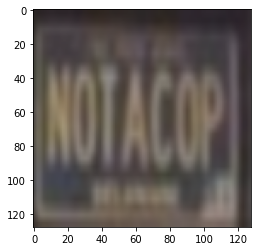

In [8]:
plt.imshow(X[6])

In [9]:
X_arr = np.array(X)

In [10]:
from sklearn.model_selection import train_test_split

In [11]:
X_train,X_test,y_train,y_test = train_test_split(X_arr,y,test_size=0.3) #use fit so will use validation_split

In [12]:
len(X_train)

3633

In [13]:
len(y_train)

3633

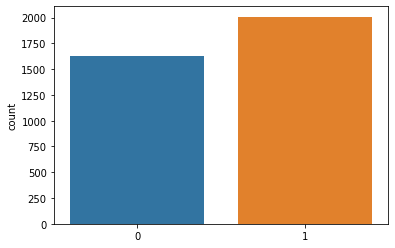

In [14]:
sns.countplot(y_train)

In [15]:
#time for model

In [16]:
from keras.models import Sequential
from keras.layers import Conv2D,MaxPool2D,Dropout,Flatten,Dense
from keras.optimizers import Adam

In [22]:
model = Sequential()

model.add(Conv2D(filters=32,kernel_size=(3,3),input_shape=(128,128,3),activation='relu'))
model.add(MaxPool2D(pool_size=(2,2)))
model.add(Conv2D(filters=64,kernel_size=(3,3),activation='relu'))
model.add(MaxPool2D(pool_size=(2,2)))
model.add(Conv2D(filters=128,kernel_size=(3,3),activation='relu'))
model.add(Conv2D(filters=128,kernel_size=(3,3),activation='relu'))
model.add(MaxPool2D(pool_size=(2,2)))
model.add(Conv2D(filters=256,kernel_size=(3,3),activation='relu'))
model.add(Conv2D(filters=256,kernel_size=(3,3),activation='relu'))
model.add(MaxPool2D(pool_size=(2,2)))


model.add(Flatten())

model.add(Dense(128,activation='relu'))
model.add(Dense(64,activation='relu'))
model.add(Dropout(rate=0.35))
model.add(Dense(1,activation='sigmoid'))

optimizer=Adam(lr=.0005)
model.compile(optimizer=optimizer,loss='binary_crossentropy',metrics=['accuracy'])

In [23]:
model.summary()

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_13 (Conv2D)           (None, 126, 126, 32)      896       
_________________________________________________________________
max_pooling2d_9 (MaxPooling2 (None, 63, 63, 32)        0         
_________________________________________________________________
conv2d_14 (Conv2D)           (None, 61, 61, 64)        18496     
_________________________________________________________________
max_pooling2d_10 (MaxPooling (None, 30, 30, 64)        0         
_________________________________________________________________
conv2d_15 (Conv2D)           (None, 28, 28, 128)       73856     
_________________________________________________________________
conv2d_16 (Conv2D)           (None, 26, 26, 128)       147584    
_________________________________________________________________
max_pooling2d_11 (MaxPooling (None, 13, 13, 128)       0         
__________

In [24]:
history = model.fit(X_train,y_train,validation_split=0.15,epochs=10)

Train on 3088 samples, validate on 545 samples
Epoch 1/10
3088/3088 [==============================] - 44s 14ms/step - loss: 0.6574 - acc: 0.7840 - val_loss: 0.3569 - val_acc: 0.8734
Epoch 2/10
3088/3088 [==============================] - 11s 4ms/step - loss: 0.3229 - acc: 0.8724 - val_loss: 0.2518 - val_acc: 0.8991
Epoch 3/10
3088/3088 [==============================] - 11s 4ms/step - loss: 0.1973 - acc: 0.9339 - val_loss: 0.5293 - val_acc: 0.9284
Epoch 4/10
3088/3088 [==============================] - 11s 4ms/step - loss: 0.2038 - acc: 0.9349 - val_loss: 0.1373 - val_acc: 0.9560
Epoch 5/10
3088/3088 [==============================] - 11s 4ms/step - loss: 0.1659 - acc: 0.9443 - val_loss: 0.2929 - val_acc: 0.9596
Epoch 6/10
3088/3088 [==============================] - 11s 4ms/step - loss: 0.1290 - acc: 0.9650 - val_loss: 0.1842 - val_acc: 0.9541
Epoch 7/10
3088/3088 [==============================] - 11s 4ms/step - loss: 0.1262 - acc: 0.9644 - val_loss: 0.1450 - val_acc: 0.9688
Epoch 8

In [25]:
model.evaluate(X_train,y_train) #model is great

3633/3633 [==============================] - 5s 1ms/step


[0.0900005996104216, 0.9760528489180317]

In [27]:
model.save('base_model.h5')

In [28]:
from sklearn.metrics import classification_report,confusion_matrix

In [32]:
print(classification_report(y_test,model.predict_classes(X_test)))

              precision    recall  f1-score   support

           0       0.97      0.97      0.97       675
           1       0.98      0.97      0.98       883

    accuracy                           0.97      1558
   macro avg       0.97      0.97      0.97      1558
weighted avg       0.97      0.97      0.97      1558



In [30]:
model.predict(X_test)

array([[9.9998367e-01],
       [5.9542218e-03],
       [4.4886142e-01],
       ...,
       [9.8756802e-01],
       [9.9798524e-01],
       [4.8902579e-16]], dtype=float32)